In [1]:
import os
import sys
import pickle
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from scipy.linalg import block_diag
from matplotlib.lines import Line2D

module_path = os.path.abspath(os.path.join('../../src'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
module_path = os.path.abspath(os.path.join('../../data'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from dynamics import Dynamics
from utils import get_form_initial_conditions
from centralized_newton import CentralizedNewton
from hybrid import Hybrid
from gauss_newton import GaussNewton

try:
    from concurrent.futures import ProcessPoolExecutor
    use_several_cpus = True
except ImportError:
    print('No concurrent.futures.ProcessPoolExecutor available')
    use_several_cpus = False

In [2]:
# Position estimation error
def position_estimation_error(X_est, X_true):
    return np.linalg.norm(X_est[:3, :, :] - X_true[:3, :, :], axis=0).flatten(), np.linalg.norm(X_est[6:9, :, :] - X_true[6:9, :, :], axis=0).flatten(), np.linalg.norm(X_est[12:15, :, :] - X_true[12:15, :, :], axis=0).flatten(), np.linalg.norm(X_est[18:21, :, :] - X_true[18:21, :, :], axis=0).flatten()

In [3]:
# Simulation parameters
dt = 60.0  # Time step [s]
K = 395  # Duration [min]
M = 1  # Number of Monte-Carlo simulations
N = 4  # Number of satellites
formation = 1
n_x = 6 
n_p = 3  
n = N * n_x
o = 3 + 3 + 2 + 1 
o_tree = 3 + 1 + 1 + 1 
H = 30 # Window size [min]
invalid_rmse = 1e20 # [m]
grad_norm_order_mag = True
grad_norm_tol = 1e-6
max_iterations = 20
dyn = Dynamics()

In [4]:
# Observation noise
r_chief_pos = 1e-1  # [m]
R_chief = np.diag(np.concatenate([r_chief_pos * np.ones(3)])) ** 2
r_deputy_pos = 1e0  # [m]
R_deputies = np.diag(np.concatenate([r_deputy_pos * np.ones(6)])) ** 2
R_deputies_tree = np.diag(np.concatenate([r_deputy_pos * np.ones(3)])) ** 2
R = block_diag(R_chief, R_deputies)
R_tree = block_diag(R_chief, R_deputies_tree)

# Initial deviation noise
p_pos_initial = 1e2  # [m]
p_vel_initial = 1e-2  # [m / s]
P_0 = np.diag(np.concatenate([p_pos_initial * np.ones(3), p_vel_initial * np.ones(3)])) ** 2
P_0 = block_diag(P_0, P_0, P_0, P_0)

In [5]:
# Seed for reproducibility
np.random.seed(42)

# Initial conditions for the state vector and true state vectors
X_initial = get_form_initial_conditions(formation)
with open(f"../../data/tudatpy_form{formation}_ts_{int(dt)}.pkl", "rb") as file:
    X_true = pickle.load(file)[:, :, :K]

# Initial position estimation error
X_est = np.zeros_like(X_true)
X_est[:, :, 0] = X_initial + np.random.multivariate_normal(np.zeros(n), P_0).reshape((n, 1))
for k in range(K - 1):
    X_est[:, :, k + 1] = dyn.f(dt, X_est[:, :, k])
position_estimation_error_1_initial, position_estimation_error_2_initial, position_estimation_error_3_initial, position_estimation_error_4_initial = position_estimation_error(X_est, X_true)

# Algorithms
newton = CentralizedNewton(H, K, o, R, grad_norm_order_mag, grad_norm_tol, max_iterations)
hybrid = Hybrid(H, K, o, R, grad_norm_order_mag, grad_norm_tol, max_iterations)
gauss_newton = GaussNewton(H, K, o, R, grad_norm_order_mag, grad_norm_tol, max_iterations)

# Observations
Y = np.zeros((o, 1, K))
Y_tree = np.zeros((o_tree, 1, K))
for k in range(K):
    Y[:, :, k] = newton.h(X_true[:, :, k]) + np.random.multivariate_normal(np.zeros(o), R).reshape((o, 1))

MHE problem:   0%|          | 0/366 [00:00<?, ?it/s]

[Hybrid] Before applying the algorithm
Cost function: 301224484.31091917
Gradient norm: 2089042806.9658494
Global estimation error: 429.5049051950654
Initial conditions estimation errors: 272.4697073631671 m, 173.20827048056321 m, 227.77973283351287 m, 168.3746081658613 m
Position estimation errors: 779.5967223627993 m, 1207.595181126871 m, 483.10528555259594 m, 358.4329736499271 m

[Gauss-Newton] Before applying the algorithm
Cost function: 301224484.3109193
Gradient norm: 2089042806.881653
Global estimation error: 429.5049051950654
Spectral radius inv(T) @ R: 0.9982040351168613
T minimum eigenvalue: 1.6050853216788106
Initial conditions estimation errors: 272.4697073631671 m, 173.20827048056321 m, 227.77973283351287 m, 168.3746081658613 m
Position estimation errors: 779.5967223627993 m, 1207.595181126871 m, 483.10528555259594 m, 358.4329736499271 m

[Hybrid] Iteration 1
Cost function: 404974.91577723005 (-99.87%)
Gradient norm: 1572914.432853373 (-99.92%)
Global estimation error: 392

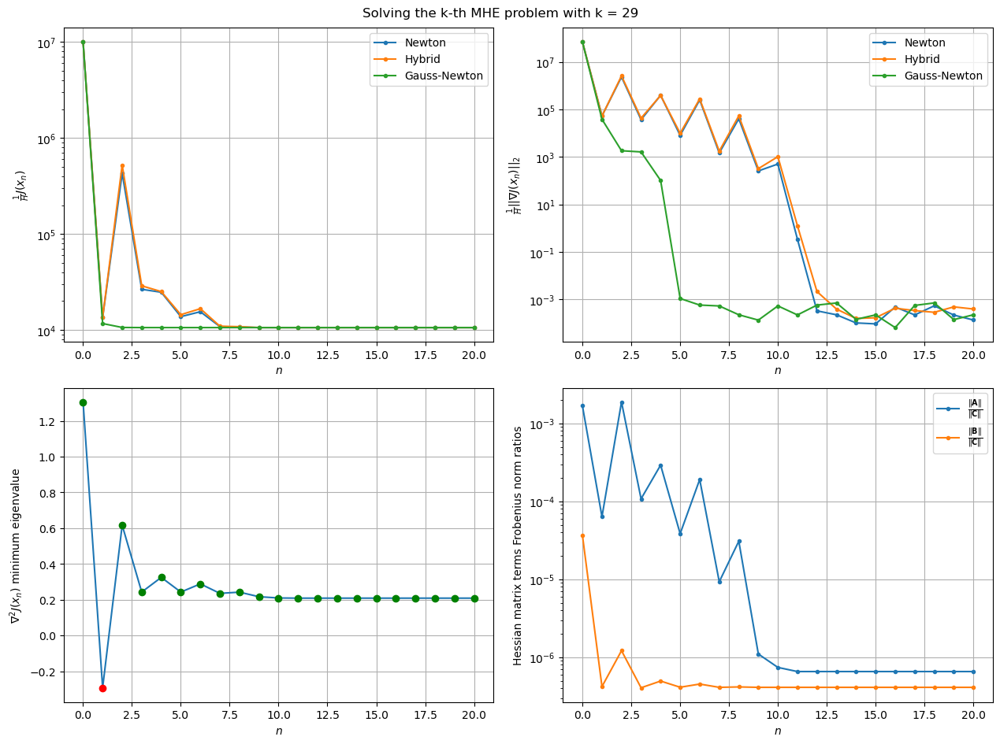

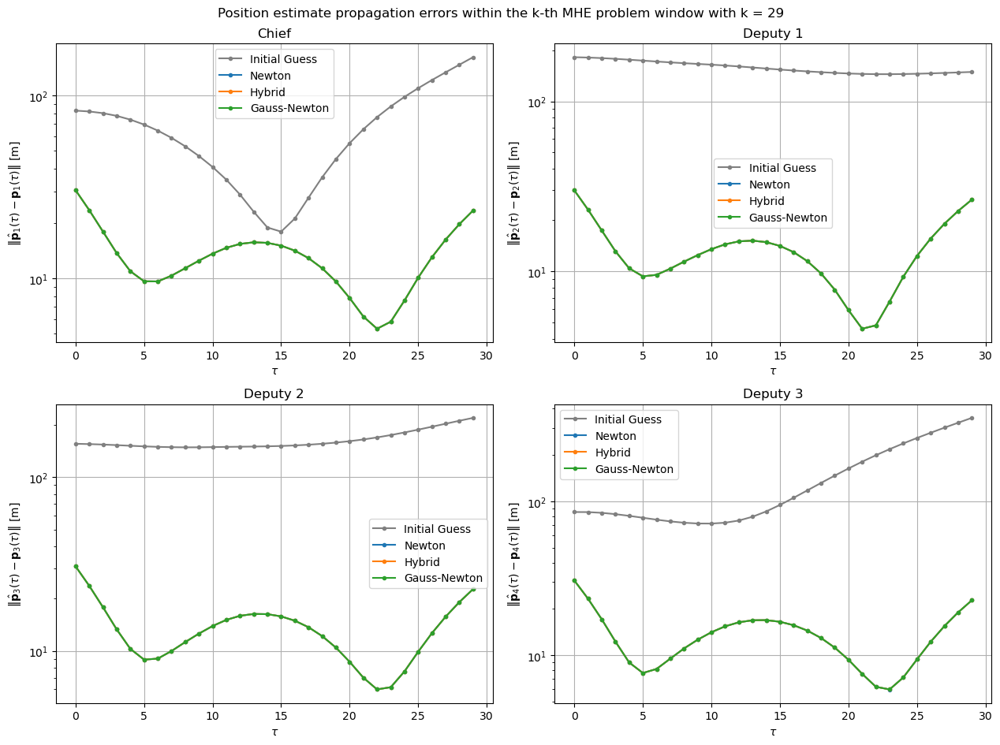

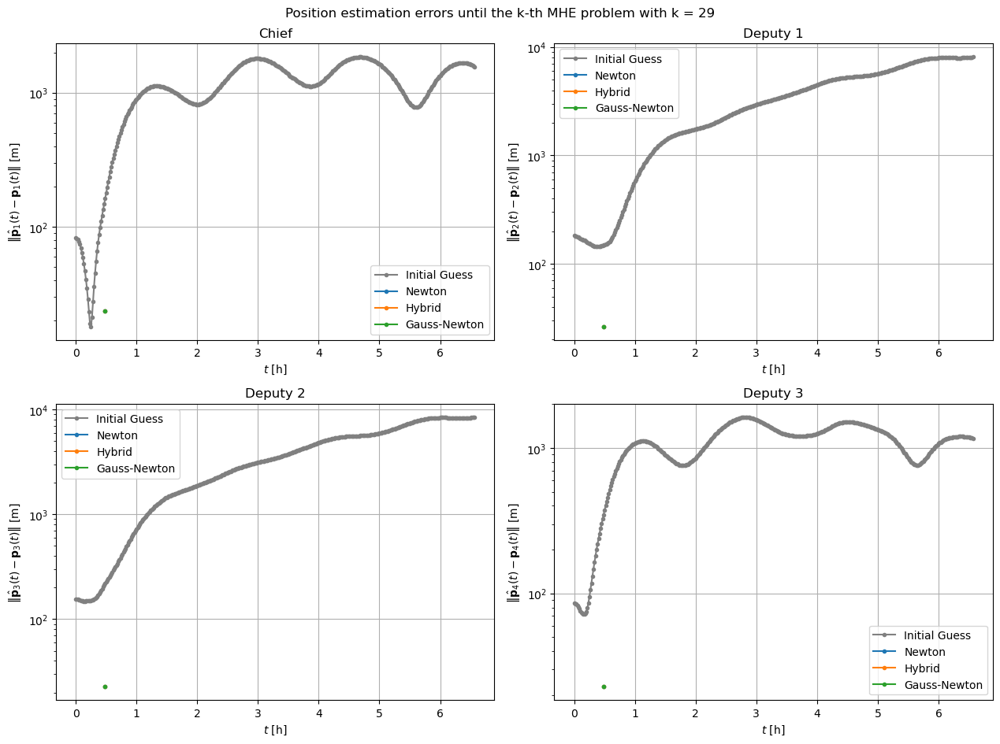

MHE problem:   0%|          | 1/366 [02:56<17:50:49, 176.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 309964.1664563853
Gradient norm: 2619507.551382956
Global estimation error: 46.845977378848794
Initial conditions estimation errors: 23.648418712075348 m, 23.03902734315846 m, 23.70257038253474 m, 23.29412076420644 m
Position estimation errors: 27.38945315399357 m, 30.263269232944676 m, 26.47570265609594 m, 26.720068166197645 m

[Gauss-Newton] Before applying the algorithm
Cost function: 309964.16644561524
Gradient norm: 2619507.543356482
Global estimation error: 46.84597738429532
Spectral radius inv(T) @ R: 0.9977249299256713
T minimum eigenvalue: 1.3057478016238544
Initial conditions estimation errors: 23.648418714529804 m, 23.039027345568595 m, 23.70257038523605 m, 23.294120767535492 m
Position estimation errors: 27.389453155081117 m, 30.263269231694835 m, 26.475702665402384 m, 26.720068178341045 m

[Hybrid] Iteration 1
Cost function: 295681.950933472 (-4.61%)
Gradient norm: 41.89127293016164 (-100.00%)
Global estimation error: 5

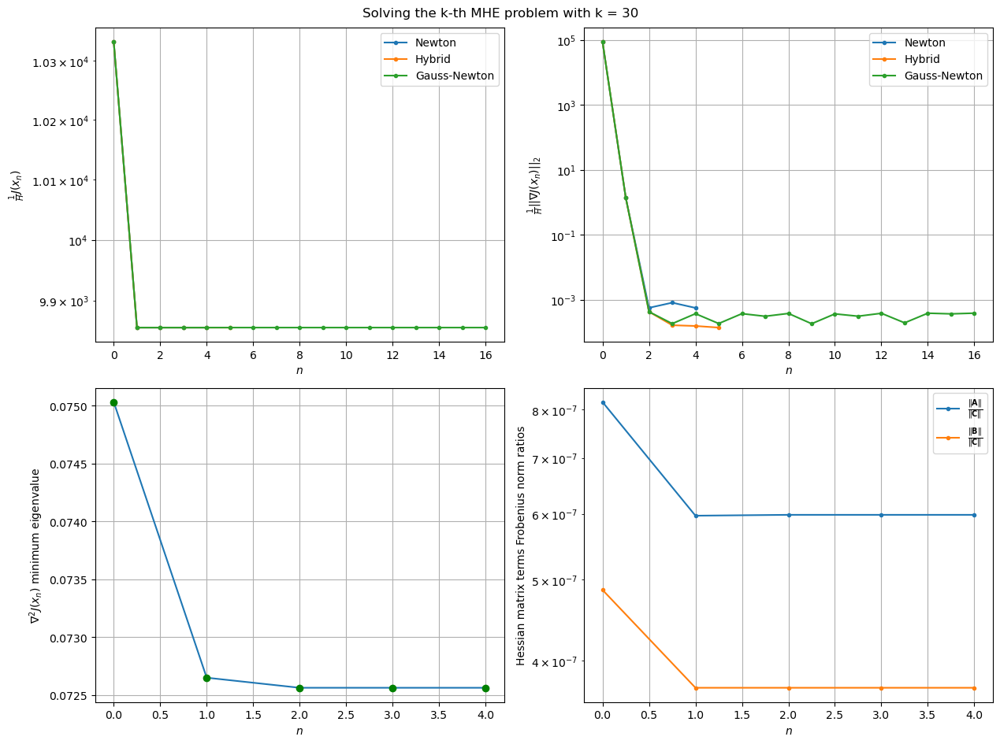

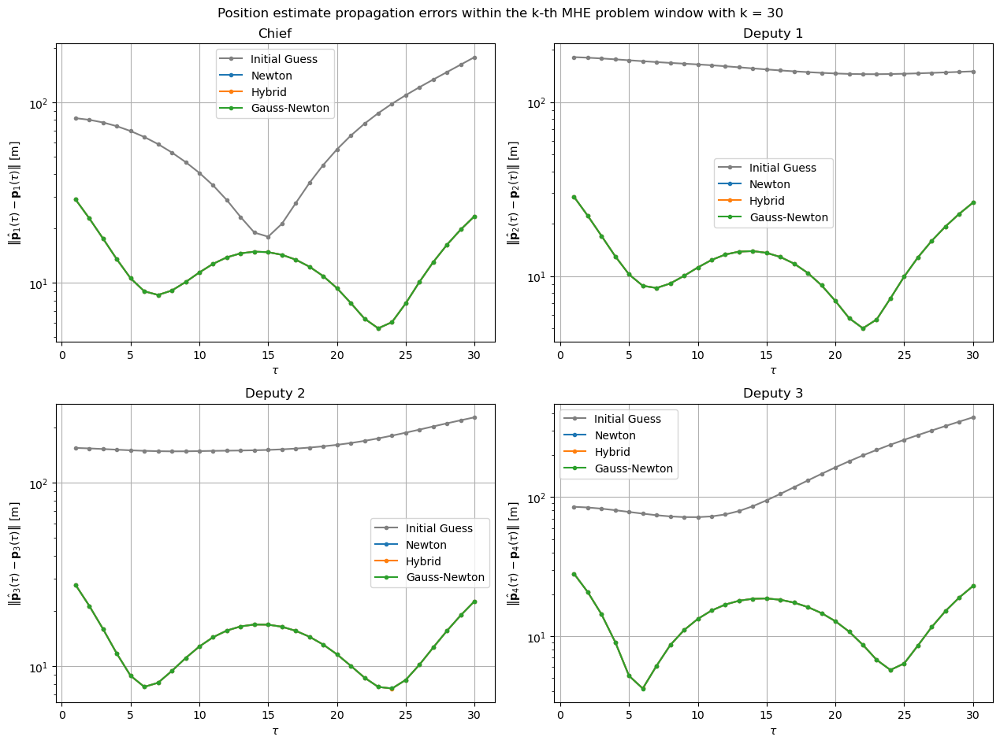

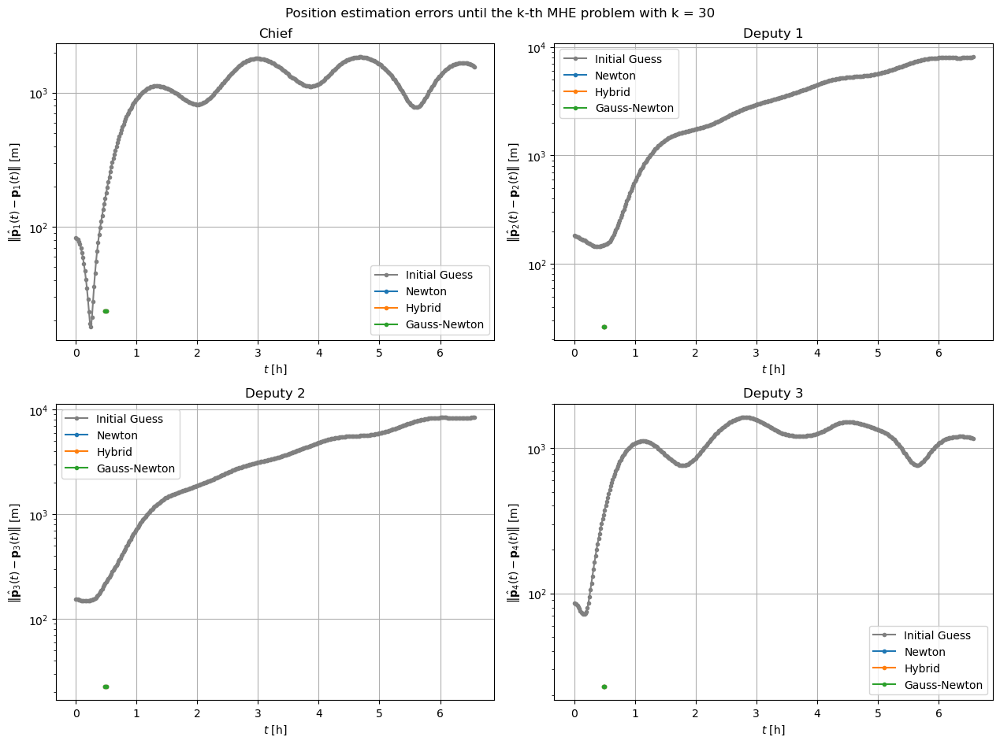

MHE problem:   1%|          | 2/366 [03:52<10:42:26, 105.90s/it]

[Hybrid] Before applying the algorithm
Cost function: 290767.88292880444
Gradient norm: 2592936.721473741
Global estimation error: 43.579604032487374
Initial conditions estimation errors: 22.78043099860274 m, 22.22842229905307 m, 21.325305139982355 m, 20.767779760580176 m
Position estimation errors: 27.20271189618084 m, 30.143067275982506 m, 26.494575897402612 m, 26.996390978526367 m

[Gauss-Newton] Before applying the algorithm
Cost function: 290767.8829257543
Gradient norm: 2592936.7163668624
Global estimation error: 43.57960403855055
Spectral radius inv(T) @ R: 0.9975893200510383
T minimum eigenvalue: 0.80137708703007
Initial conditions estimation errors: 22.780431000526555 m, 22.228422301640922 m, 21.325305142956775 m, 20.767779765368715 m
Position estimation errors: 27.202711898313687 m, 30.143067277760757 m, 26.494575887479314 m, 26.99639096680383 m

[Hybrid] Iteration 1
Cost function: 277310.3149092355 (-4.63%)
Gradient norm: 61.22351800037281 (-100.00%)
Global estimation error:

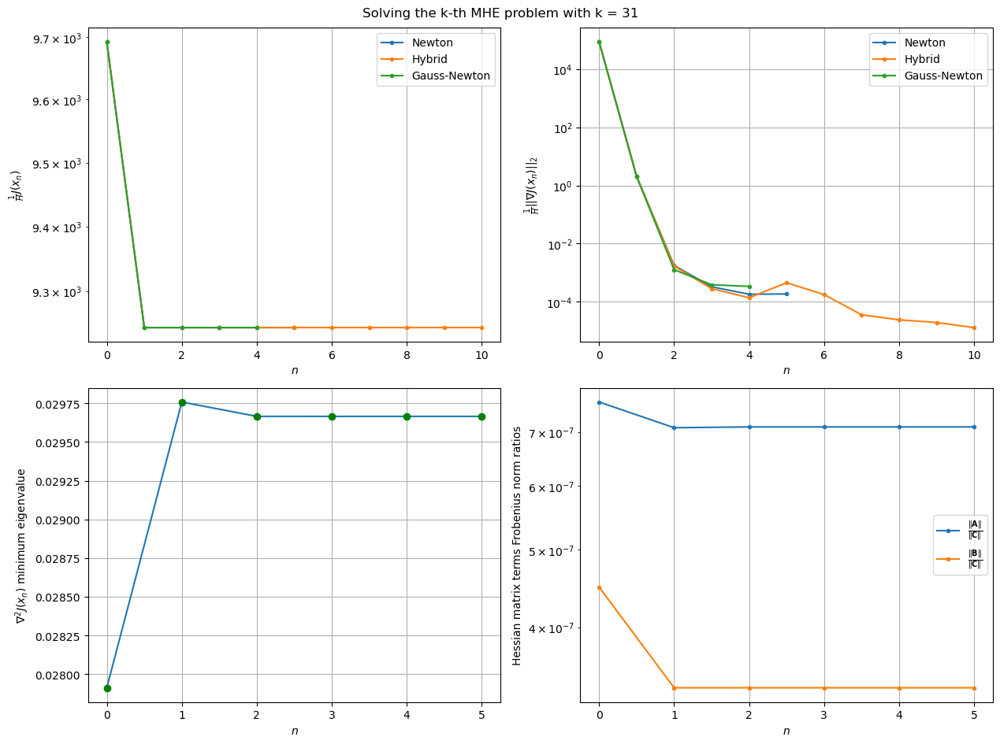

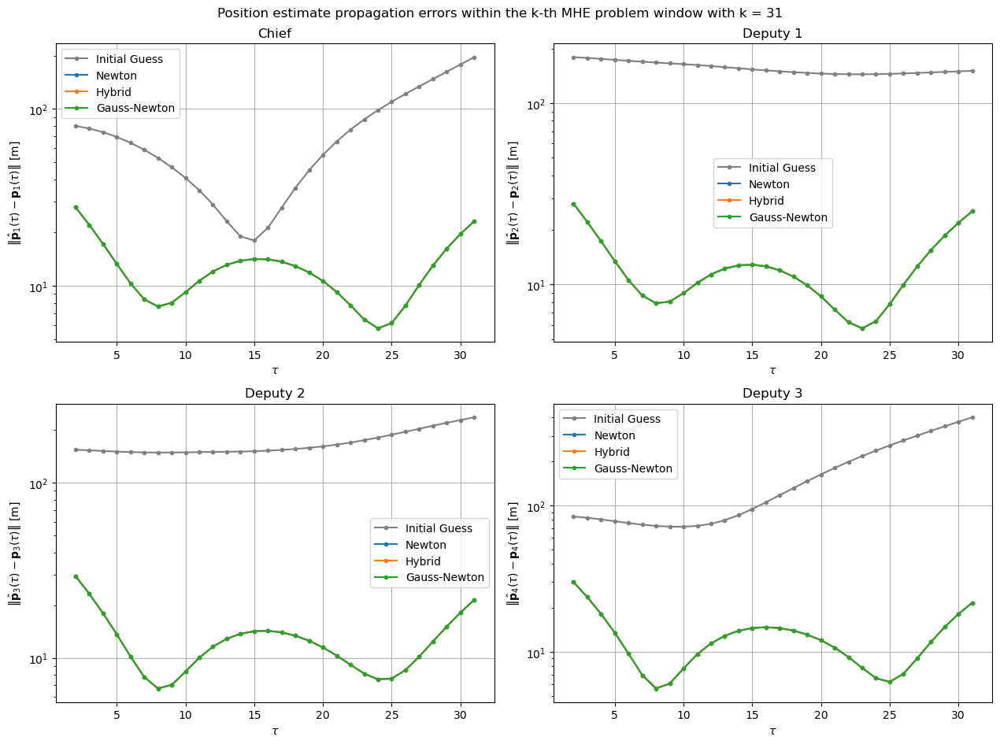

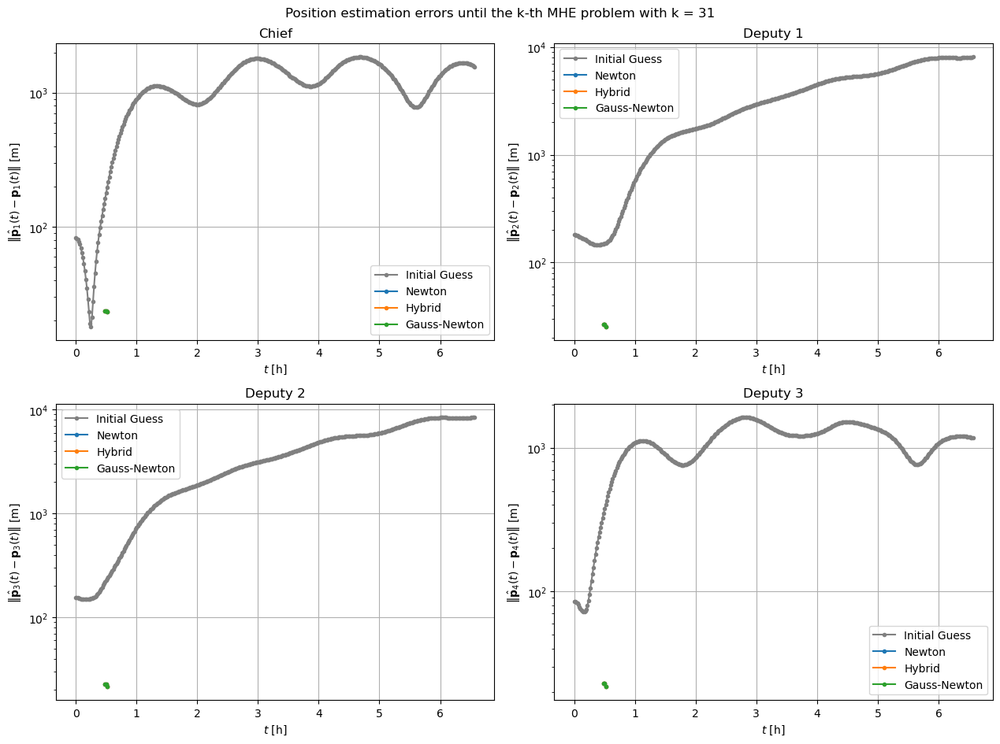

MHE problem:   1%|          | 3/366 [04:52<8:31:39, 84.57s/it]  

[Hybrid] Before applying the algorithm
Cost function: 273824.9925228524
Gradient norm: 2624164.1236078525
Global estimation error: 45.5998239636694
Initial conditions estimation errors: 22.08607518018237 m, 22.160451607008635 m, 23.243200855328304 m, 23.667824624063332 m
Position estimation errors: 26.695855070355204 m, 28.833672224749428 m, 24.9357281754483 m, 25.240079215104423 m

[Gauss-Newton] Before applying the algorithm
Cost function: 273824.9925219957
Gradient norm: 2624164.126280992
Global estimation error: 45.59982320310224
Spectral radius inv(T) @ R: 0.9982395047265268
T minimum eigenvalue: 0.5034155841856189
Initial conditions estimation errors: 22.086075181978757 m, 22.160451630107268 m, 23.24320017765536 m, 23.667823800922314 m
Position estimation errors: 26.695855072486445 m, 28.833672162718038 m, 24.935729058889056 m, 25.240080373982803 m

[Hybrid] Iteration 1
Cost function: 261052.63671696253 (-4.66%)
Gradient norm: 101.50228828030431 (-100.00%)
Global estimation error

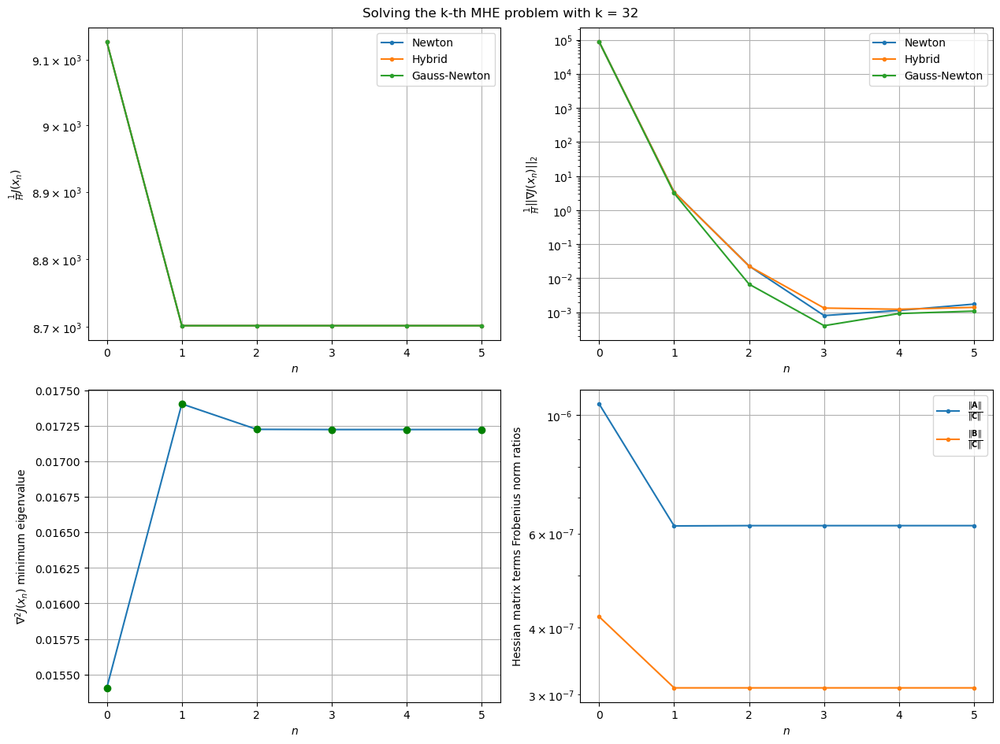

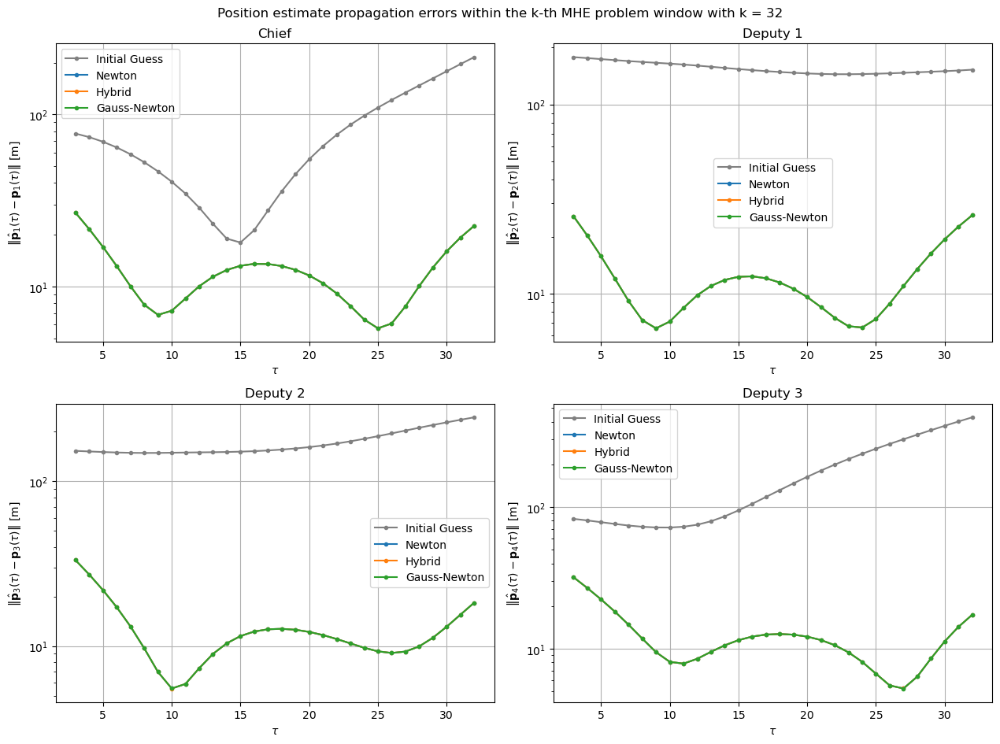

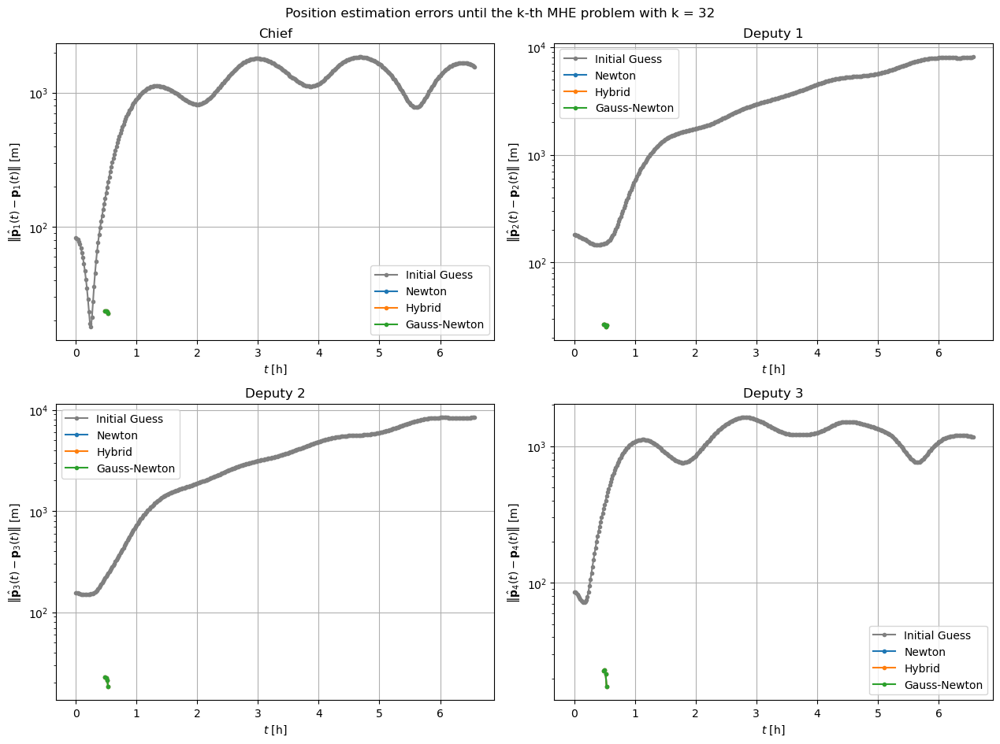

MHE problem:   1%|          | 4/366 [05:51<7:30:10, 74.62s/it]

[Hybrid] Before applying the algorithm
Cost function: 258016.21382542152
Gradient norm: 2726644.215849355
Global estimation error: 48.339504697321836
Initial conditions estimation errors: 21.56797741004889 m, 20.30020985997696 m, 27.17058407516976 m, 26.85420333348615 m
Position estimation errors: 25.810101226724697 m, 29.371987379364377 m, 21.46491101205494 m, 20.467906886948267 m

[Gauss-Newton] Before applying the algorithm
Cost function: 258016.21380929113
Gradient norm: 2726644.1719828807
Global estimation error: 48.33950486432928
Spectral radius inv(T) @ R: 0.9989647551847114
T minimum eigenvalue: 0.3295111068680315
Initial conditions estimation errors: 21.56797741254245 m, 20.300209861630993 m, 27.170584199904734 m, 26.85420350465375 m
Position estimation errors: 25.810101224413092 m, 29.371987380446868 m, 21.464910928744498 m, 20.467906774152514 m

[Hybrid] Iteration 1
Cost function: 246112.46408635605 (-4.61%)
Gradient norm: 21.620644576718274 (-100.00%)
Global estimation erro

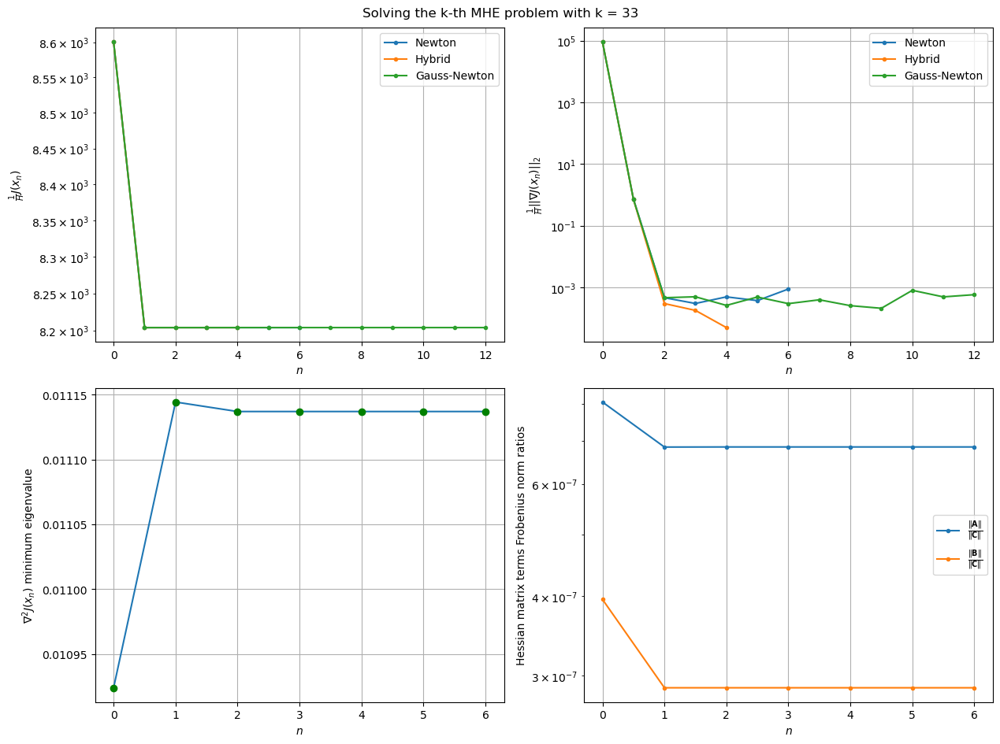

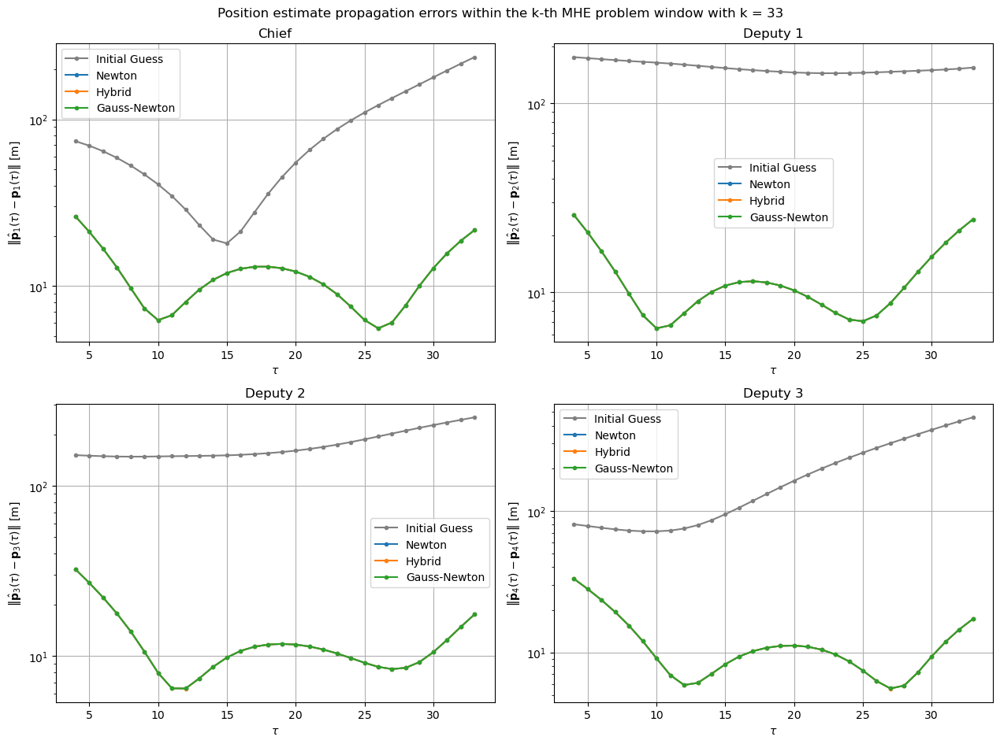

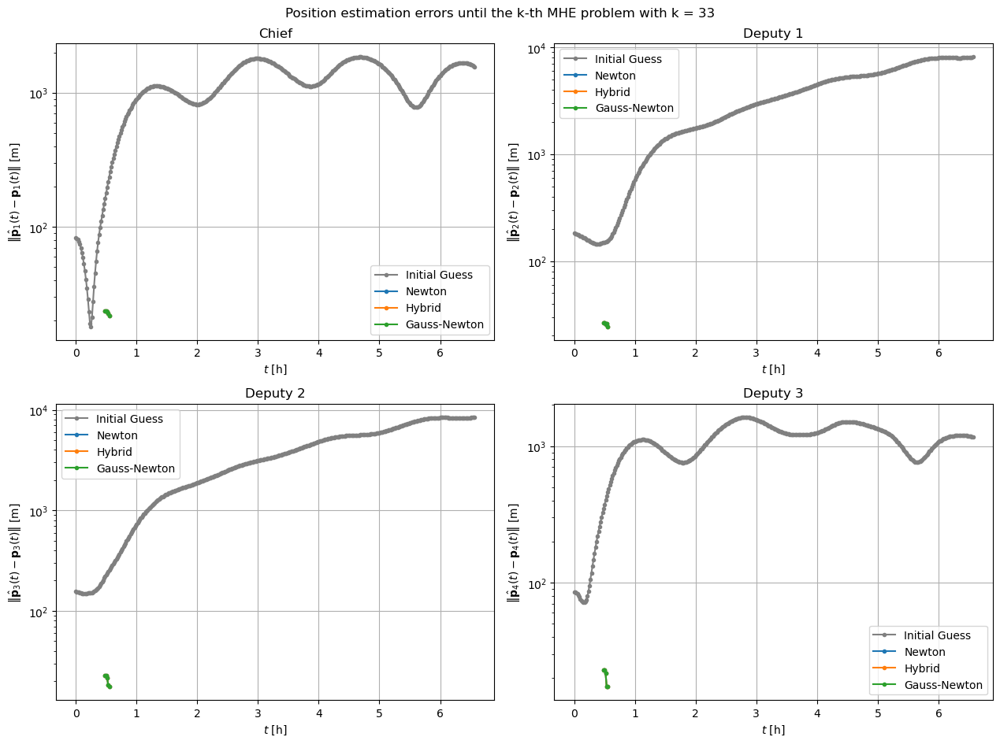

MHE problem:   1%|▏         | 5/366 [07:01<7:20:01, 73.14s/it]

[Hybrid] Before applying the algorithm
Cost function: 242488.87084428445
Gradient norm: 2869612.8668894772
Global estimation error: 48.870212353762255
Initial conditions estimation errors: 21.13932393575284 m, 20.746580038324065 m, 26.907618494993436 m, 28.052630000625577 m
Position estimation errors: 24.5827395380287 m, 27.465426952995596 m, 20.53101592474192 m, 19.916206266721783 m

[Gauss-Newton] Before applying the algorithm
Cost function: 242488.87085115493
Gradient norm: 2869612.8779729875
Global estimation error: 48.87021241744416
Spectral radius inv(T) @ R: 0.9993472542227415
T minimum eigenvalue: 0.22357951257971112
Initial conditions estimation errors: 21.139323937689788 m, 20.746580041933935 m, 26.907618542059414 m, 28.05263006229098 m
Position estimation errors: 24.582739540873373 m, 27.465426950038356 m, 20.531015922773836 m, 19.91620625985408 m

[Hybrid] Iteration 1
Cost function: 231381.77127909067 (-4.58%)
Gradient norm: 130.4267465809373 (-100.00%)
Global estimation er

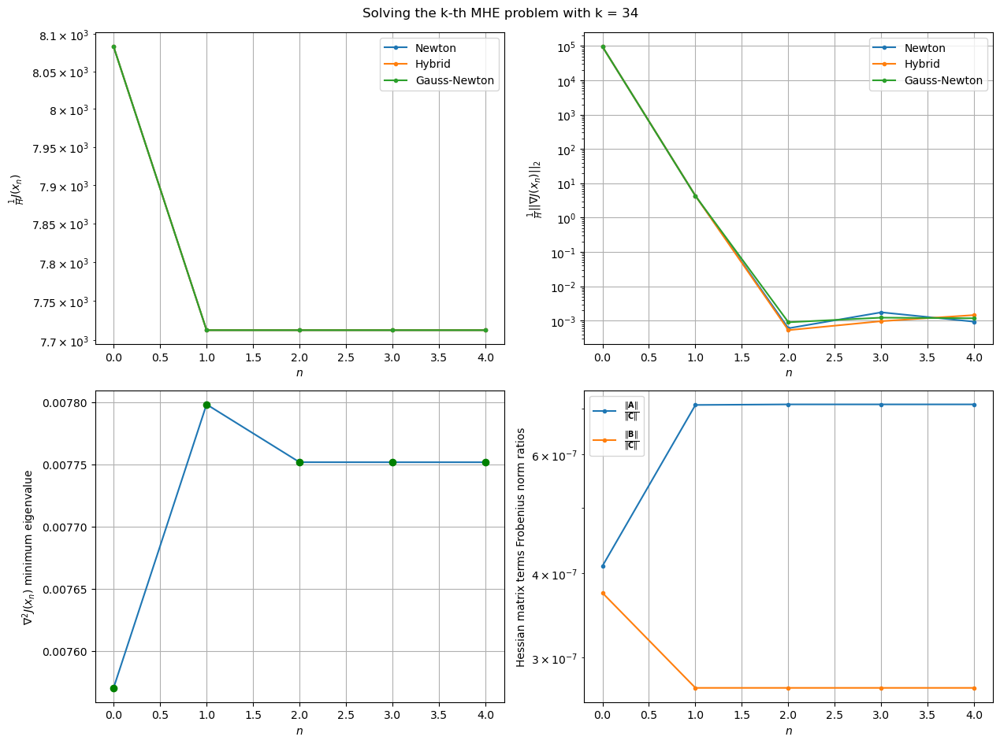

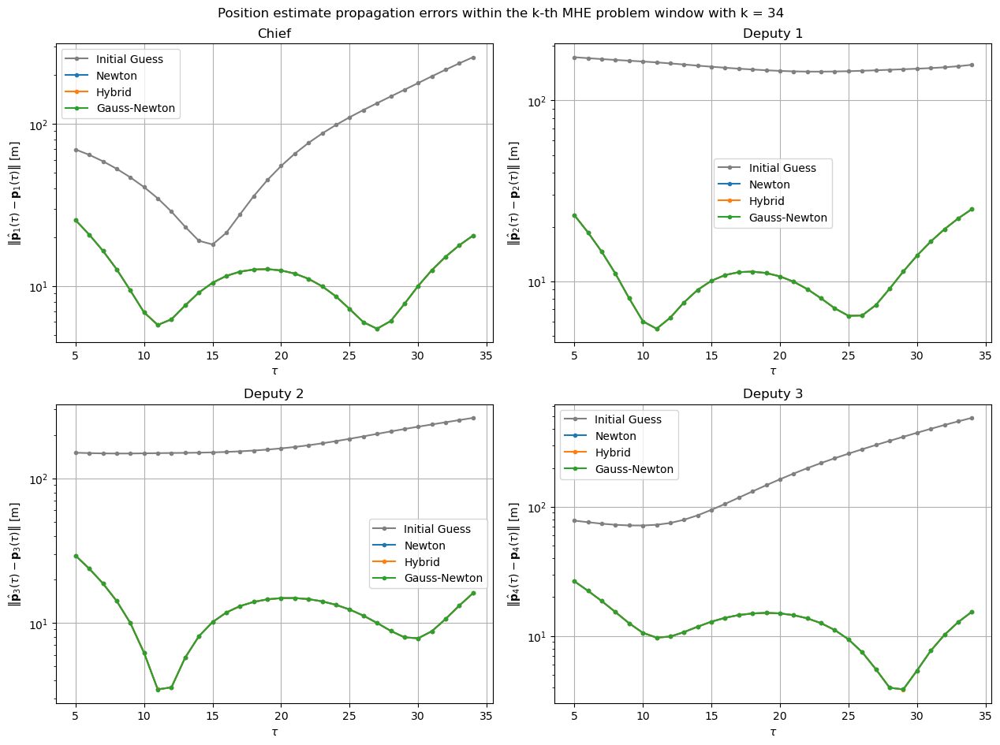

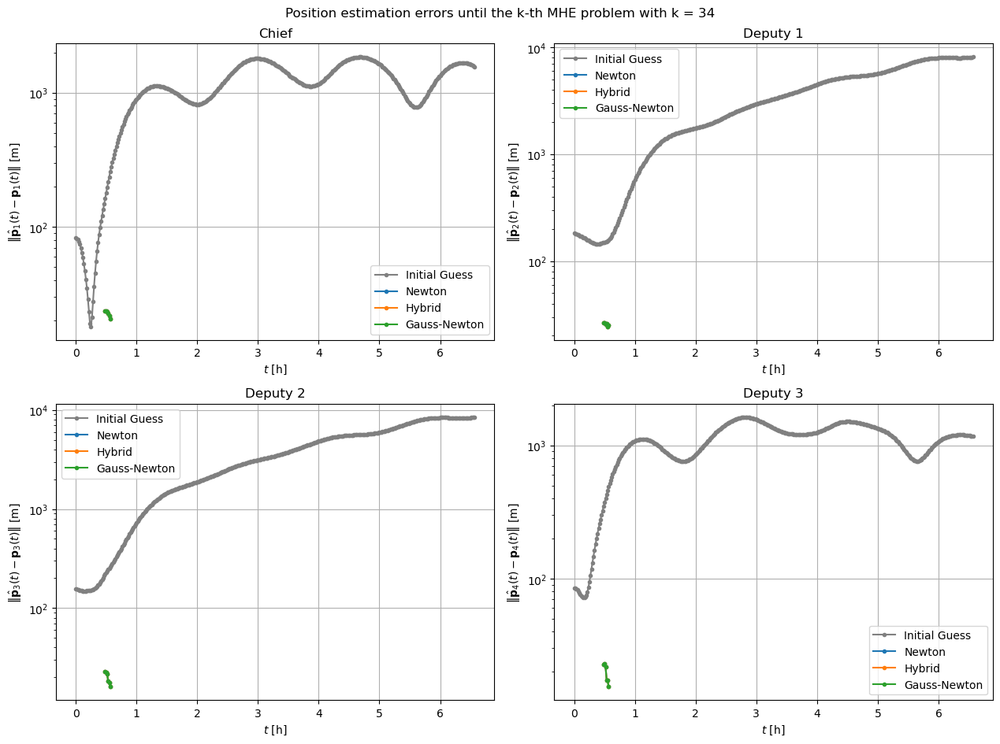

MHE problem:   2%|▏         | 6/366 [08:00<6:48:25, 68.07s/it]

[Hybrid] Before applying the algorithm
Cost function: 225795.97688166905
Gradient norm: 2992342.046085847
Global estimation error: 42.90796720950212
Initial conditions estimation errors: 20.742018707749864 m, 18.62019314913938 m, 23.733693028057072 m, 22.379268411426292 m
Position estimation errors: 23.02013295250761 m, 27.79344869807687 m, 19.025832287816 m, 17.94440535533679 m

[Gauss-Newton] Before applying the algorithm
Cost function: 225795.9768788454
Gradient norm: 2992342.050287985
Global estimation error: 42.9079669825198
Spectral radius inv(T) @ R: 0.9995441862521467
T minimum eigenvalue: 0.1578497281345795
Initial conditions estimation errors: 20.742018709874905 m, 18.620193148495392 m, 23.733692862916655 m, 22.379268149932628 m
Position estimation errors: 23.0201329541734 m, 27.7934487084593 m, 19.025832377107427 m, 17.944405468990805 m

[Hybrid] Iteration 1
Cost function: 215523.90039699926 (-4.55%)
Gradient norm: 84.16685367846796 (-100.00%)
Global estimation error: 48.985

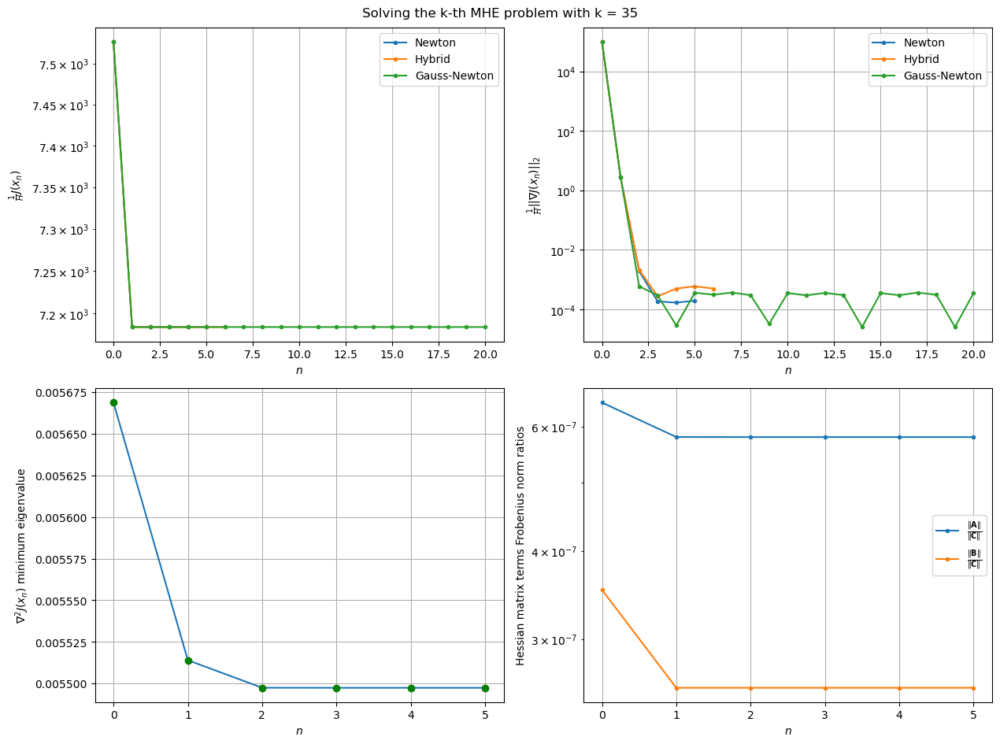

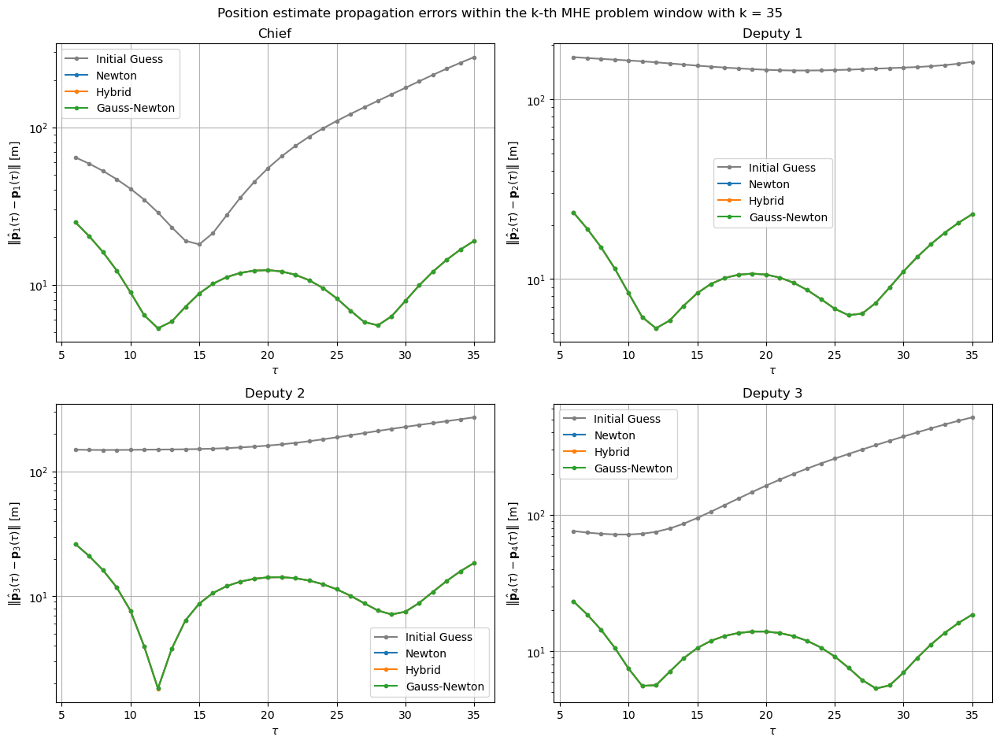

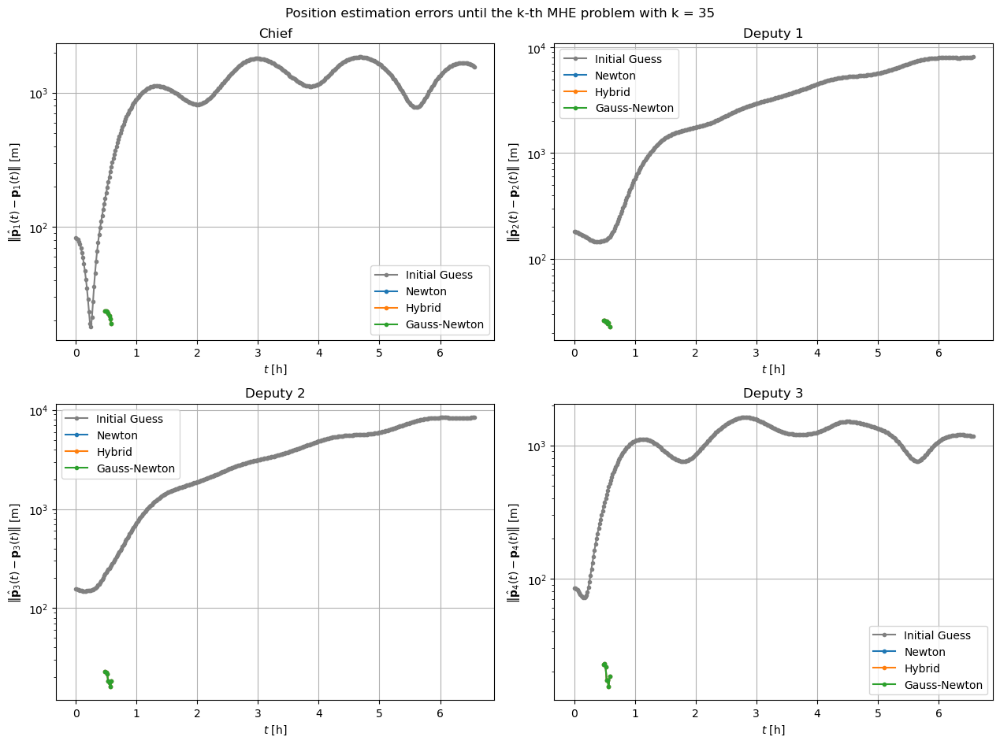

MHE problem:   2%|▏         | 7/366 [09:05<6:41:43, 67.14s/it]

[Hybrid] Before applying the algorithm
Cost function: 207015.53069206665
Gradient norm: 3180298.5259513482
Global estimation error: 39.45994334170797
Initial conditions estimation errors: 20.30907670602614 m, 19.007237640388034 m, 20.93317975107248 m, 18.57762245750128 m
Position estimation errors: 21.19227727341127 m, 25.24943120984974 m, 21.097782080093527 m, 20.959610332705473 m

[Gauss-Newton] Before applying the algorithm
Cost function: 207015.53068370503
Gradient norm: 3180298.5025982154
Global estimation error: 39.45994330395797
Spectral radius inv(T) @ R: 0.9996943491409088
T minimum eigenvalue: 0.11331497587639343
Initial conditions estimation errors: 20.309076707455603 m, 19.00723764237216 m, 20.933179721662036 m, 18.577622406864855 m
Position estimation errors: 21.192277270936092 m, 25.24943121537965 m, 21.097782084164113 m, 20.959610336491405 m

[Hybrid] Iteration 1
Cost function: 197686.20292428797 (-4.51%)
Gradient norm: 195.39617455792683 (-99.99%)
Global estimation erro

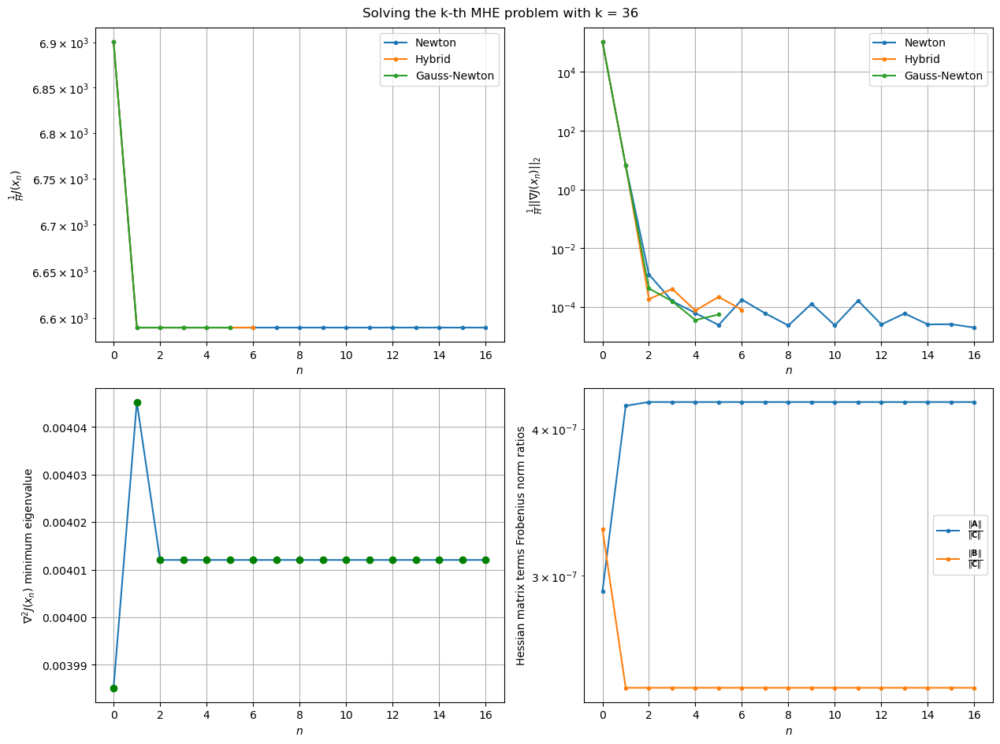

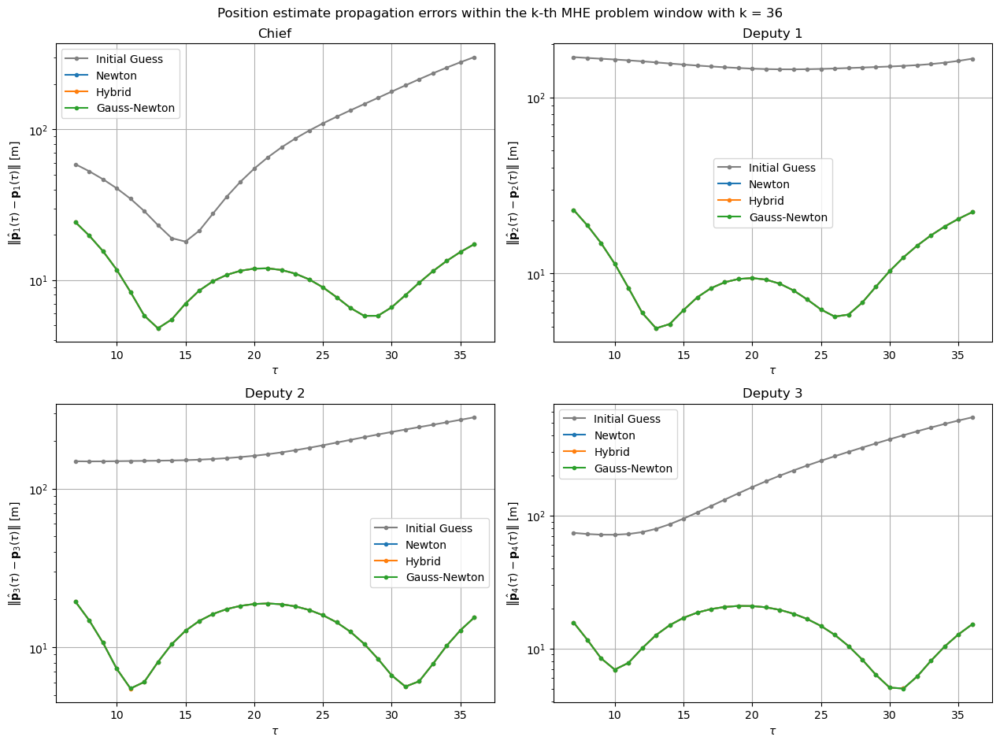

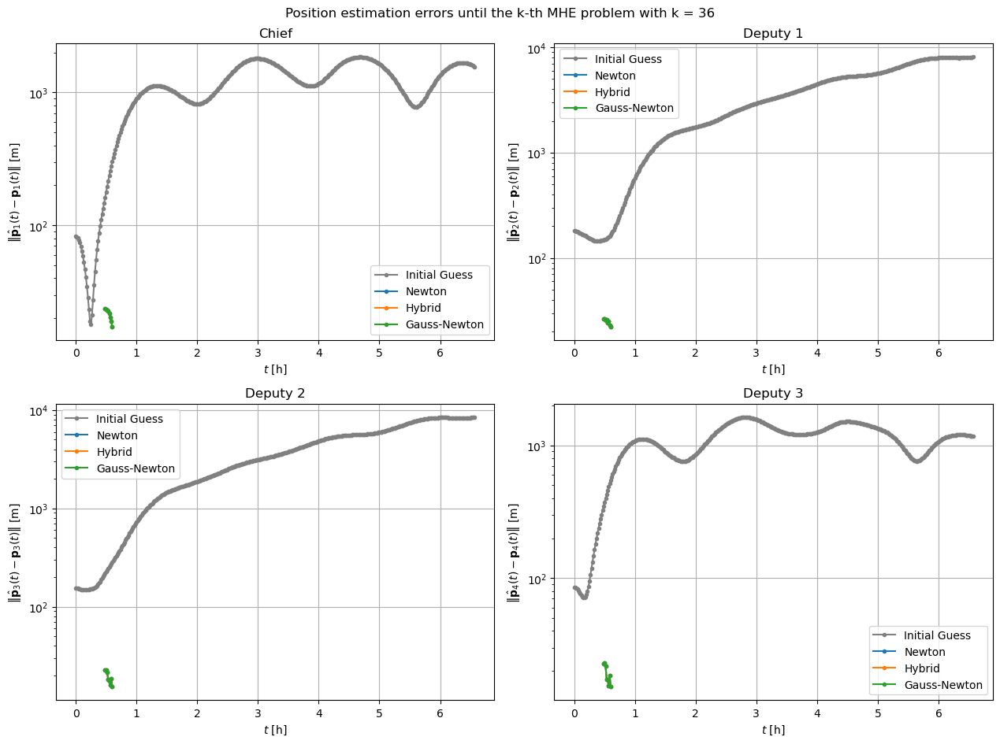

MHE problem:   2%|▏         | 8/366 [11:20<8:49:14, 88.70s/it]

[Hybrid] Before applying the algorithm
Cost function: 186655.03934671564
Gradient norm: 3307442.3315254906
Global estimation error: 33.11644782460692
Initial conditions estimation errors: 19.760060120410387 m, 18.76587082191996 m, 14.771458571702377 m, 11.655896761937653 m
Position estimation errors: 19.23766123614929 m, 24.090328370479966 m, 17.96746831334743 m, 17.63366707308412 m

[Gauss-Newton] Before applying the algorithm
Cost function: 186655.03934237597
Gradient norm: 3307442.3315747413
Global estimation error: 33.1164477612003
Spectral radius inv(T) @ R: 0.9997892293496087
T minimum eigenvalue: 0.08327542692520626
Initial conditions estimation errors: 19.760060121119942 m, 18.765870822426912 m, 14.77145851399123 m, 11.655896652905904 m
Position estimation errors: 19.237661235980564 m, 24.090328380362525 m, 17.96746831396107 m, 17.63366707785048 m

[Hybrid] Iteration 1
Cost function: 178471.78047364354 (-4.38%)
Gradient norm: 136.28494023532414 (-100.00%)
Global estimation erro

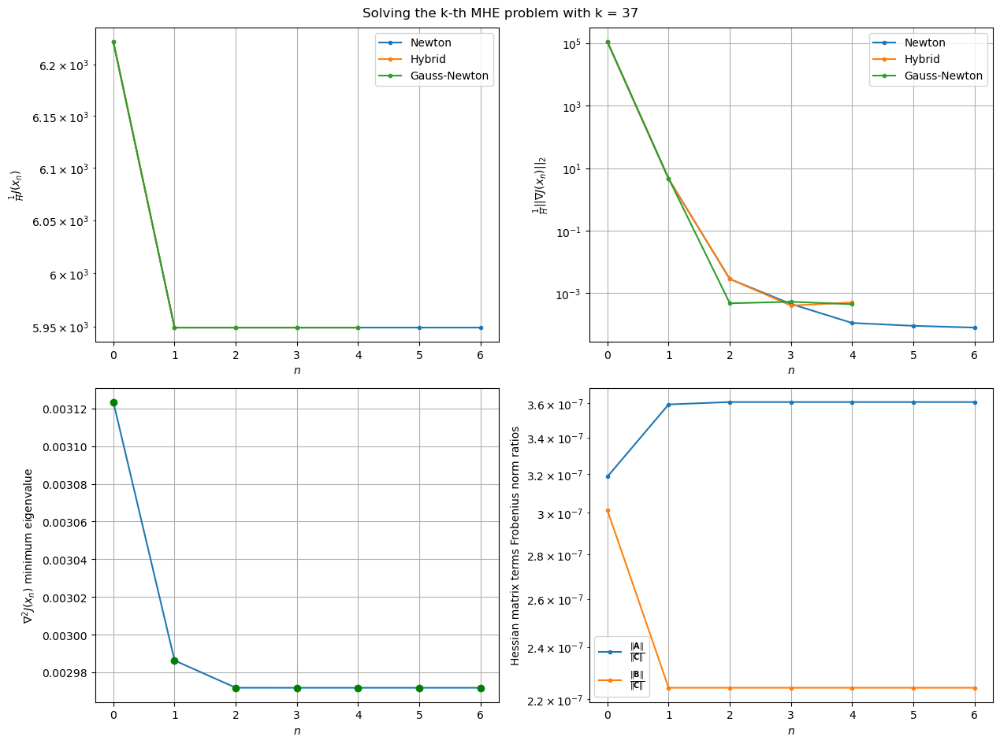

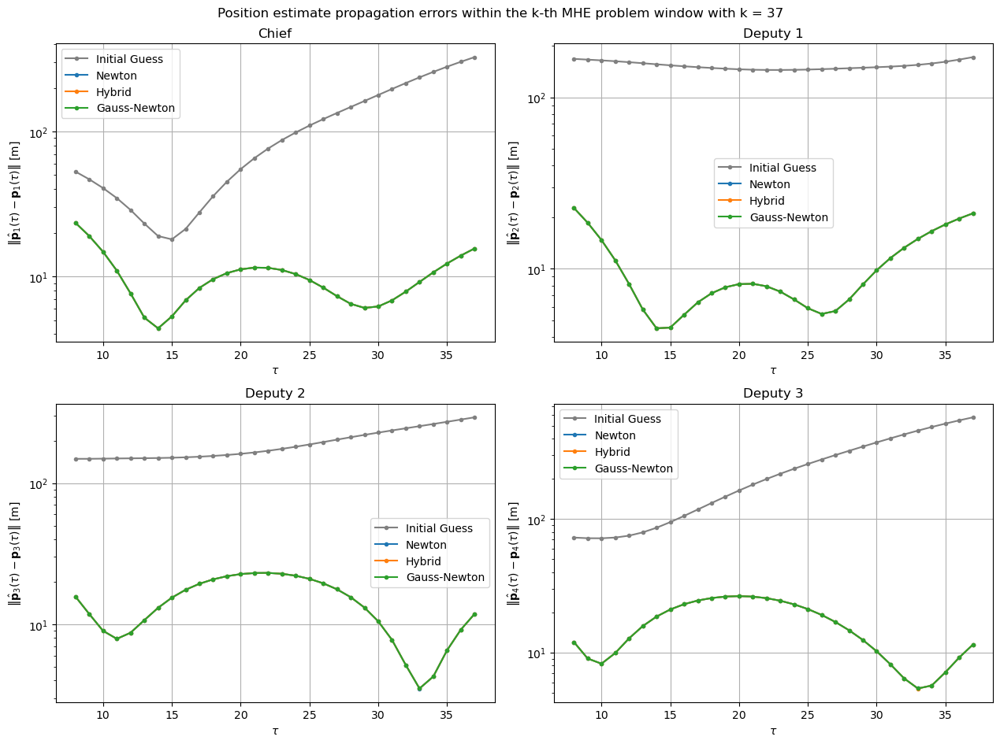

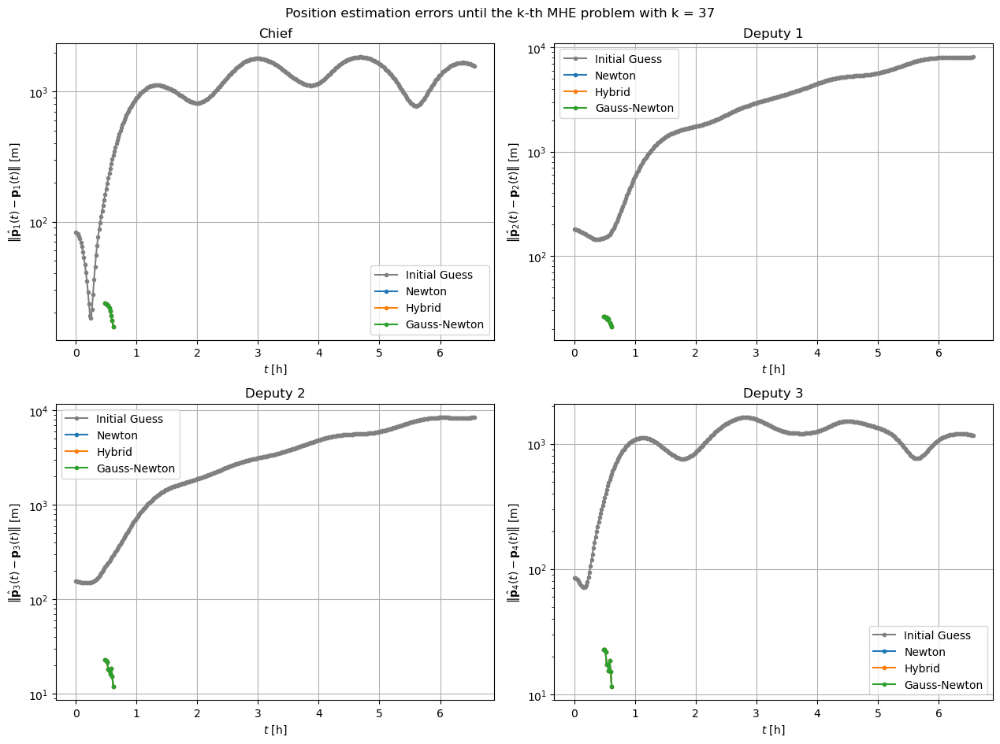

MHE problem:   2%|▏         | 9/366 [12:21<7:56:32, 80.09s/it]

[Hybrid] Before applying the algorithm
Cost function: 165956.01008045385
Gradient norm: 3560220.2014508136
Global estimation error: 30.422962439230332
Initial conditions estimation errors: 18.988120267028567 m, 18.547060032591762 m, 11.815080092374137 m, 9.021805880454567 m
Position estimation errors: 17.367537800704156 m, 22.51476468985866 m, 14.572495565332682 m, 13.95379335880342 m

[Gauss-Newton] Before applying the algorithm
Cost function: 165956.0100846392
Gradient norm: 3560220.228415081
Global estimation error: 30.42296240029146
Spectral radius inv(T) @ R: 0.9998487407924768
T minimum eigenvalue: 0.06223174216269834
Initial conditions estimation errors: 18.988120267365243 m, 18.547060032654727 m, 11.815080046243292 m, 9.021805808720872 m
Position estimation errors: 17.367537804625663 m, 22.514764712103933 m, 14.572495545604419 m, 13.953793344927728 m

[Hybrid] Iteration 1
Cost function: 158787.53942033107 (-4.32%)
Gradient norm: 52.47950626862453 (-100.00%)
Global estimation er

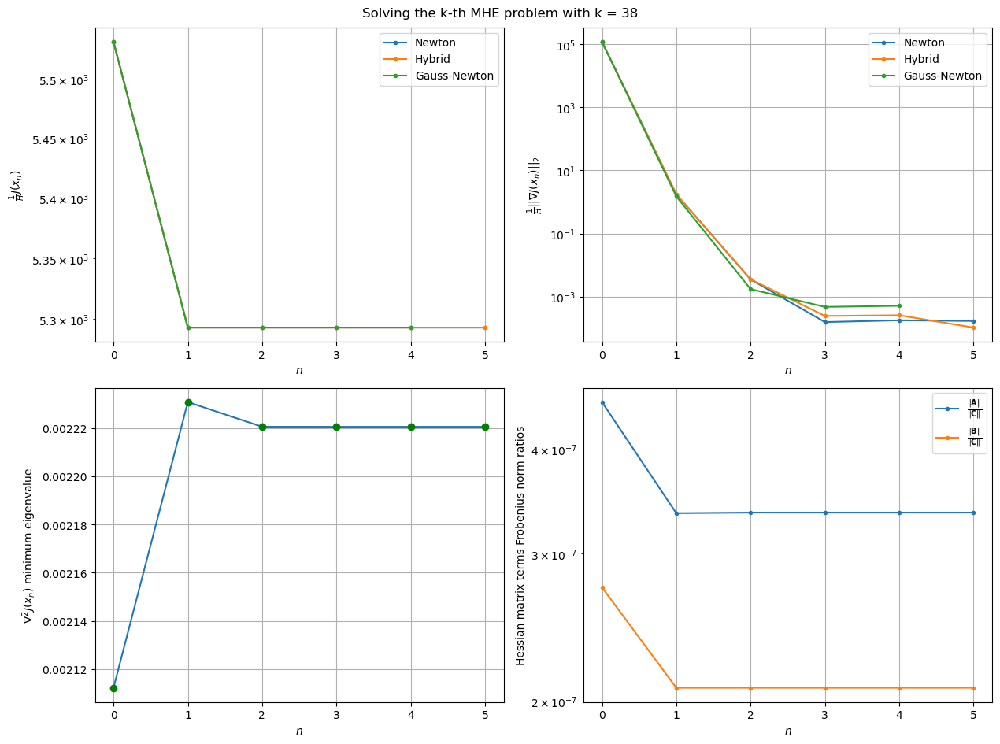

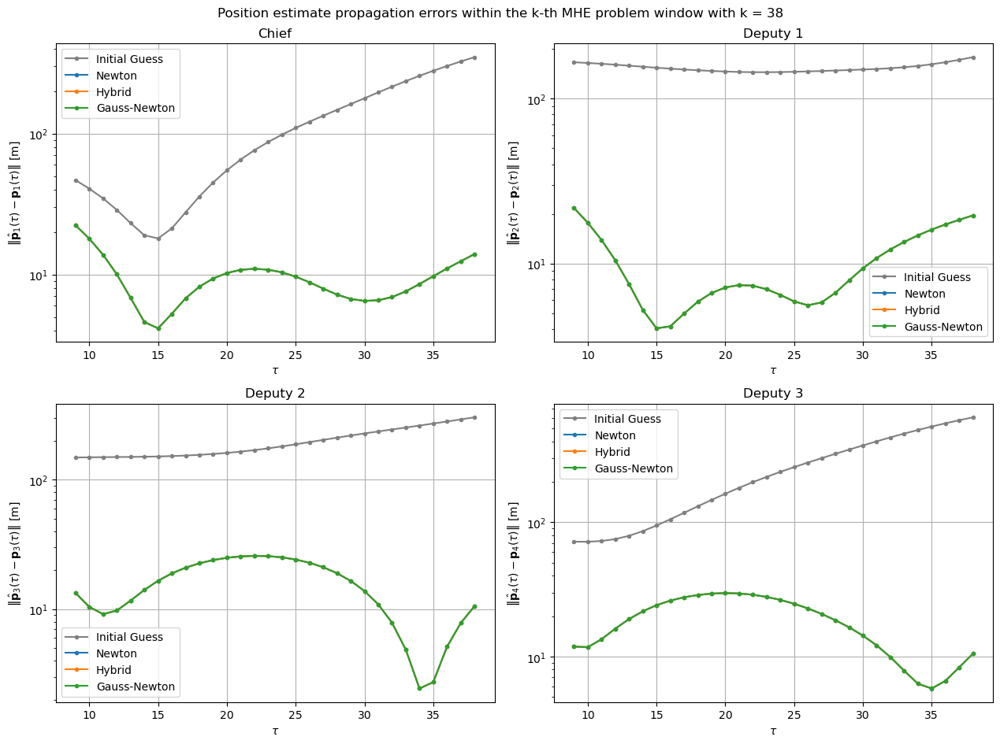

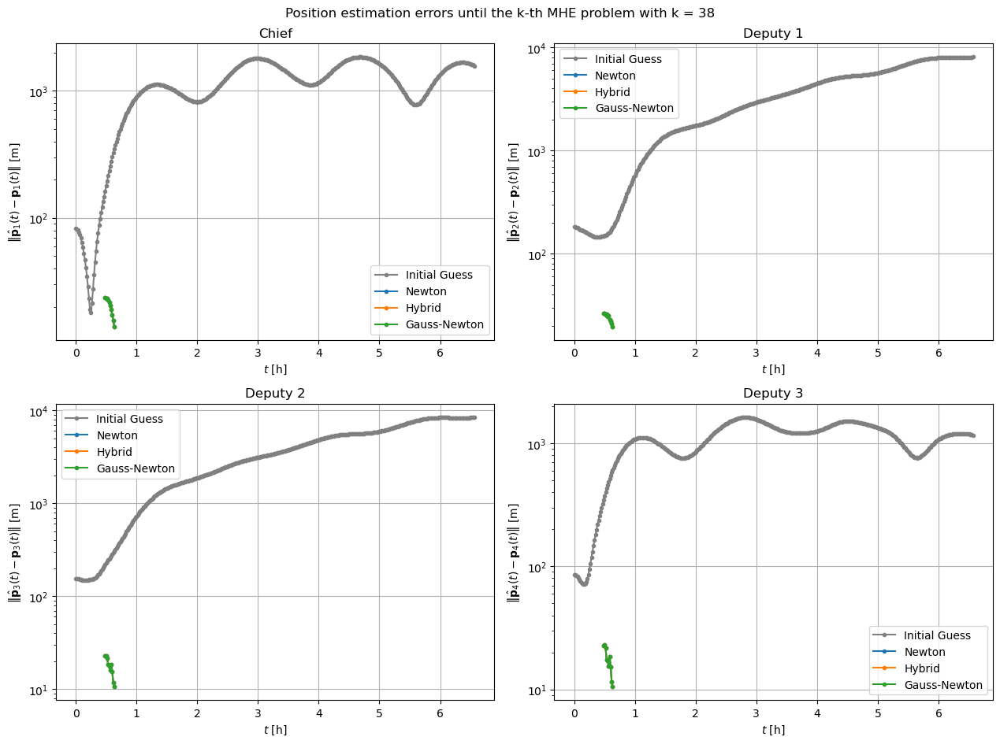

MHE problem:   3%|▎         | 10/366 [13:15<7:07:12, 72.00s/it]

[Hybrid] Before applying the algorithm
Cost function: 146311.89505420436
Gradient norm: 3650260.4896649686
Global estimation error: 29.712090065579275
Initial conditions estimation errors: 17.96481747755948 m, 17.703479485237693 m, 10.431355504781738 m, 11.739757719529655 m
Position estimation errors: 15.738450095585646 m, 20.943268646547867 m, 13.438614597410394 m, 13.001508305716651 m

[Gauss-Newton] Before applying the algorithm
Cost function: 146311.89505588397
Gradient norm: 3650260.506192277
Global estimation error: 29.71208973042507
Spectral radius inv(T) @ R: 0.9998874779755466
T minimum eigenvalue: 0.04765623391069959
Initial conditions estimation errors: 17.96481747798914 m, 17.703479504543036 m, 10.43135539125905 m, 11.739756942402432 m
Position estimation errors: 15.738450098662033 m, 20.9432682729593 m, 13.438614430779078 m, 13.0015082254961 m

[Hybrid] Iteration 1
Cost function: 140122.78564031463 (-4.23%)
Gradient norm: 410.8604819527936 (-99.99%)
Global estimation error

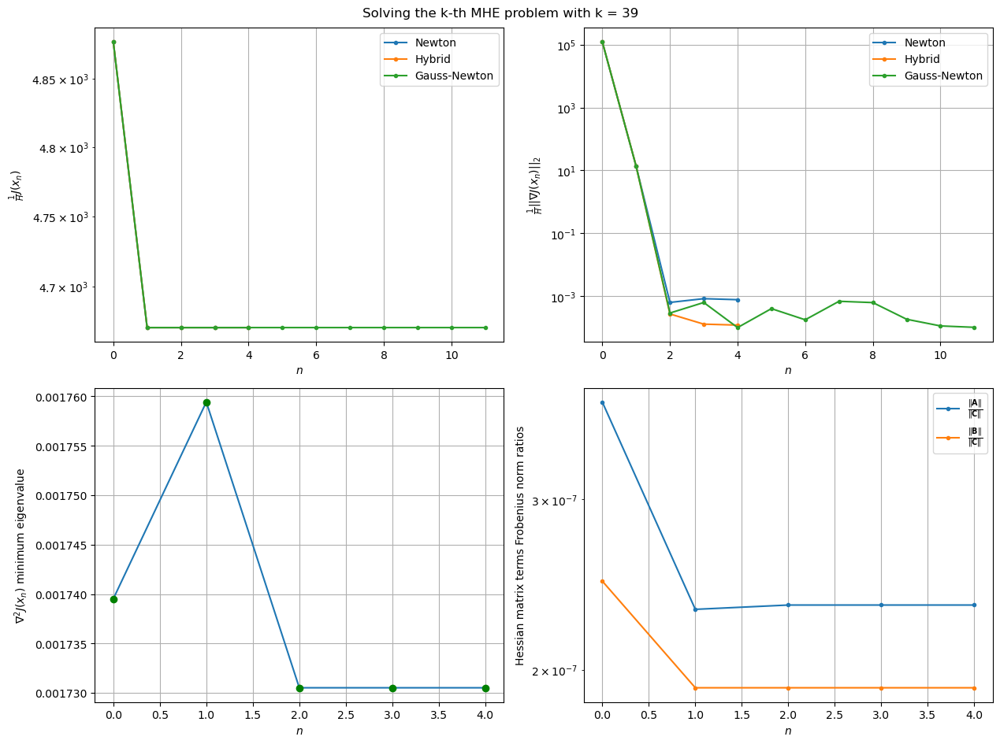

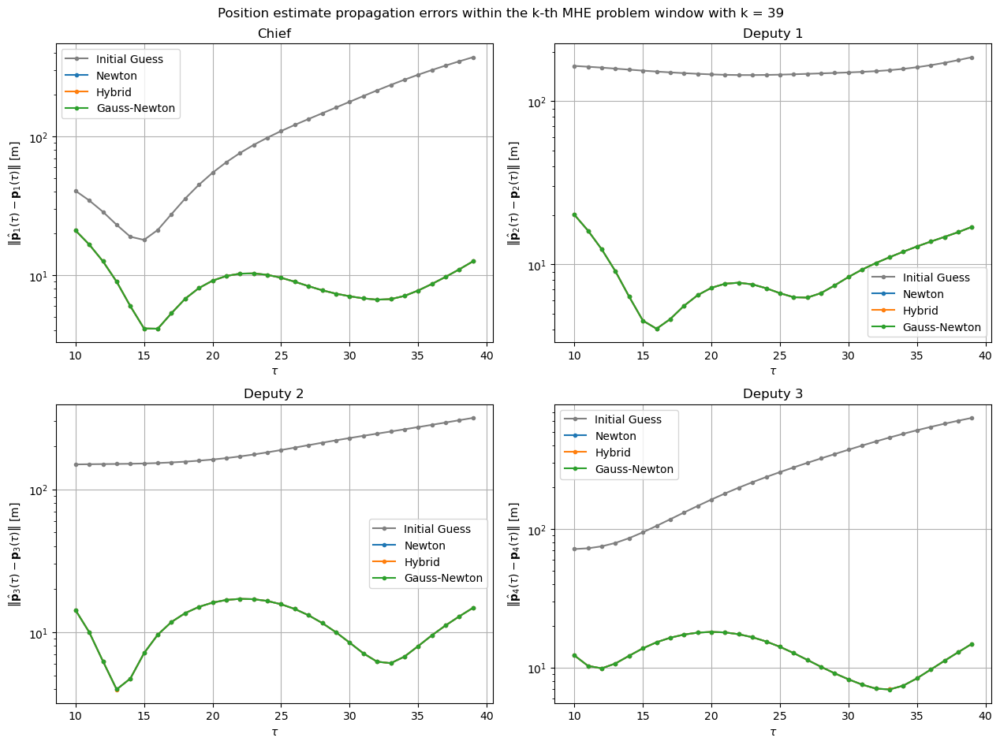

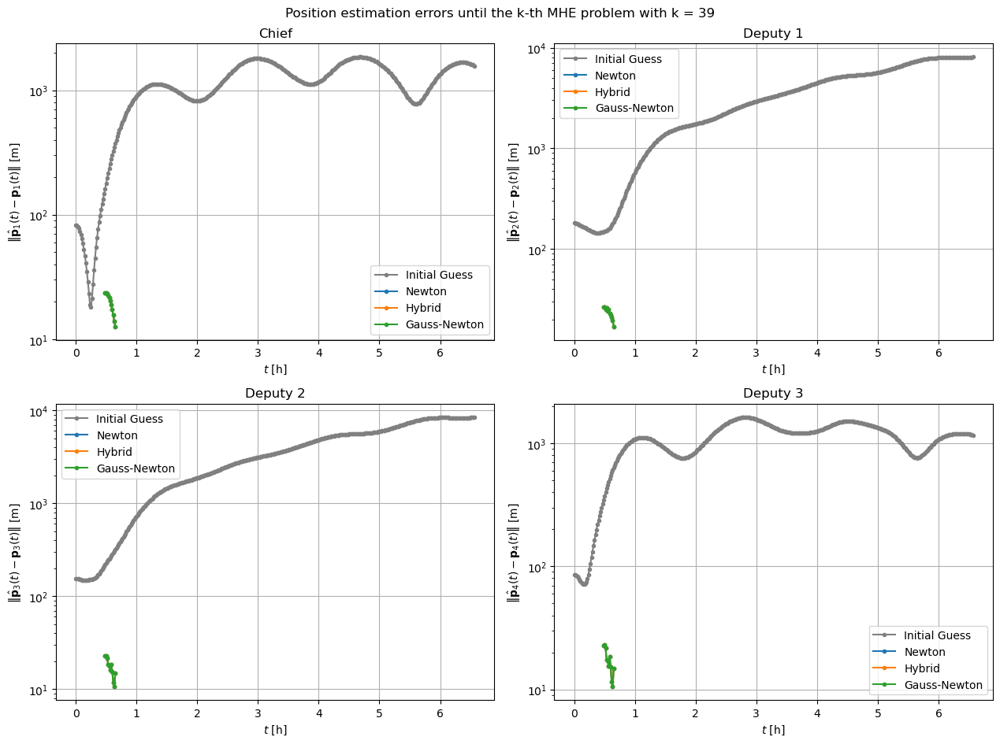

MHE problem:   3%|▎         | 11/366 [14:07<6:30:01, 65.92s/it]

[Hybrid] Before applying the algorithm
Cost function: 128086.33700065671
Gradient norm: 3775870.6154653365
Global estimation error: 27.255538914021287
Initial conditions estimation errors: 16.704860528707073 m, 16.07524762666876 m, 10.000576489827504 m, 10.264712144049327 m
Position estimation errors: 14.52366733542062 m, 18.463079722948716 m, 16.92868606502641 m, 17.021134326252014 m

[Gauss-Newton] Before applying the algorithm
Cost function: 128086.336998208
Gradient norm: 3775870.621676805
Global estimation error: 27.25553886413182
Spectral radius inv(T) @ R: 0.9999127422527695
T minimum eigenvalue: 0.03752818982307595
Initial conditions estimation errors: 16.704860528738795 m, 16.075247632007034 m, 10.000576418697795 m, 10.264712072465953 m
Position estimation errors: 14.523667335942593 m, 18.463079745259833 m, 16.928686038164248 m, 17.021134296003403 m

[Hybrid] Iteration 1
Cost function: 122938.19924738917 (-4.02%)
Gradient norm: 634.7541968651193 (-99.98%)
Global estimation err

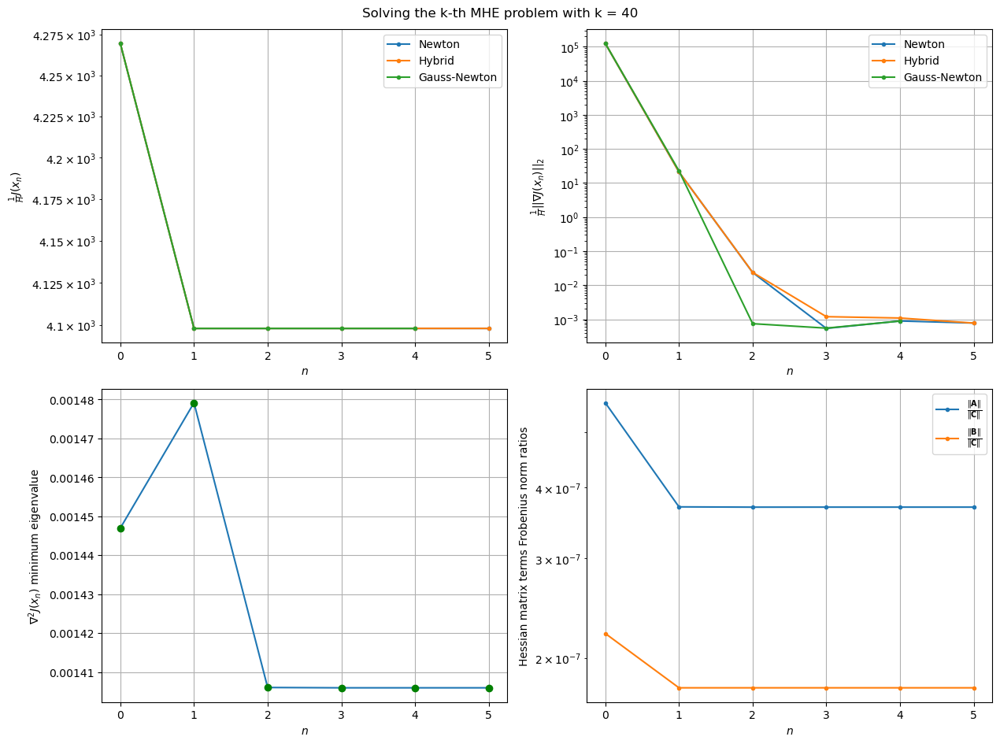

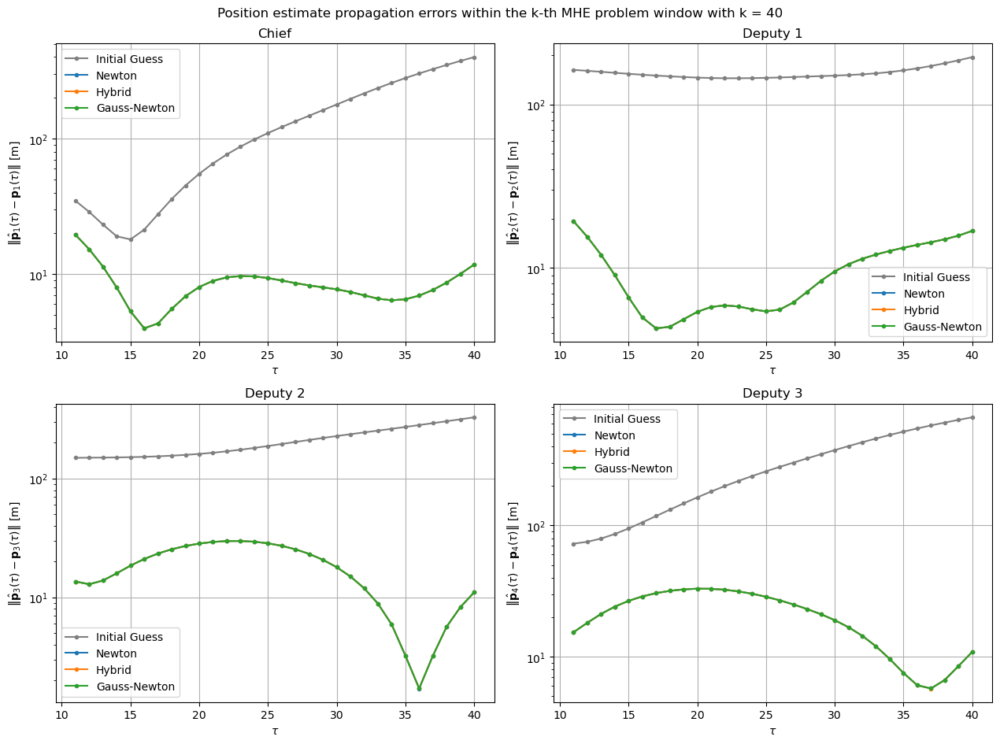

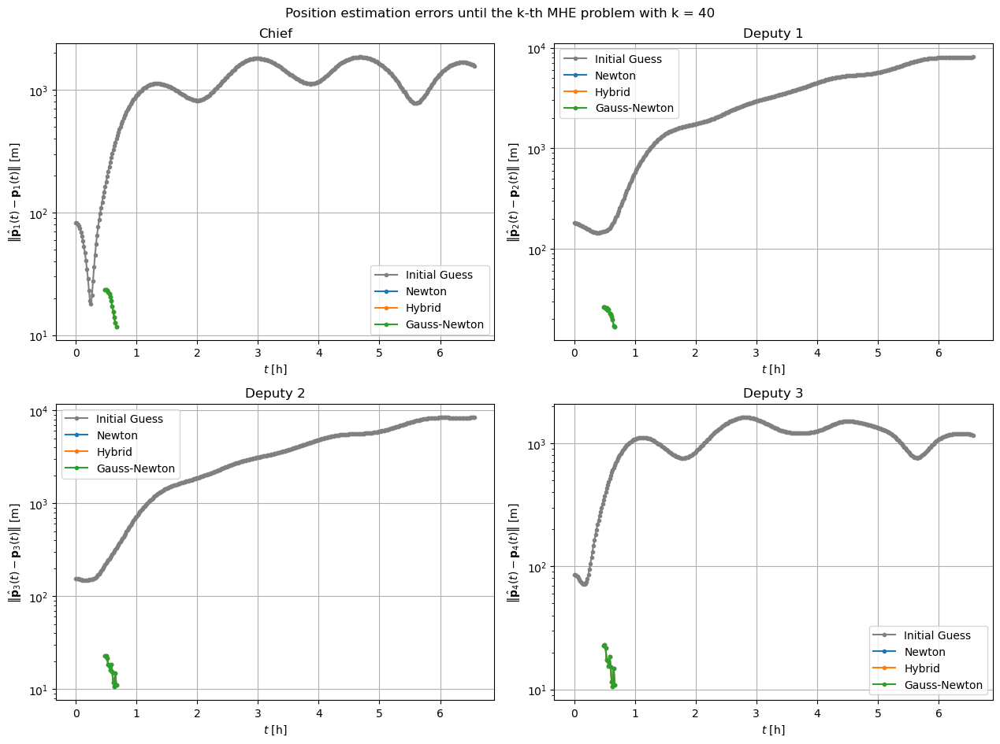

MHE problem:   3%|▎         | 12/366 [15:03<6:11:42, 63.00s/it]

[Hybrid] Before applying the algorithm
Cost function: 113278.44887300556
Gradient norm: 3983209.6708222525
Global estimation error: 31.11799993048788
Initial conditions estimation errors: 15.239384546293211 m, 15.495022770573101 m, 12.919206069334717 m, 18.140184276651812 m
Position estimation errors: 13.81325877657198 m, 18.31023387350692 m, 13.935508200117521 m, 13.672467613866749 m

[Gauss-Newton] Before applying the algorithm
Cost function: 113278.44888018795
Gradient norm: 3983209.6735212705
Global estimation error: 31.11799991467436
Spectral radius inv(T) @ R: 0.9999292367748187
T minimum eigenvalue: 0.031191462188852107
Initial conditions estimation errors: 15.239384546080577 m, 15.49502277161412 m, 12.919206056858872 m, 18.140184257699488 m
Position estimation errors: 13.813258776750915 m, 18.310233865707037 m, 13.935508190909196 m, 13.672467608549162 m

[Hybrid] Iteration 1
Cost function: 108919.34522554633 (-3.85%)
Gradient norm: 250.62660027939614 (-99.99%)
Global estimation

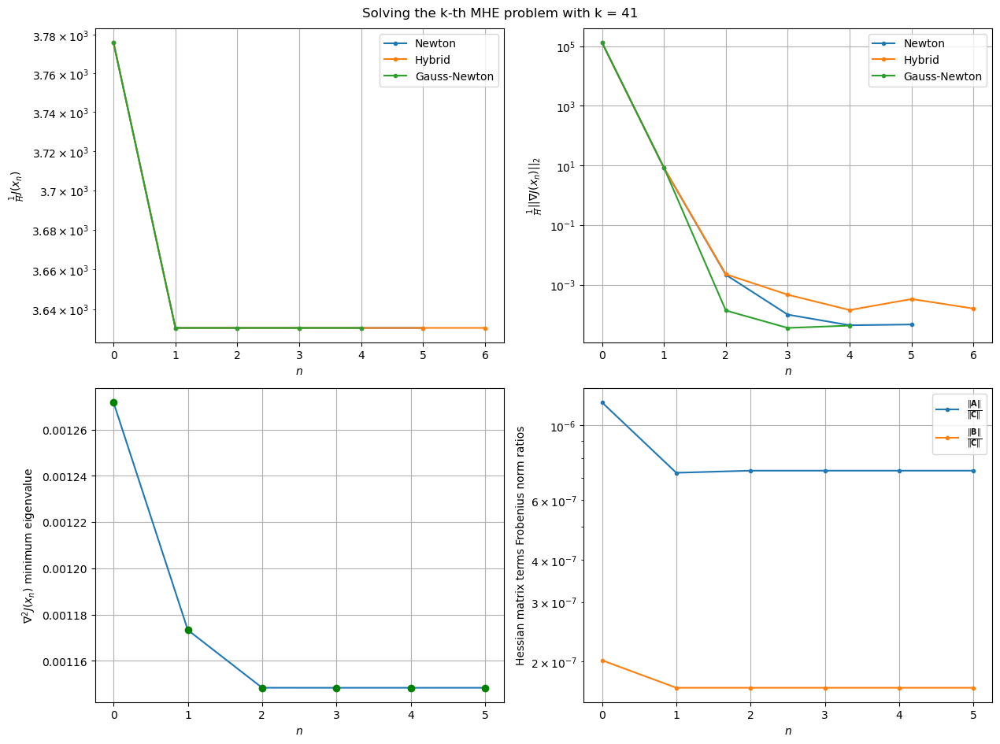

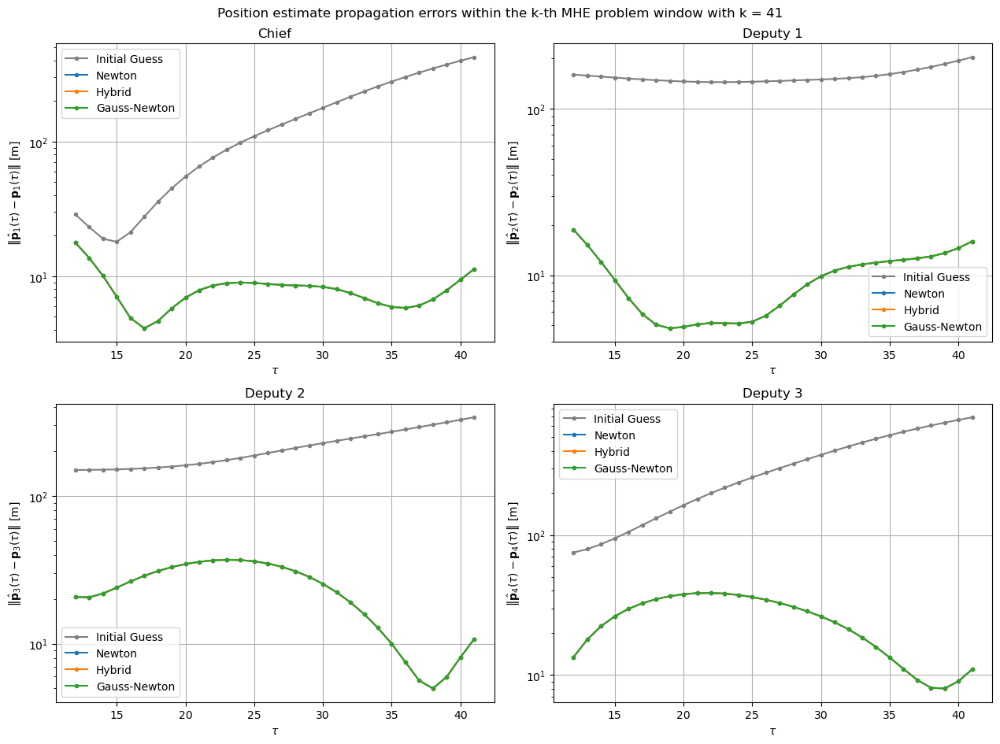

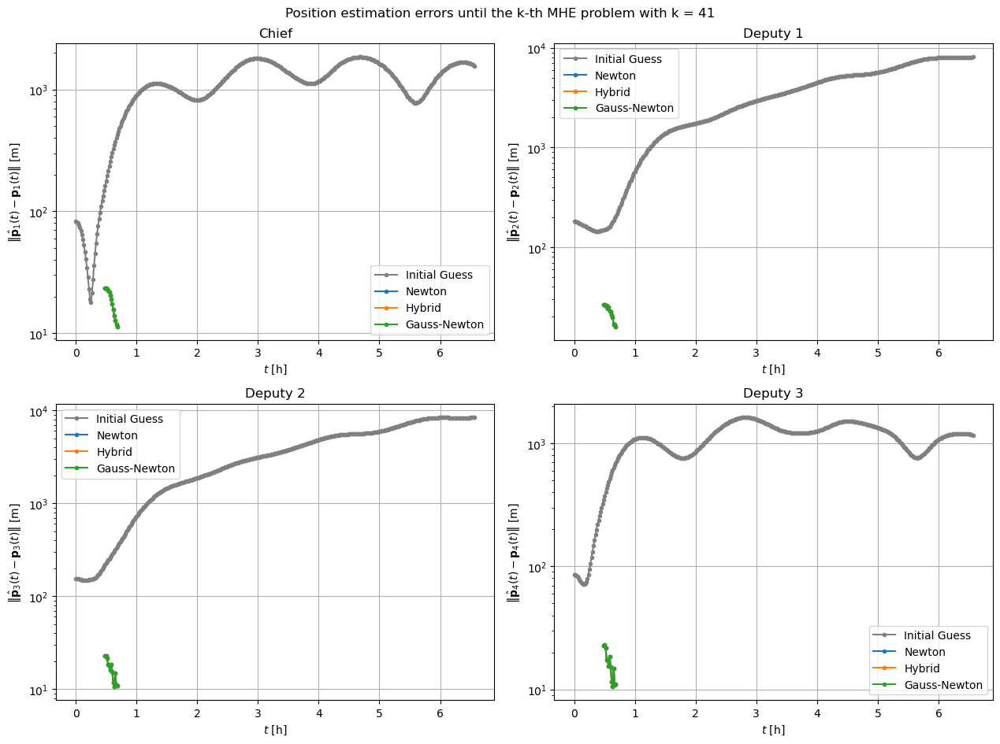

MHE problem:   4%|▎         | 13/366 [16:00<5:58:56, 61.01s/it]

[Hybrid] Before applying the algorithm
Cost function: 102157.80142579028
Gradient norm: 4161299.381384948
Global estimation error: 34.138901999363405
Initial conditions estimation errors: 13.686371635147877 m, 15.189064609584404 m, 20.639063525746536 m, 17.928921469595146 m
Position estimation errors: 13.511277998784387 m, 17.797758477551415 m, 13.837629935357459 m, 13.665622199562042 m

[Gauss-Newton] Before applying the algorithm
Cost function: 102157.80142753579
Gradient norm: 4161299.3776081335
Global estimation error: 34.13890201972263
Spectral radius inv(T) @ R: 0.9999397177167878
T minimum eigenvalue: 0.027478541591742345
Initial conditions estimation errors: 13.686371634358087 m, 15.189064609238919 m, 20.639063534842958 m, 17.92892149878563 m
Position estimation errors: 13.51127799725597 m, 17.797758477483253 m, 13.83762994715128 m, 13.66562220307232 m

[Hybrid] Iteration 1
Cost function: 98532.31164958159 (-3.55%)
Gradient norm: 47.74264493079295 (-100.00%)
Global estimation e

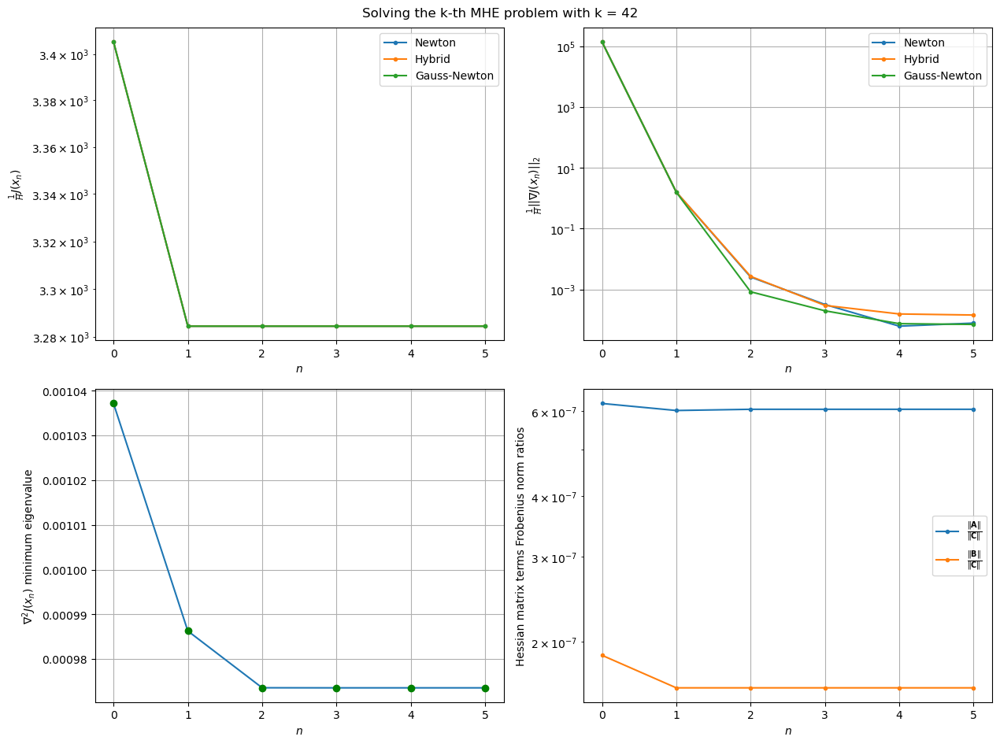

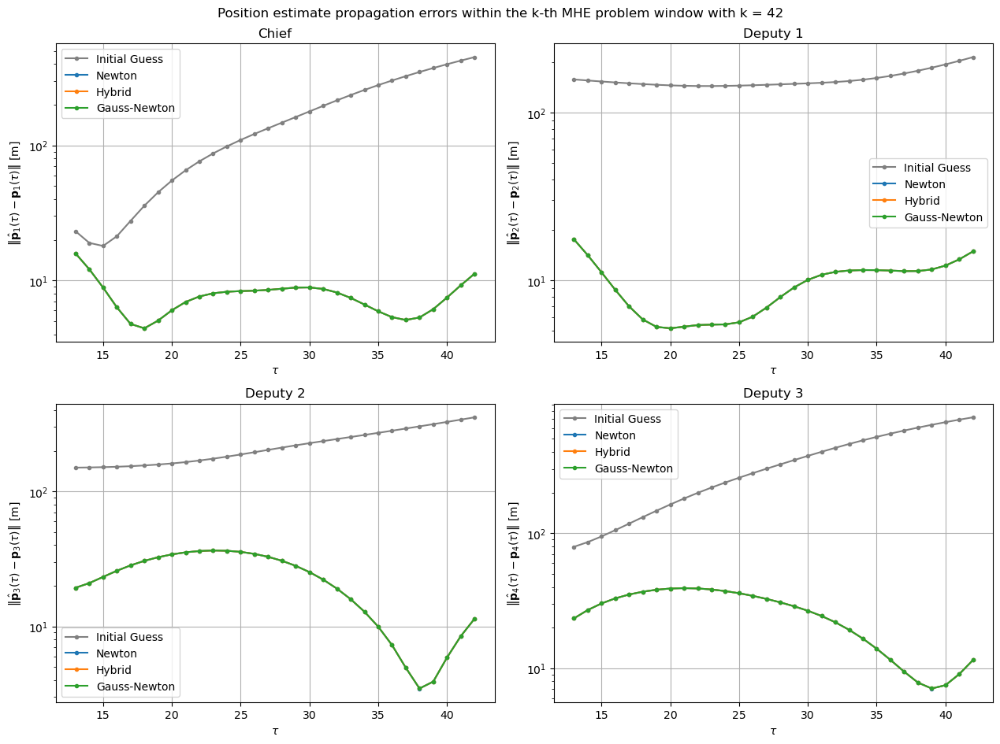

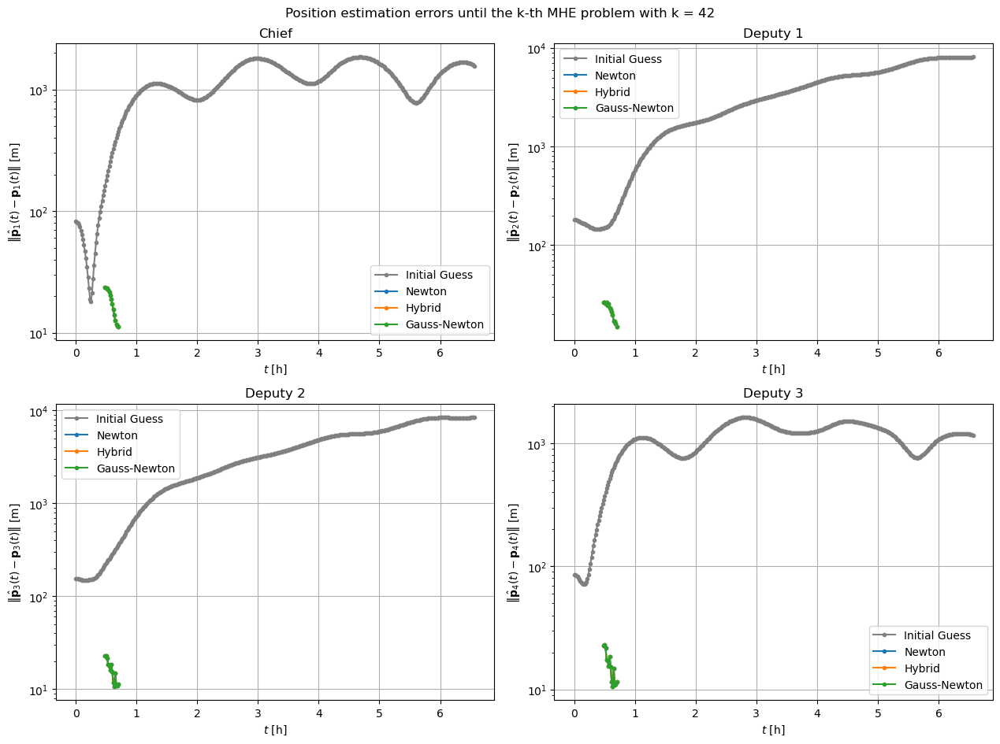

MHE problem:   4%|▍         | 14/366 [16:56<5:50:25, 59.73s/it]

[Hybrid] Before applying the algorithm
Cost function: 95050.96944852053
Gradient norm: 4271321.856096512
Global estimation error: 38.88918128764735
Initial conditions estimation errors: 12.121453245183151 m, 14.117358837336827 m, 20.91330930186229 m, 26.995431892438077 m
Position estimation errors: 13.505262269238894 m, 16.81803459316239 m, 14.629213778575513 m, 14.659624393479426 m

[Gauss-Newton] Before applying the algorithm
Cost function: 95050.96944925084
Gradient norm: 4271321.858424704
Global estimation error: 38.88918037557505
Spectral radius inv(T) @ R: 0.9999466537697255
T minimum eigenvalue: 0.02607456167965259
Initial conditions estimation errors: 12.121453244220001 m, 14.117358783458208 m, 20.913308625983735 m, 26.995431130733728 m
Position estimation errors: 13.505262268939505 m, 16.81803454183225 m, 14.629213827180438 m, 14.659624440120043 m

[Hybrid] Iteration 1
Cost function: 92003.72641576051 (-3.21%)
Gradient norm: 32.830571228443915 (-100.00%)
Global estimation erro

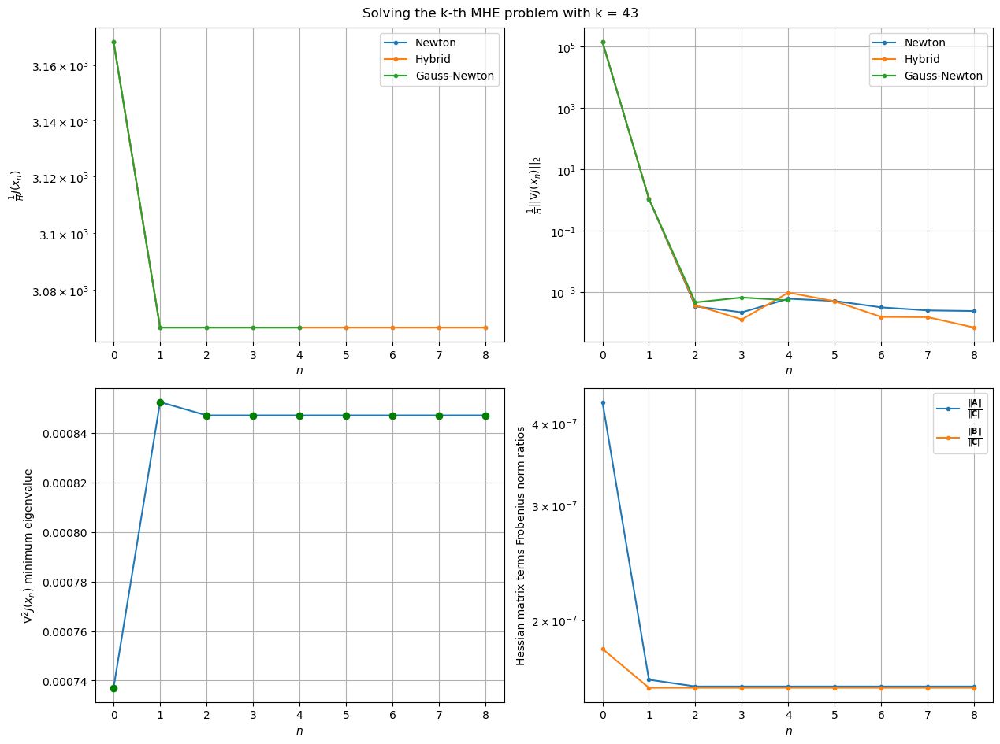

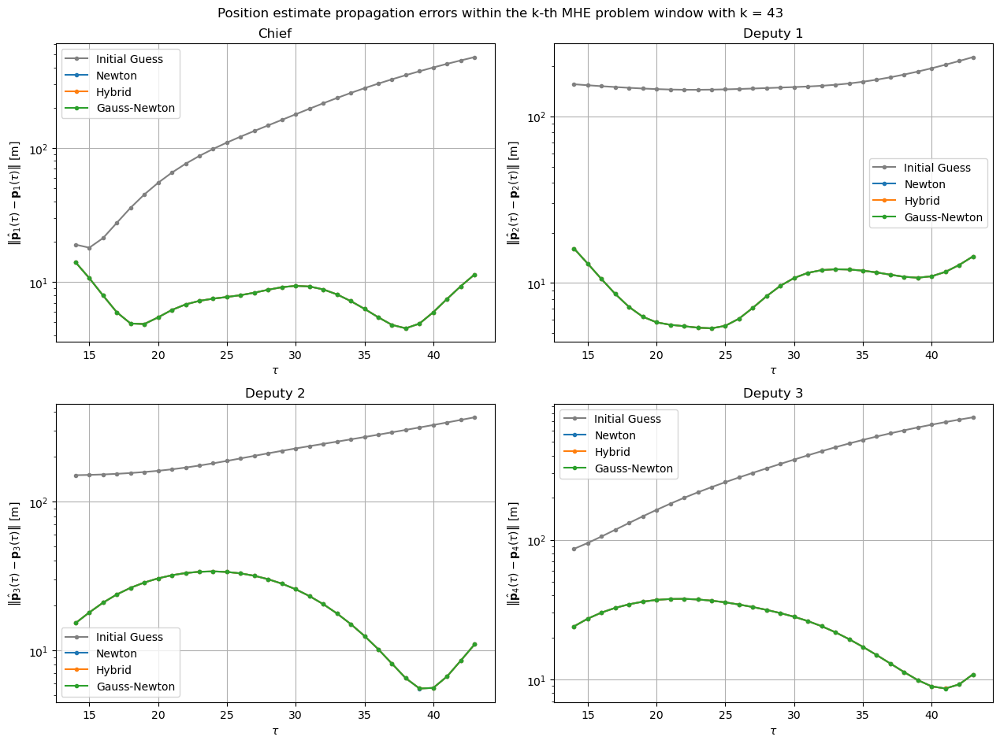

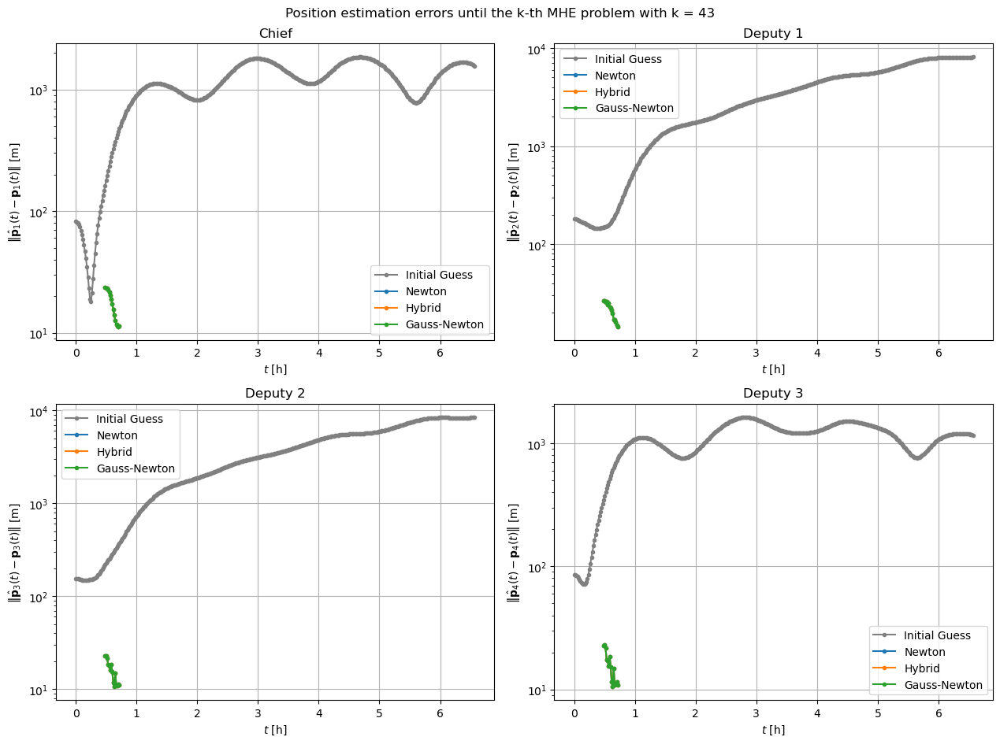

MHE problem:   4%|▍         | 15/366 [18:16<6:24:35, 65.74s/it]

[Hybrid] Before applying the algorithm
Cost function: 91617.8307175552
Gradient norm: 4482967.3331487235
Global estimation error: 36.75349967770349
Initial conditions estimation errors: 10.682822689443336 m, 13.066754032366314 m, 18.006857120877452 m, 27.234053771897045 m
Position estimation errors: 13.675450525616805 m, 16.41493338438205 m, 13.874036504299658 m, 13.490693406646526 m

[Gauss-Newton] Before applying the algorithm
Cost function: 91617.8306984229
Gradient norm: 4482967.318410792
Global estimation error: 36.7534992952996
Spectral radius inv(T) @ R: 0.9999505706662193
T minimum eigenvalue: 0.026329412687095925
Initial conditions estimation errors: 10.682822688412898 m, 13.066754004851738 m, 18.006856830738805 m, 27.234053461269717 m
Position estimation errors: 13.675450518373259 m, 16.414933366348077 m, 13.874036515150754 m, 13.49069342175913 m

[Hybrid] Iteration 1
Cost function: 88886.44031953486 (-2.98%)
Gradient norm: 3562.8074864823975 (-99.92%)
Global estimation error

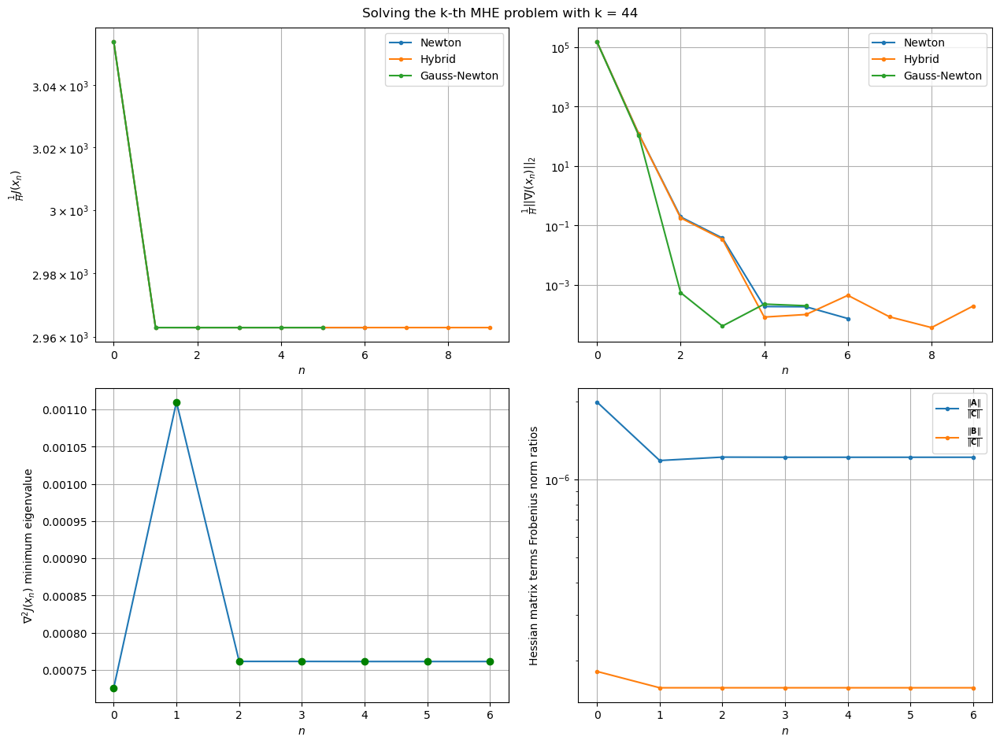

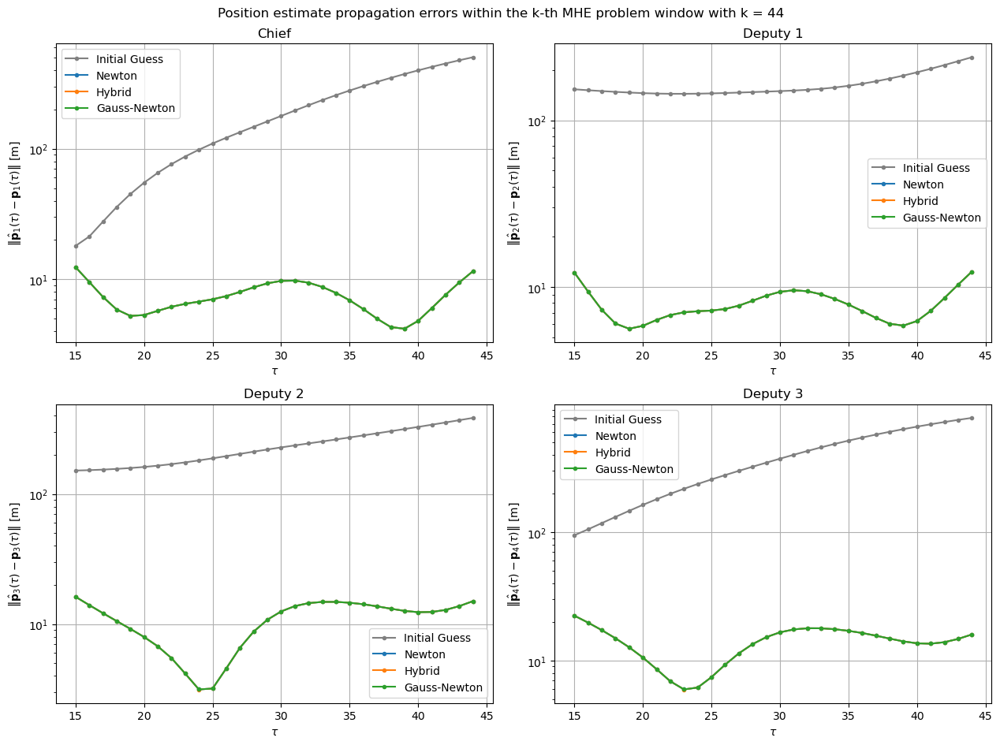

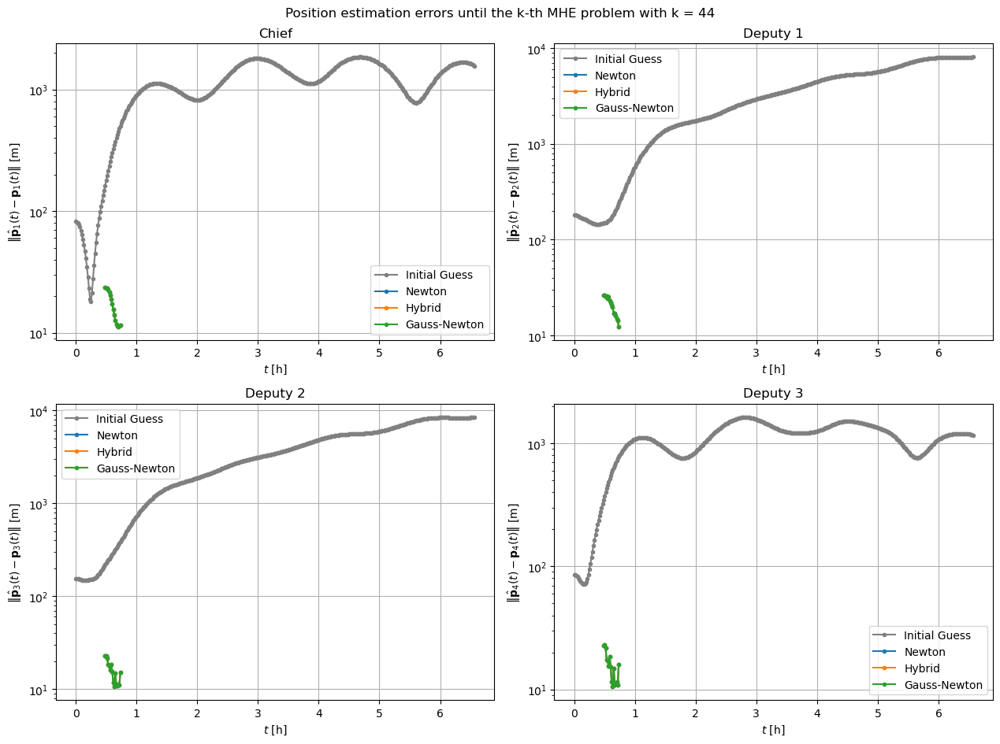

MHE problem:   4%|▍         | 16/366 [19:23<6:25:07, 66.02s/it]

[Hybrid] Before applying the algorithm
Cost function: 90641.77566409454
Gradient norm: 4523124.837900225
Global estimation error: 27.67989567226
Initial conditions estimation errors: 9.547862049047703 m, 9.37964085113551 m, 14.002573041620723 m, 19.77257789267163 m
Position estimation errors: 13.864285974113907 m, 14.616637820122182 m, 16.57632262510389 m, 17.494143613353177 m

[Gauss-Newton] Before applying the algorithm
Cost function: 90641.7756714928
Gradient norm: 4523124.850060262
Global estimation error: 27.679895882215856
Spectral radius inv(T) @ R: 0.9999528428819672
T minimum eigenvalue: 0.028364846190098637
Initial conditions estimation errors: 9.547862047610376 m, 9.379640826426412 m, 14.002573271600824 m, 19.772578036139976 m
Position estimation errors: 13.864285977146595 m, 14.61663780952107 m, 16.57632265109427 m, 17.494143644391272 m

[Hybrid] Iteration 1
Cost function: 88166.47210048012 (-2.73%)
Gradient norm: 323.9729012065558 (-99.99%)
Global estimation error: 40.8269

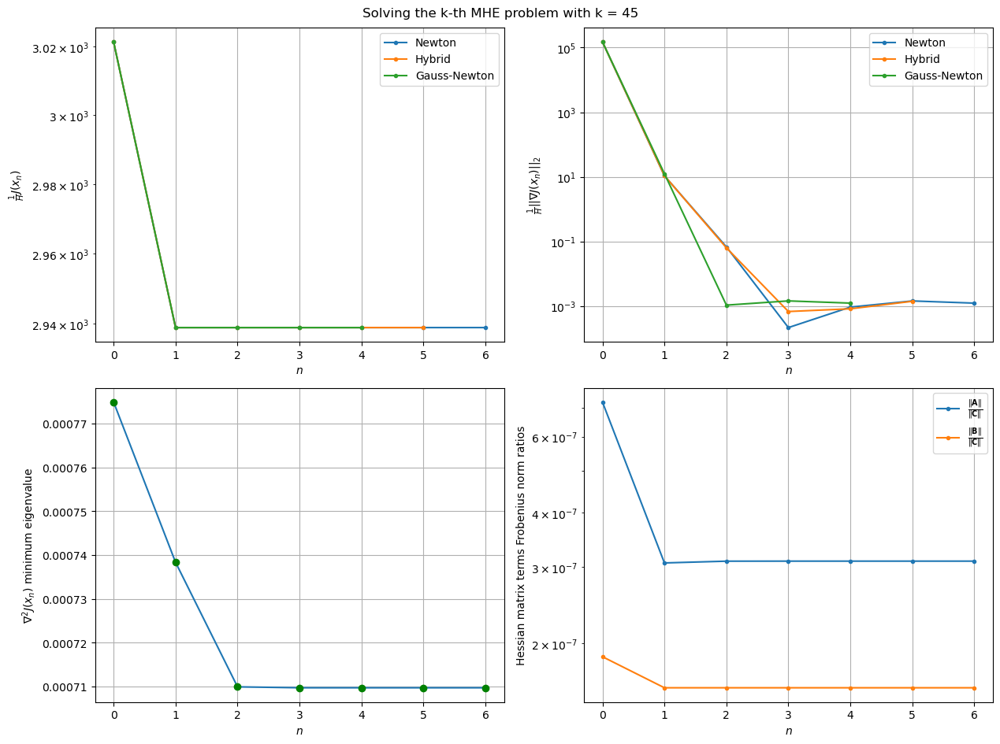

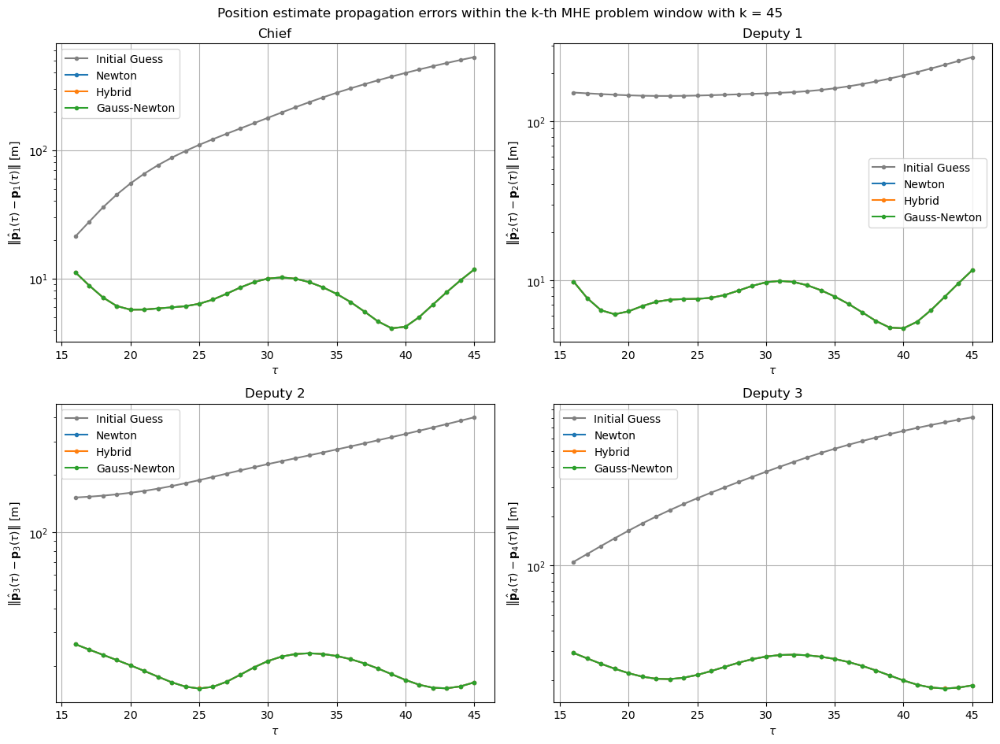

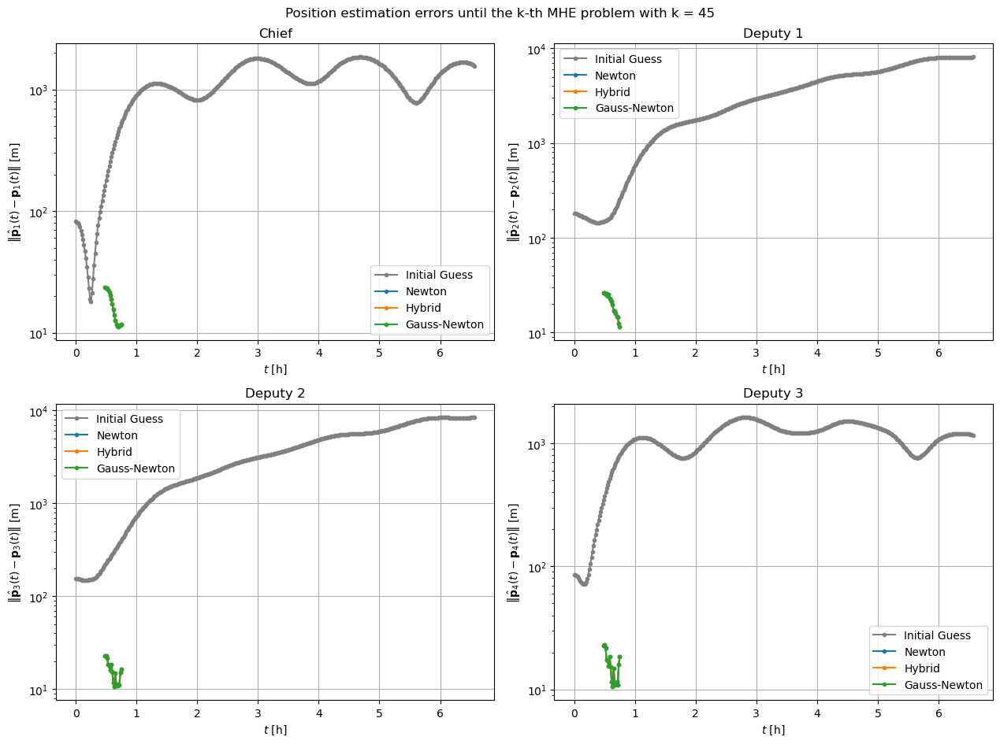

MHE problem:   5%|▍         | 17/366 [20:27<6:20:53, 65.48s/it]

[Hybrid] Before applying the algorithm
Cost function: 91979.11482205633
Gradient norm: 4752435.834430617
Global estimation error: 38.25579378382278
Initial conditions estimation errors: 8.79880082795409 m, 7.71731347441574 m, 24.366290245613875 m, 27.070398209774936 m
Position estimation errors: 14.060128588574866 m, 13.795996358721318 m, 17.534604641257516 m, 19.37343377188578 m

[Gauss-Newton] Before applying the algorithm
Cost function: 91979.11479828708
Gradient norm: 4752435.752779755
Global estimation error: 38.25579283802864
Spectral radius inv(T) @ R: 0.9999527992344865
T minimum eigenvalue: 0.03209935398811186
Initial conditions estimation errors: 8.798800825886373 m, 7.717313534717026 m, 24.36628951706784 m, 27.07039751243248 m
Position estimation errors: 14.060128561208192 m, 13.795996386245758 m, 17.53460456979411 m, 19.37343363902507 m

[Hybrid] Iteration 1
Cost function: 89549.16959246452 (-2.64%)
Gradient norm: 861.0048894278331 (-99.98%)
Global estimation error: 22.9107

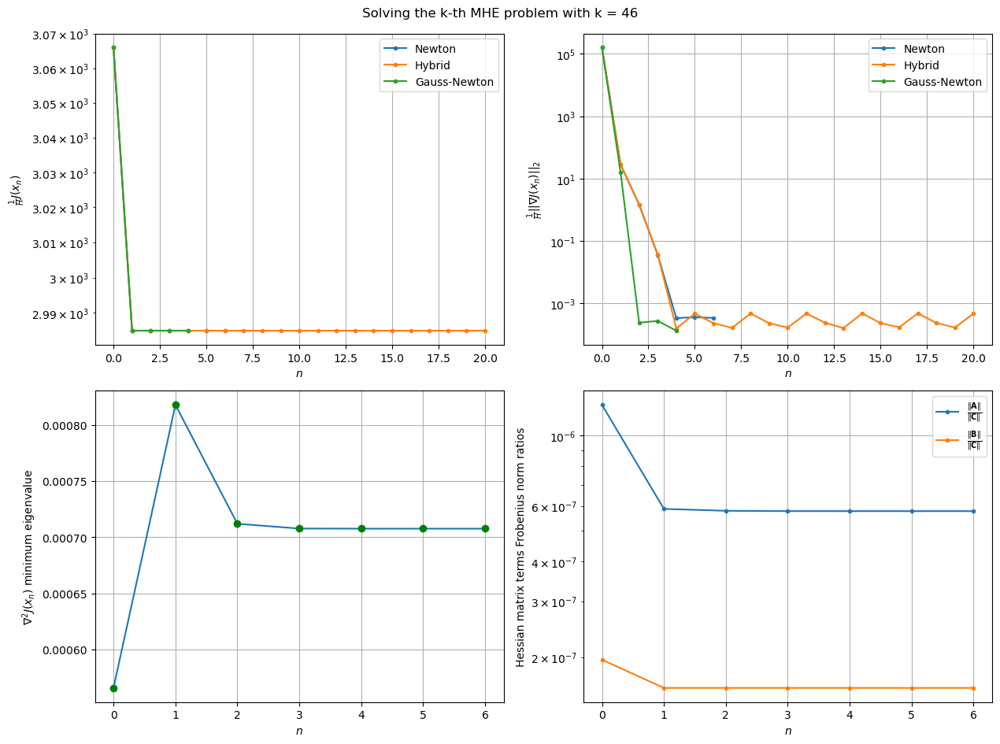

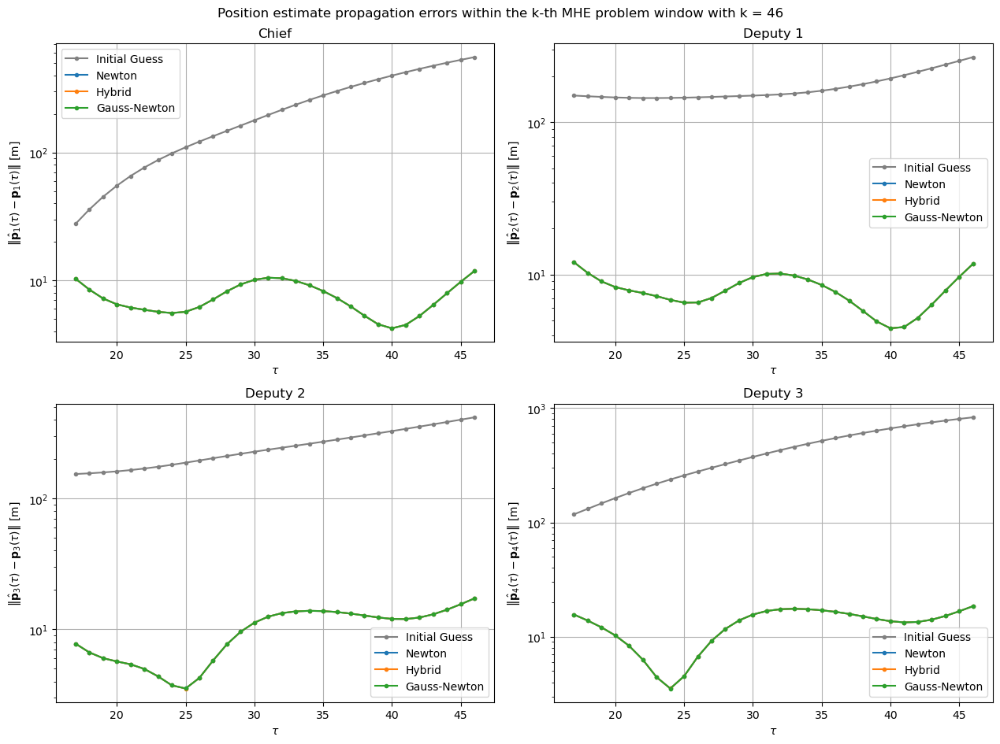

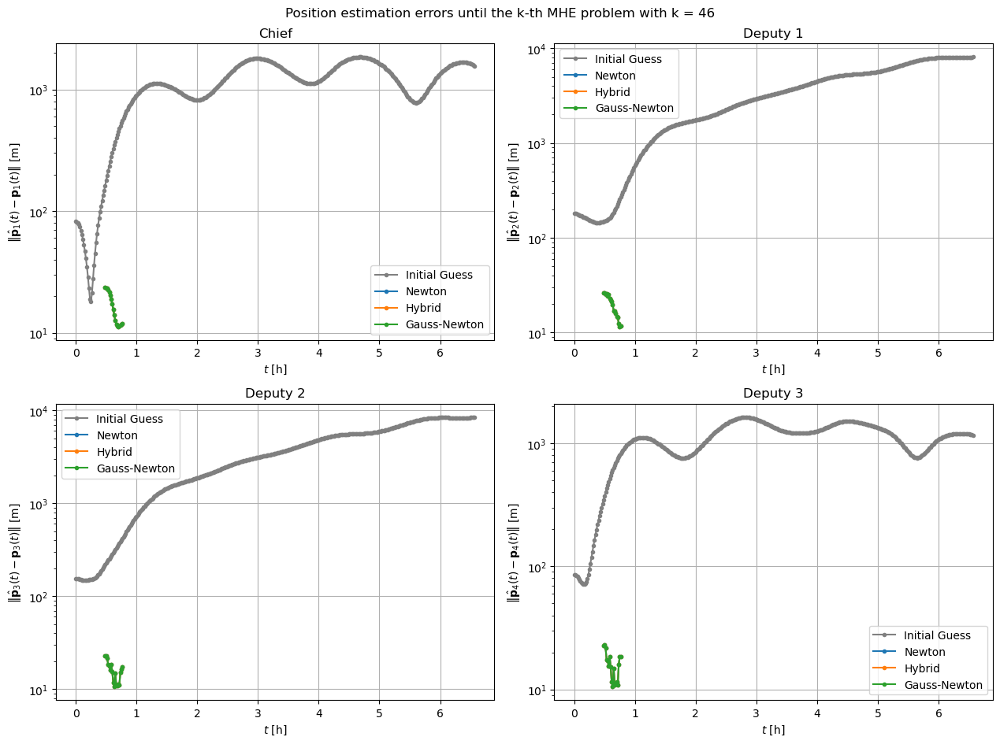

MHE problem:   5%|▍         | 18/366 [21:40<6:33:00, 67.76s/it]

[Hybrid] Before applying the algorithm
Cost function: 94189.67081781826
Gradient norm: 4782420.461588485
Global estimation error: 20.308064757951986
Initial conditions estimation errors: 8.471268217010323 m, 10.230526094296568 m, 6.671784994124203 m, 13.837354755634186 m
Position estimation errors: 14.19375767729755 m, 14.045866448080421 m, 19.160753193975967 m, 20.550380891943284 m

[Gauss-Newton] Before applying the algorithm
Cost function: 94189.67081129136
Gradient norm: 4782420.44342938
Global estimation error: 20.308064372246648
Spectral radius inv(T) @ R: 0.9999507660642734
T minimum eigenvalue: 0.03731237604667714
Initial conditions estimation errors: 8.471268216079265 m, 10.23052619674494 m, 6.671783965496505 m, 13.837354610346045 m
Position estimation errors: 14.193757670585144 m, 14.045866490275609 m, 19.160753082121097 m, 20.55038067109606 m

[Hybrid] Iteration 1
Cost function: 91766.1537030909 (-2.57%)
Gradient norm: 1742.4982456945006 (-99.96%)
Global estimation error: 49

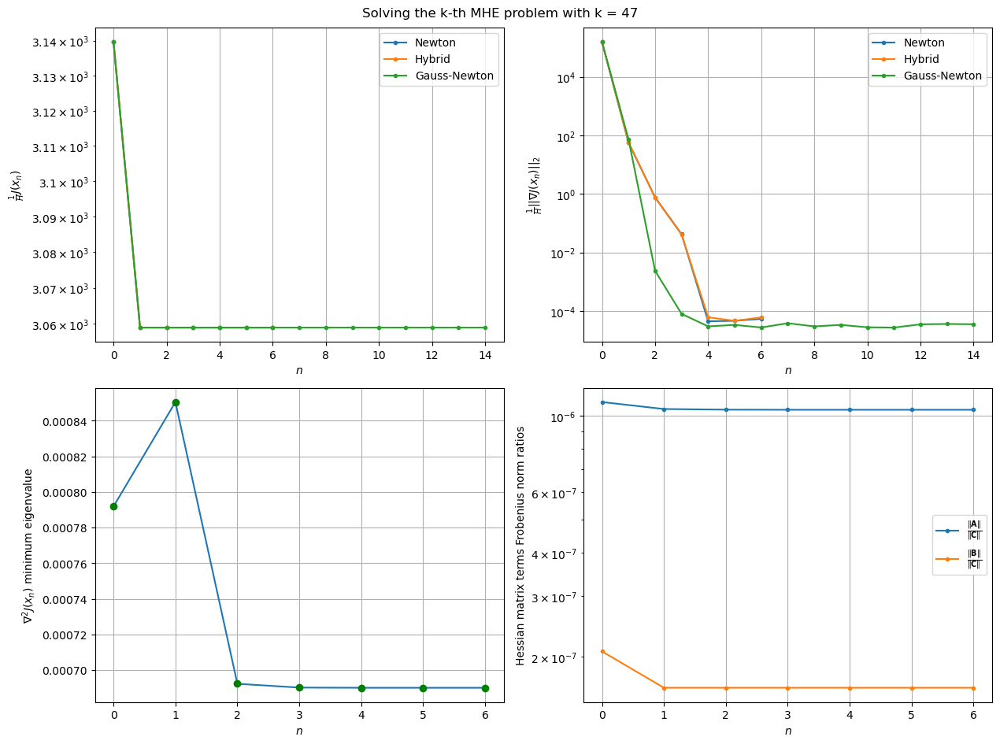

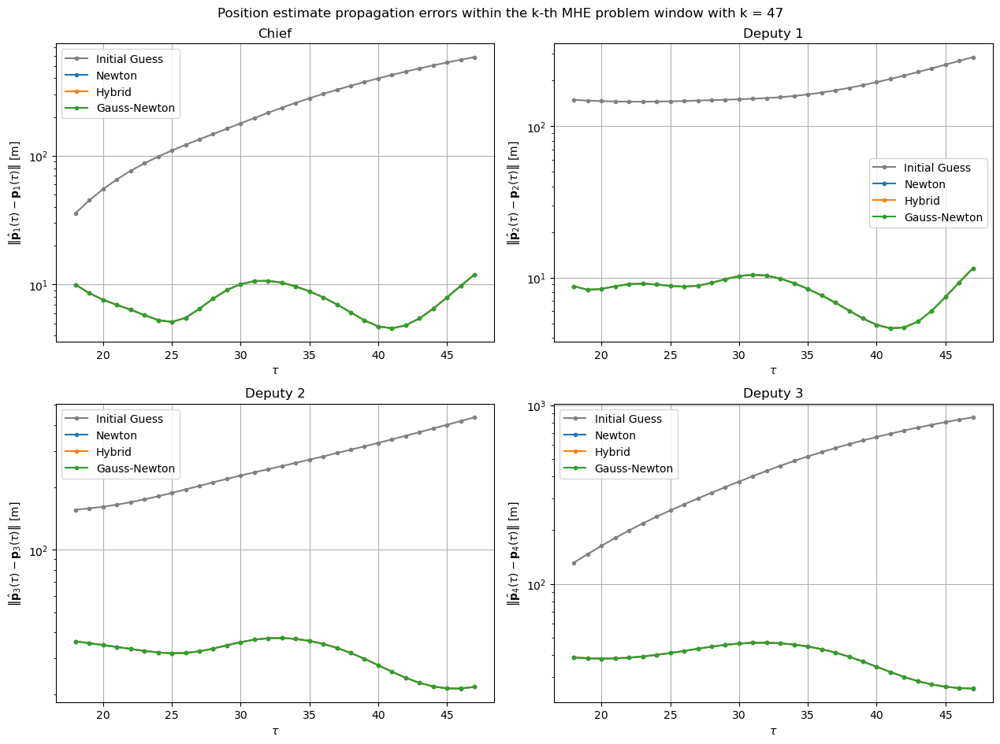

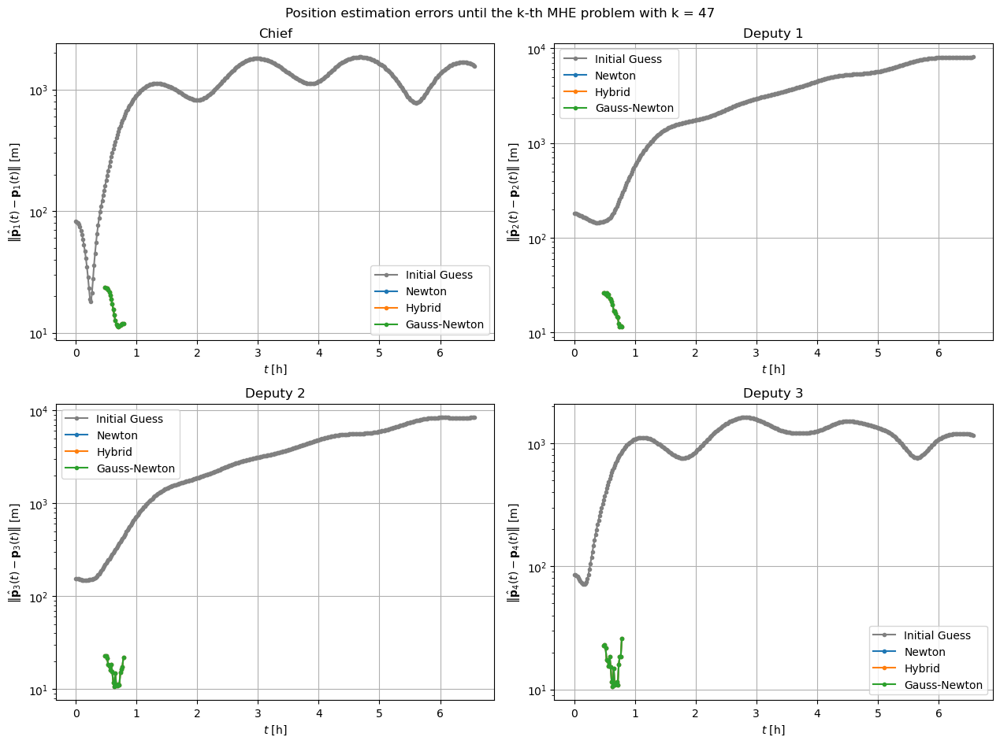

MHE problem:   5%|▌         | 19/366 [22:52<6:39:13, 69.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 96959.76972230576
Gradient norm: 4895047.097922711
Global estimation error: 53.531335874523776
Initial conditions estimation errors: 8.562879676867166 m, 8.304262326434934 m, 35.42369416288178 m, 38.32073461166148 m
Position estimation errors: 14.327198421620906 m, 14.04569807463623 m, 22.569275113281783 m, 26.01797114300836 m

[Gauss-Newton] Before applying the algorithm
Cost function: 96959.76972547123
Gradient norm: 4895047.096742544
Global estimation error: 53.53133590021436
Spectral radius inv(T) @ R: 0.9999477750581042
T minimum eigenvalue: 0.043965547809166186
Initial conditions estimation errors: 8.562879676545096 m, 8.304262325314397 m, 35.42369418006792 m, 38.32073463197732 m
Position estimation errors: 14.32719842045054 m, 14.045698061096545 m, 22.56927511503206 m, 26.017971139742233 m

[Hybrid] Iteration 1
Cost function: 94470.72597986954 (-2.57%)
Gradient norm: 765.3383998383703 (-99.98%)
Global estimation error: 81.780

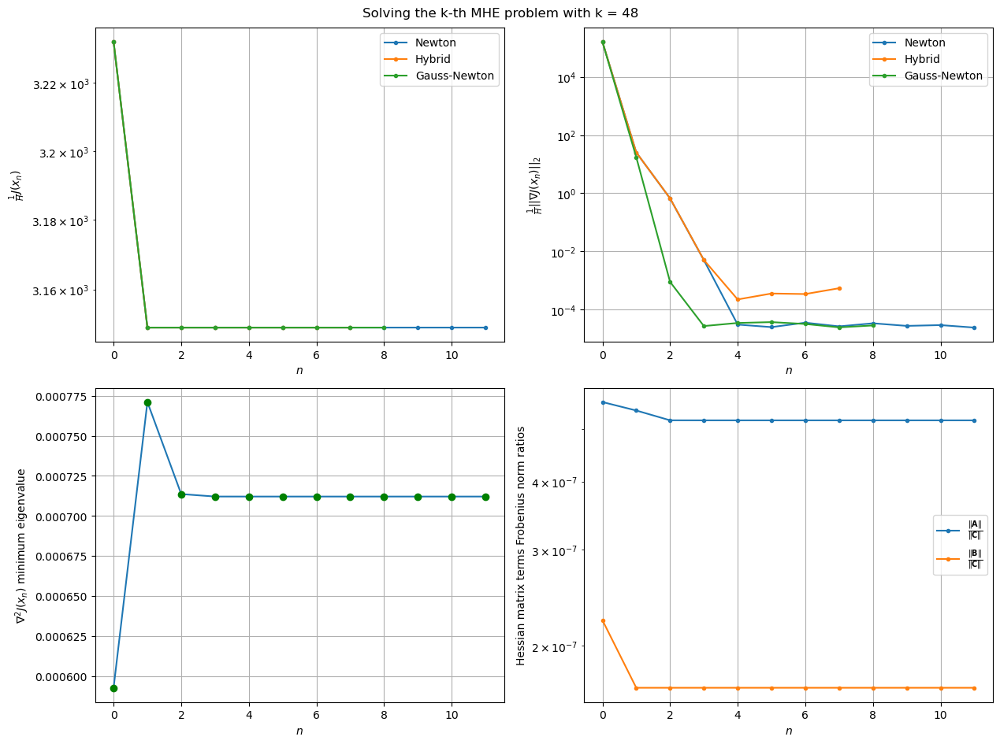

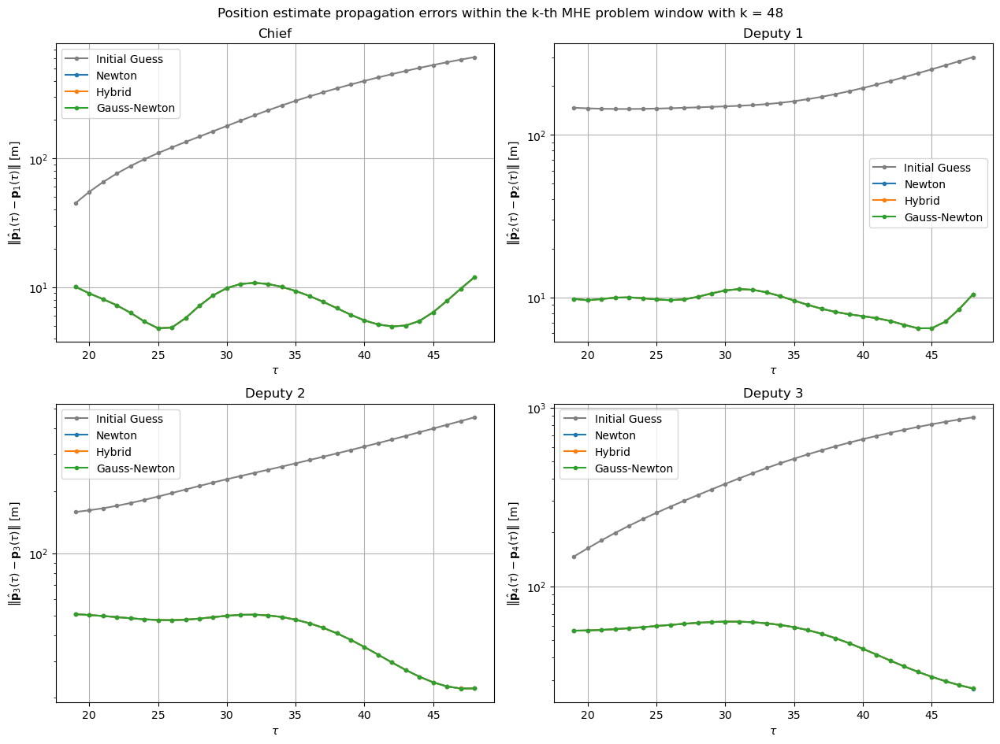

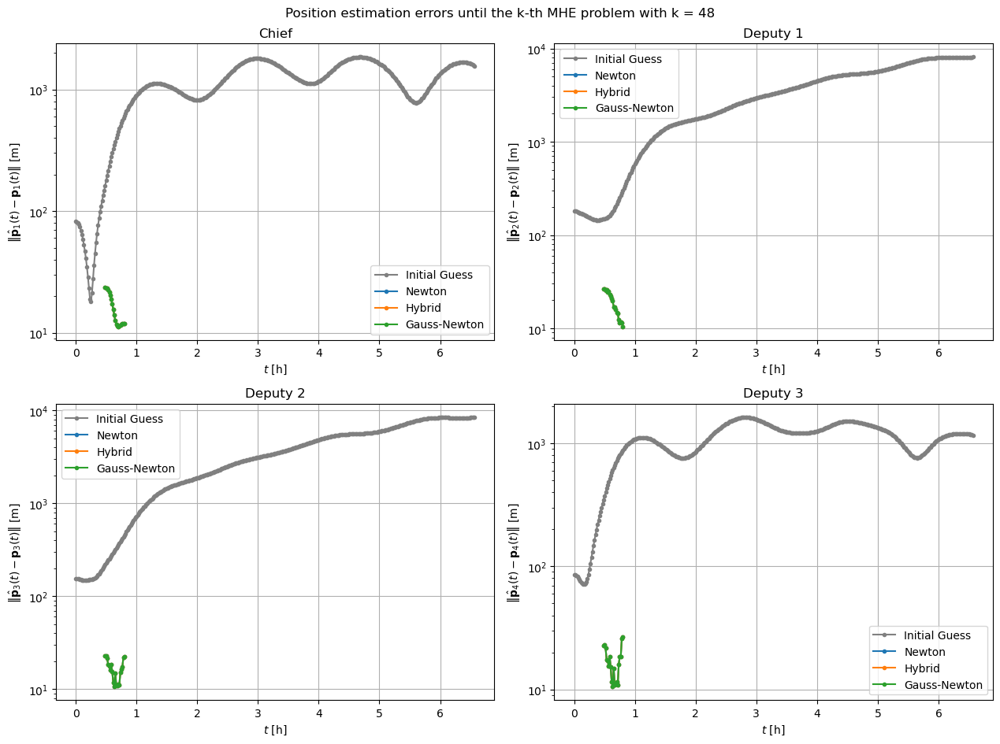

MHE problem:   5%|▌         | 20/366 [24:36<7:38:07, 79.44s/it]

[Hybrid] Before applying the algorithm
Cost function: 100217.37164299533
Gradient norm: 4997614.649115505
Global estimation error: 76.94476592021047
Initial conditions estimation errors: 8.960279903139696 m, 9.605294975511418 m, 50.300988780091394 m, 56.725267610958724 m
Position estimation errors: 14.427229401925553 m, 12.804360184651076 m, 22.804516804695968 m, 25.878103514460506 m

[Gauss-Newton] Before applying the algorithm
Cost function: 100217.37165475081
Gradient norm: 4997614.667445908
Global estimation error: 76.94476585933043
Spectral radius inv(T) @ R: 0.999943012830465
T minimum eigenvalue: 0.05187479788940382
Initial conditions estimation errors: 8.96027990300478 m, 9.605294974331237 m, 50.30098874072998 m, 56.72526756350301 m
Position estimation errors: 14.42722940748957 m, 12.804360188035297 m, 22.804516800744217 m, 25.878103508464086 m

[Hybrid] Iteration 1
Cost function: 97593.84675391938 (-2.62%)
Gradient norm: 188.96586395231753 (-100.00%)
Global estimation error: 5

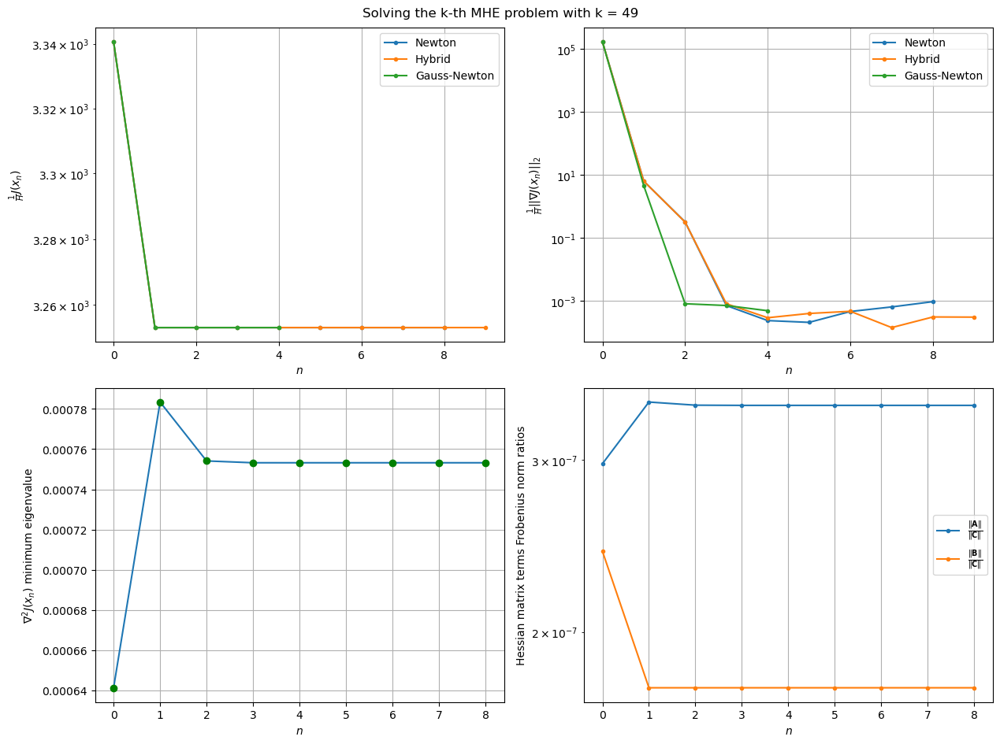

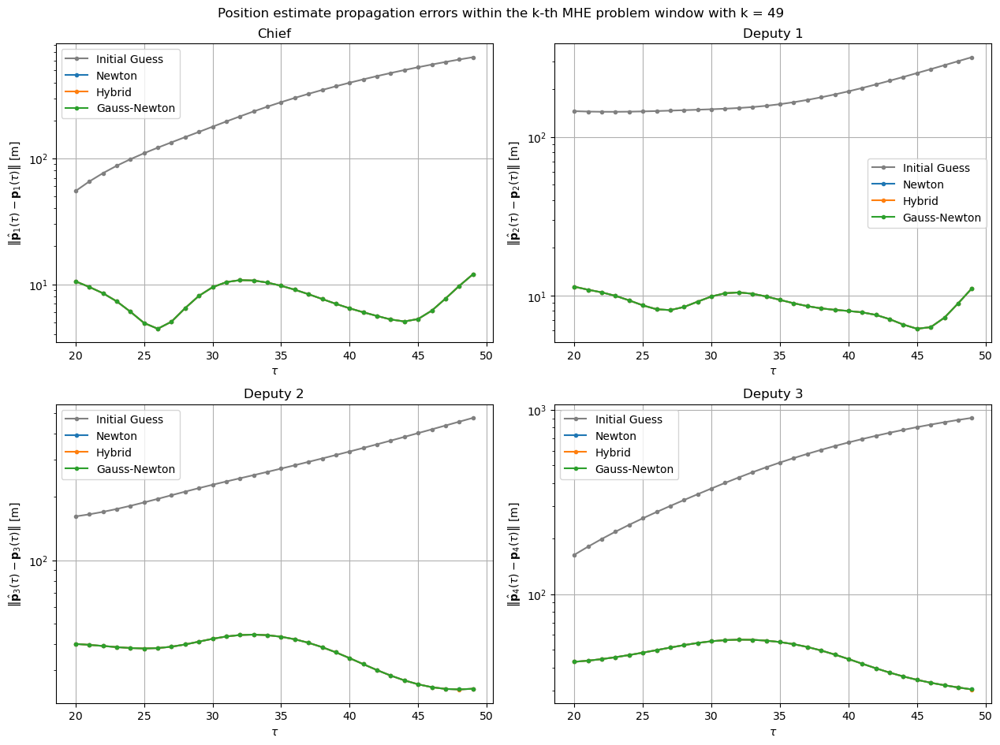

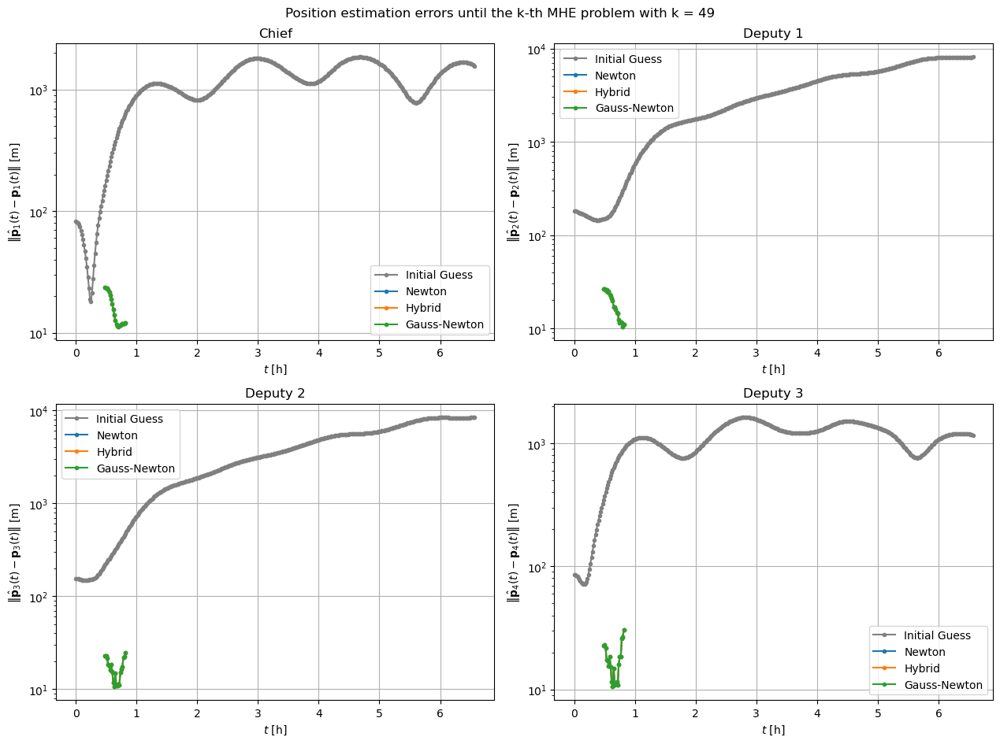

MHE problem:   6%|▌         | 21/366 [25:55<7:37:05, 79.49s/it]

[Hybrid] Before applying the algorithm
Cost function: 102441.41219461488
Gradient norm: 4800602.448283018
Global estimation error: 60.64127407289136
Initial conditions estimation errors: 9.517009878674793 m, 10.884084875146987 m, 39.67534386253401 m, 43.52230305869533 m
Position estimation errors: 14.478106326390991 m, 13.56399224173887 m, 25.050785554084673 m, 29.691059537303307 m

[Gauss-Newton] Before applying the algorithm
Cost function: 102441.41221390088
Gradient norm: 4800602.47348151
Global estimation error: 60.64127419737165
Spectral radius inv(T) @ R: 0.9999366558619797
T minimum eigenvalue: 0.06081848338837855
Initial conditions estimation errors: 9.517009879086267 m, 10.884084876866147 m, 39.6753439438944 m, 43.52230315744958 m
Position estimation errors: 14.478106334371795 m, 13.56399223581185 m, 25.05078559013442 m, 29.69105958081019 m

[Hybrid] Iteration 1
Cost function: 99779.13280020065 (-2.60%)
Gradient norm: 995.0317716727291 (-99.98%)
Global estimation error: 49.036

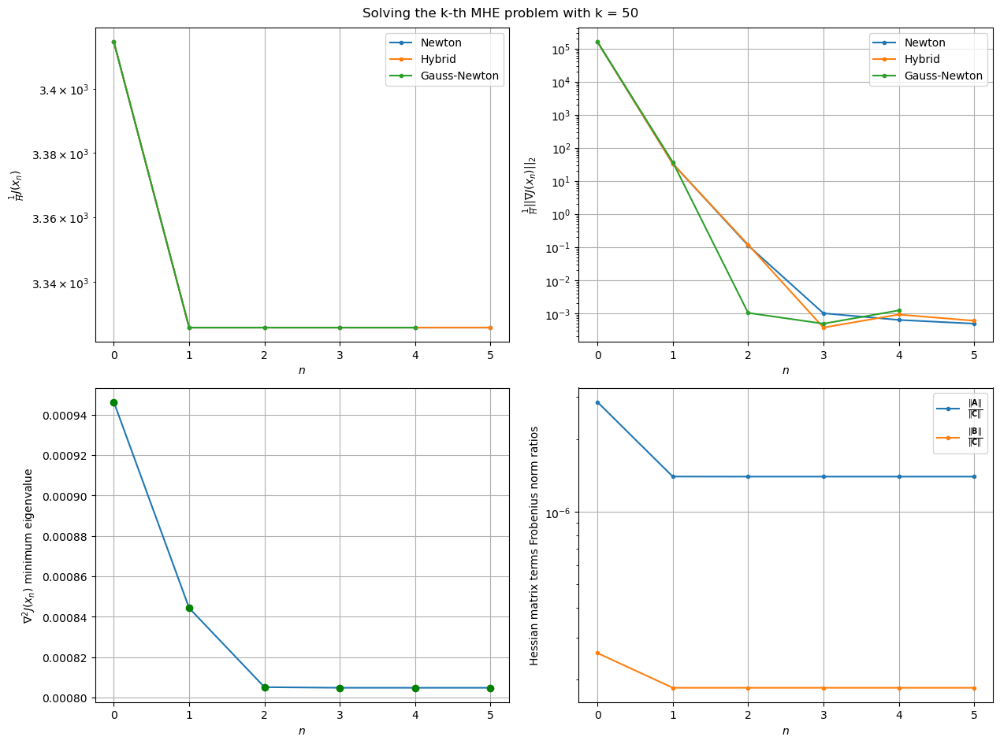

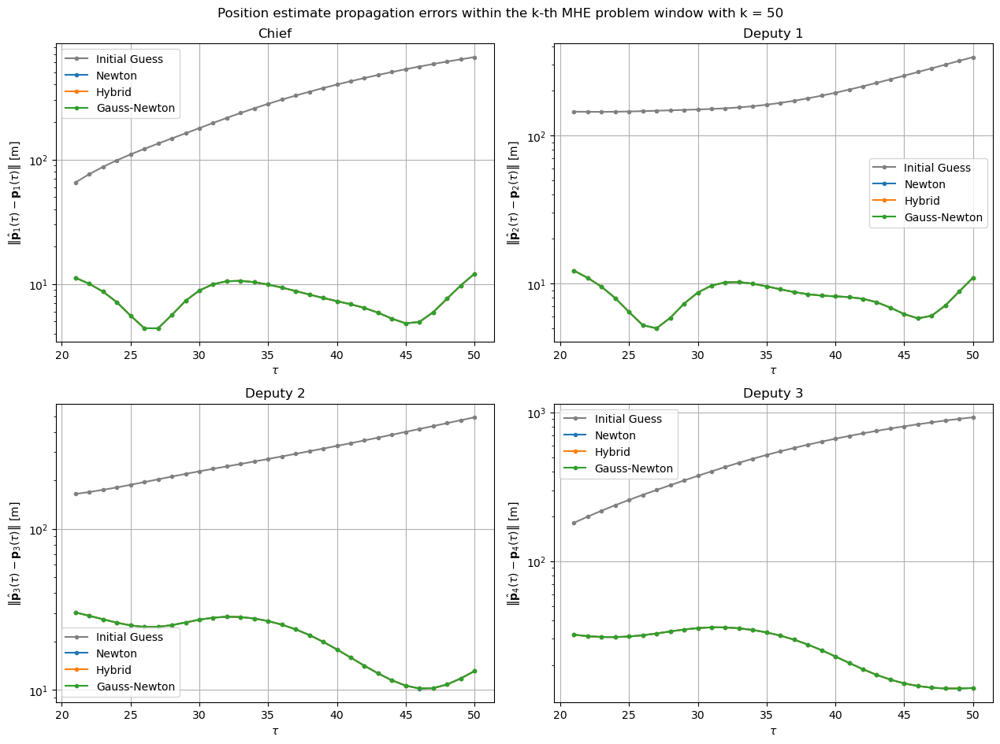

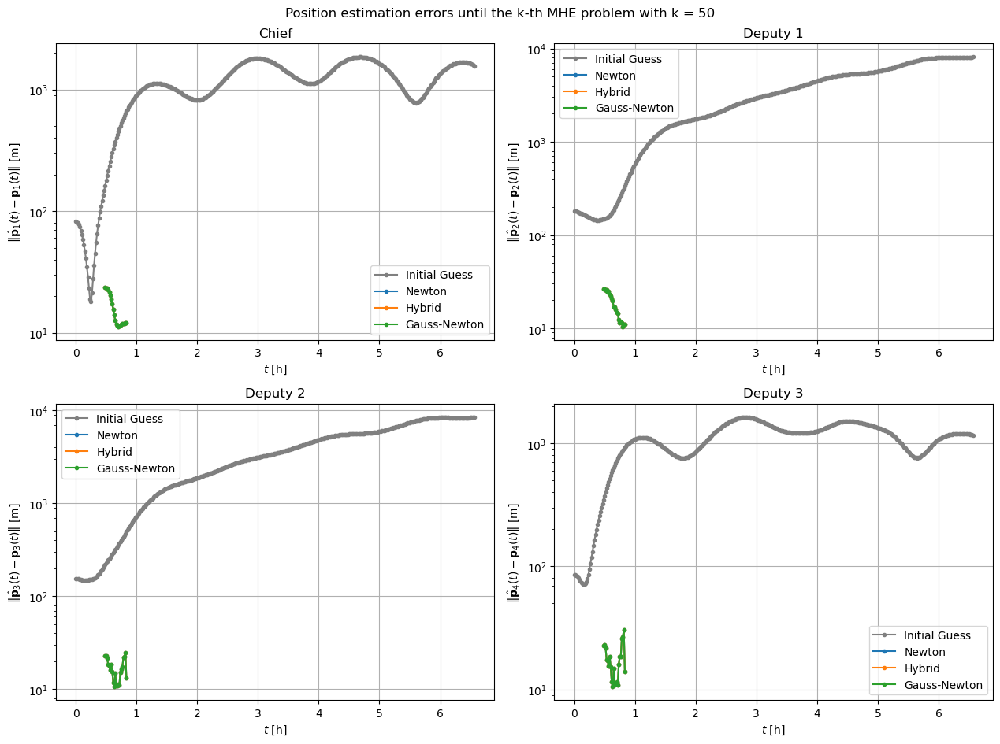

MHE problem:   6%|▌         | 22/366 [26:51<6:54:41, 72.33s/it]

[Hybrid] Before applying the algorithm
Cost function: 104407.50062193481
Gradient norm: 4757678.515893099
Global estimation error: 45.09257634052615
Initial conditions estimation errors: 10.047370863598413 m, 10.905993587125893 m, 28.896286026421492 m, 31.280184052340598 m
Position estimation errors: 14.589291669971962 m, 13.261941559653737 m, 14.647275667438032 m, 14.222796631632505 m

[Gauss-Newton] Before applying the algorithm
Cost function: 104407.50064681566
Gradient norm: 4757678.575215782
Global estimation error: 45.092575721017376
Spectral radius inv(T) @ R: 0.9999288222584275
T minimum eigenvalue: 0.07102306314119114
Initial conditions estimation errors: 10.047370863842817 m, 10.905993604896732 m, 28.896285599366387 m, 31.280183547509495 m
Position estimation errors: 14.589291689894319 m, 13.261941585381082 m, 14.647275633950292 m, 14.222796552343812 m

[Hybrid] Iteration 1
Cost function: 101615.51420710247 (-2.67%)
Gradient norm: 5217.270247472425 (-99.89%)
Global estimation

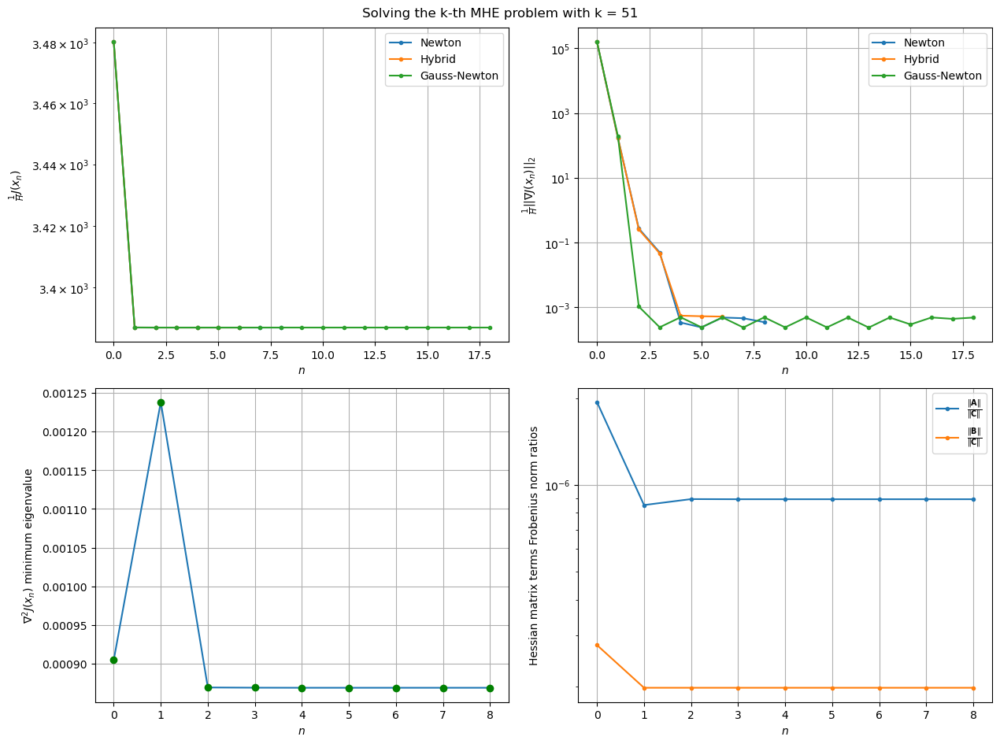

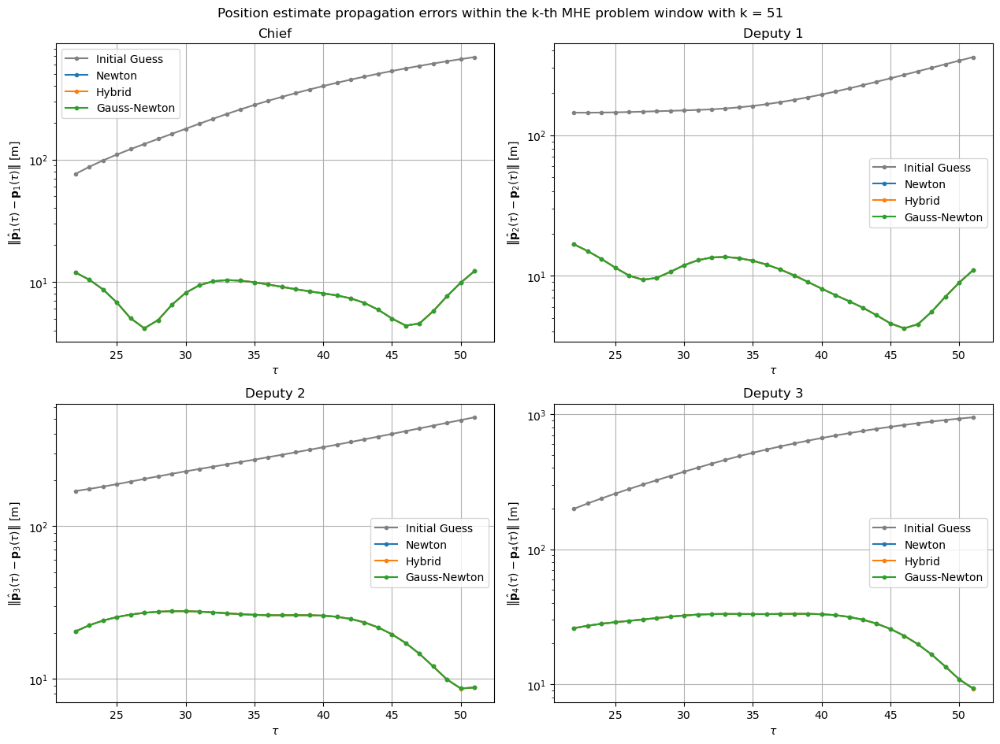

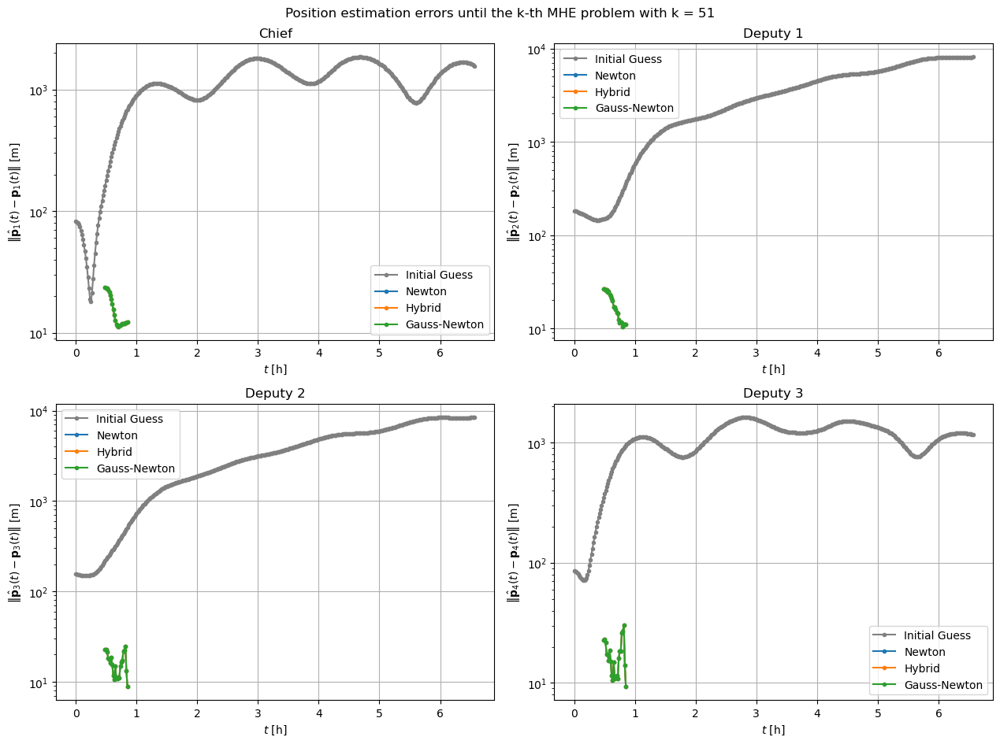

MHE problem:   6%|▋         | 23/366 [28:18<7:18:42, 76.74s/it]

[Hybrid] Before applying the algorithm
Cost function: 105755.34548456853
Gradient norm: 4681826.890194592
Global estimation error: 39.67646615362676
Initial conditions estimation errors: 10.409546077051115 m, 14.985858957091002 m, 22.478616520852242 m, 27.12913945142037 m
Position estimation errors: 14.724692029397076 m, 13.030854802635897 m, 10.366645470177478 m, 9.43962250997665 m

[Gauss-Newton] Before applying the algorithm
Cost function: 105755.34549521116
Gradient norm: 4681826.9216260025
Global estimation error: 39.67646647600186
Spectral radius inv(T) @ R: 0.9999198398806507
T minimum eigenvalue: 0.08282640568227778
Initial conditions estimation errors: 10.409546077038325 m, 14.985858975307458 m, 22.478616744173117 m, 27.12913972779819 m
Position estimation errors: 14.724692038948117 m, 13.030854820195144 m, 10.366645472419046 m, 9.439622532791786 m

[Hybrid] Iteration 1
Cost function: 102679.52730120532 (-2.91%)
Gradient norm: 1749.0617704969993 (-99.96%)
Global estimation err

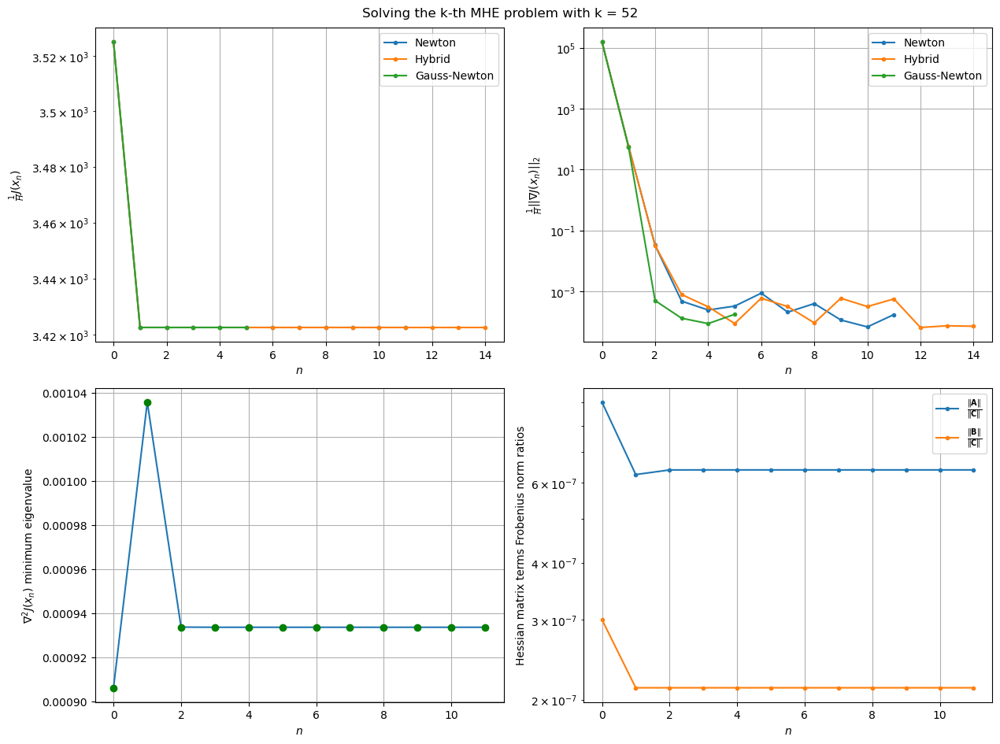

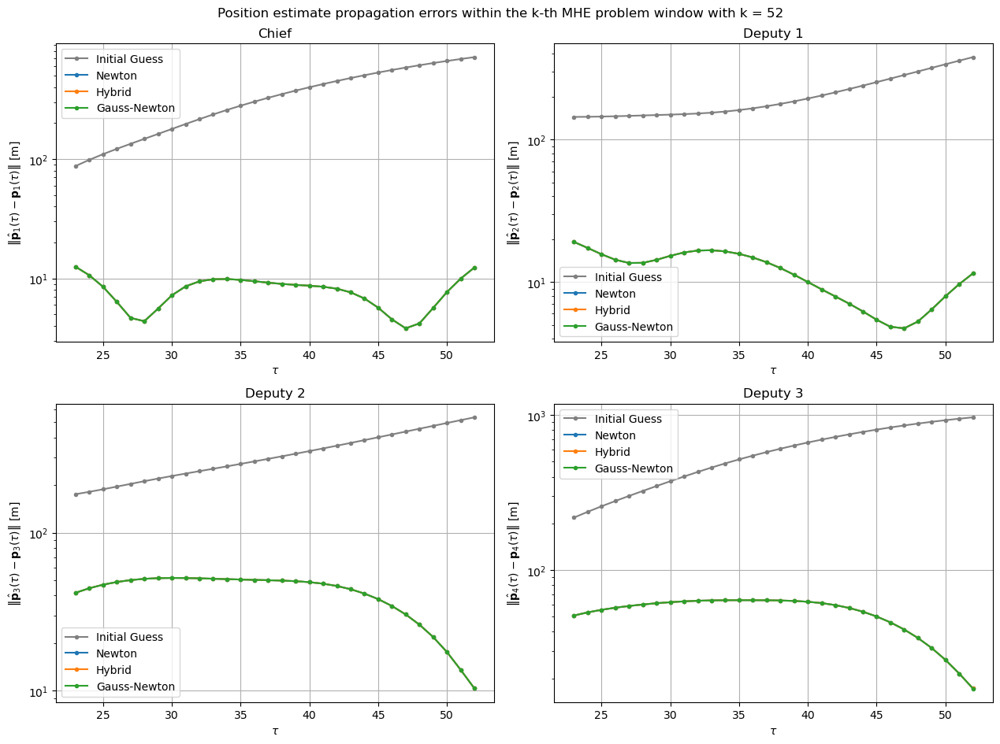

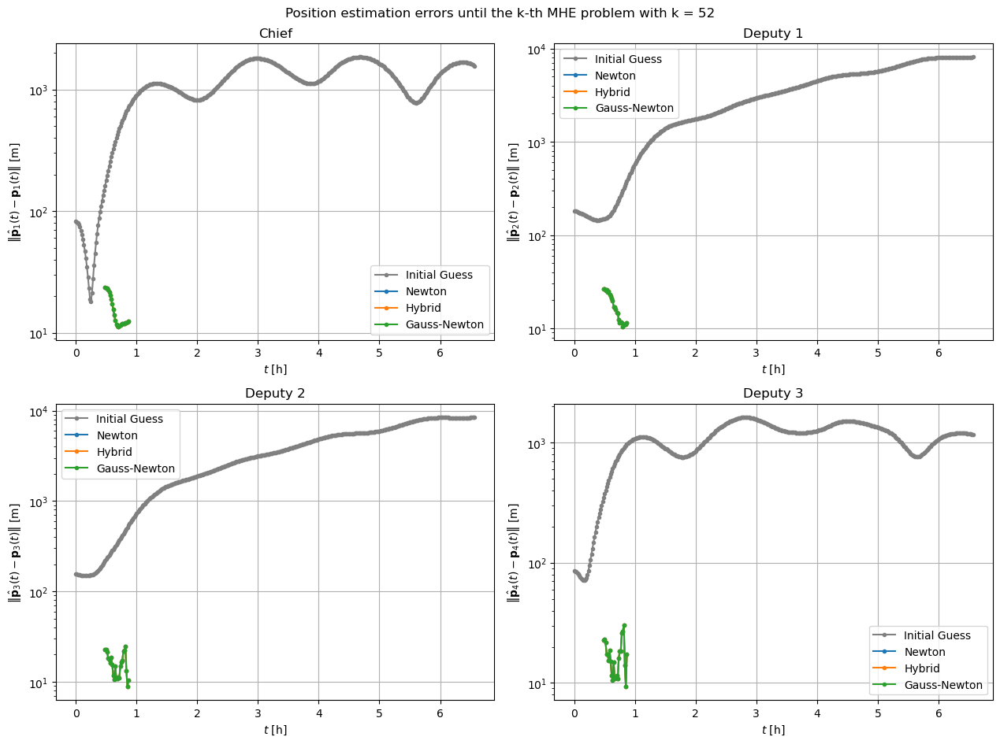

MHE problem:   7%|▋         | 24/366 [30:02<8:04:00, 84.91s/it]

[Hybrid] Before applying the algorithm
Cost function: 105790.85543414633
Gradient norm: 4490657.391141859
Global estimation error: 72.42839087421356
Initial conditions estimation errors: 10.624522881026438 m, 17.35050915601024 m, 44.50169855696032 m, 53.399780250325655 m
Position estimation errors: 14.845108327778702 m, 13.435470817568897 m, 9.065417242473531 m, 14.27776008735832 m

[Gauss-Newton] Before applying the algorithm
Cost function: 105790.85543653171
Gradient norm: 4490657.399275483
Global estimation error: 72.42839096764024
Spectral radius inv(T) @ R: 0.9999105578804852
T minimum eigenvalue: 0.09650418816029908
Initial conditions estimation errors: 10.624522881008645 m, 17.350509160487768 m, 44.5016986218758 m, 53.39978032149441 m
Position estimation errors: 14.845108330398508 m, 13.435470815717602 m, 9.065417232156564 m, 14.27776007552889 m

[Hybrid] Iteration 1
Cost function: 102471.11047721577 (-3.14%)
Gradient norm: 190.81560755959154 (-100.00%)
Global estimation error: 

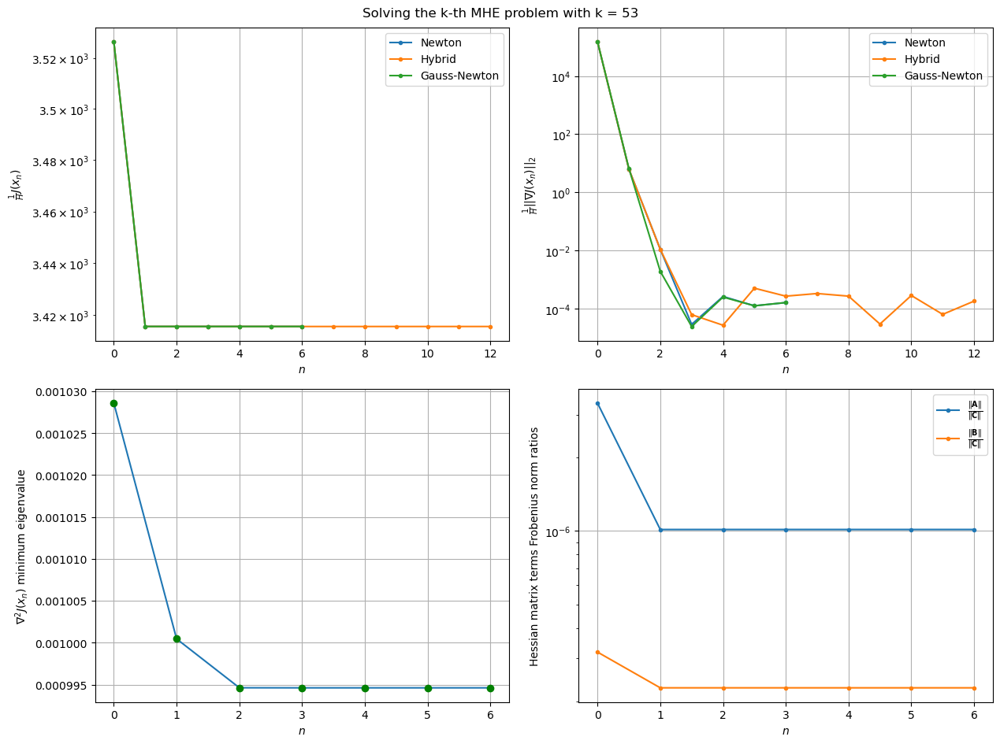

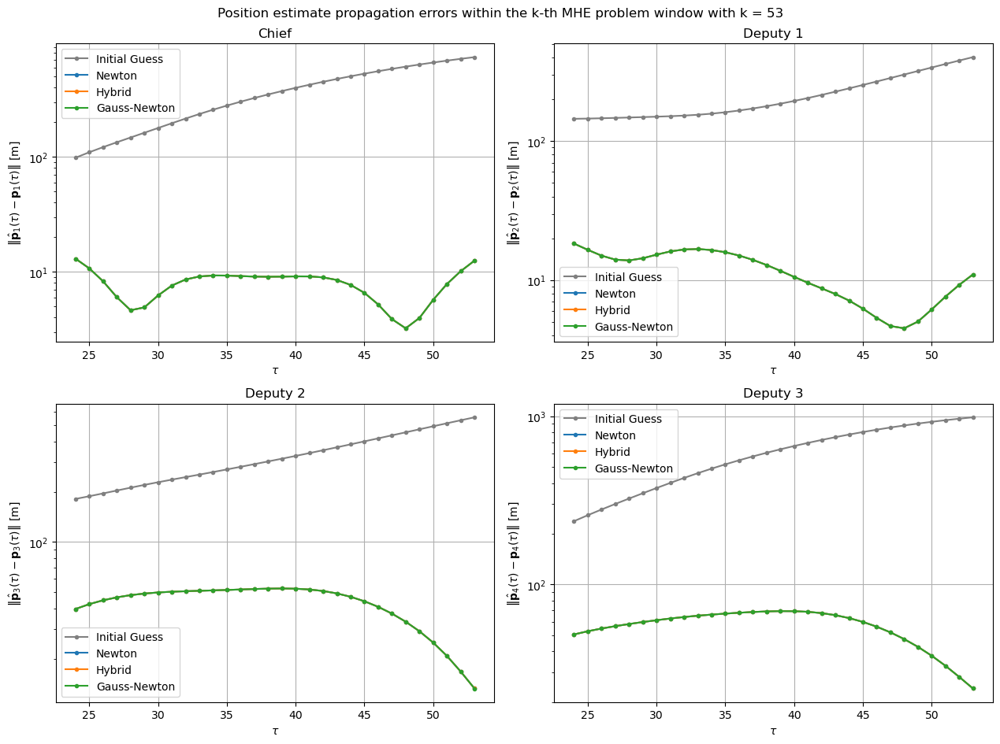

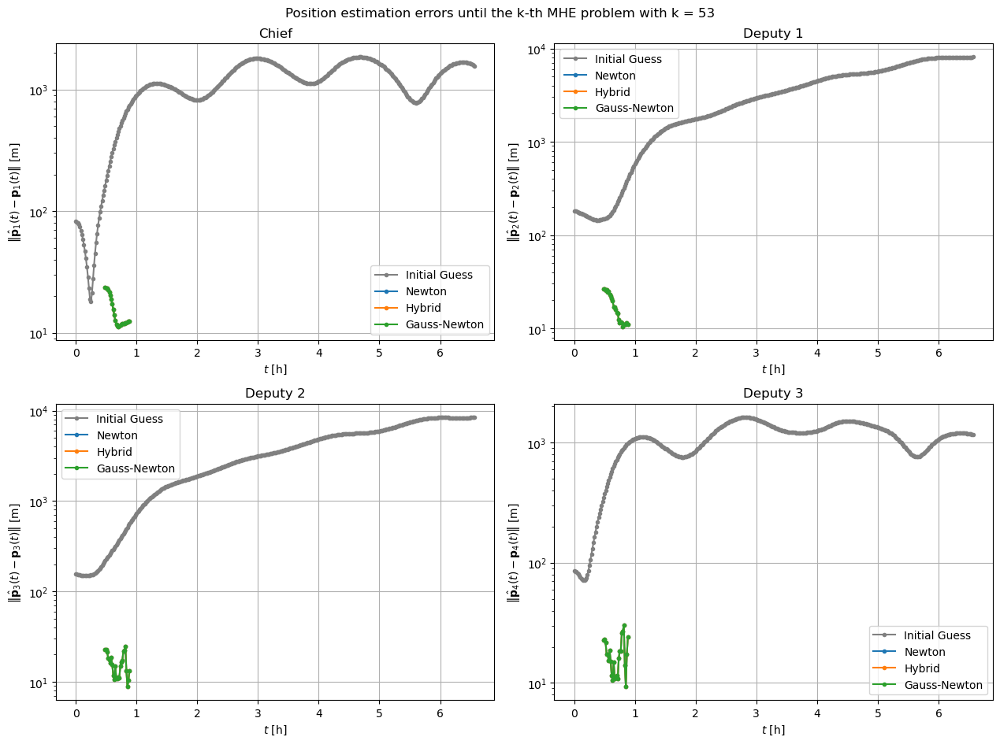

MHE problem:   7%|▋         | 25/366 [31:10<7:34:15, 79.93s/it]

[Hybrid] Before applying the algorithm
Cost function: 105059.78735358201
Gradient norm: 4314545.783975112
Global estimation error: 70.44617728235936
Initial conditions estimation errors: 10.716221166894666 m, 16.520616572733122 m, 42.427362604554226 m, 52.67634760805713 m
Position estimation errors: 15.007620467082113 m, 12.857915545288442 m, 11.072222663543581 m, 20.918746928936706 m

[Gauss-Newton] Before applying the algorithm
Cost function: 105059.7873561565
Gradient norm: 4314545.78412456
Global estimation error: 70.44617706479569
Spectral radius inv(T) @ R: 0.999901503025763
T minimum eigenvalue: 0.11268984149327015
Initial conditions estimation errors: 10.71622116595844 m, 16.520616555493802 m, 42.42736246956945 m, 52.6763474314195 m
Position estimation errors: 15.00762046699183 m, 12.857915542083637 m, 11.072222623383759 m, 20.918746842428757 m

[Hybrid] Iteration 1
Cost function: 101451.98765212671 (-3.43%)
Gradient norm: 26.05695938547595 (-100.00%)
Global estimation error: 6

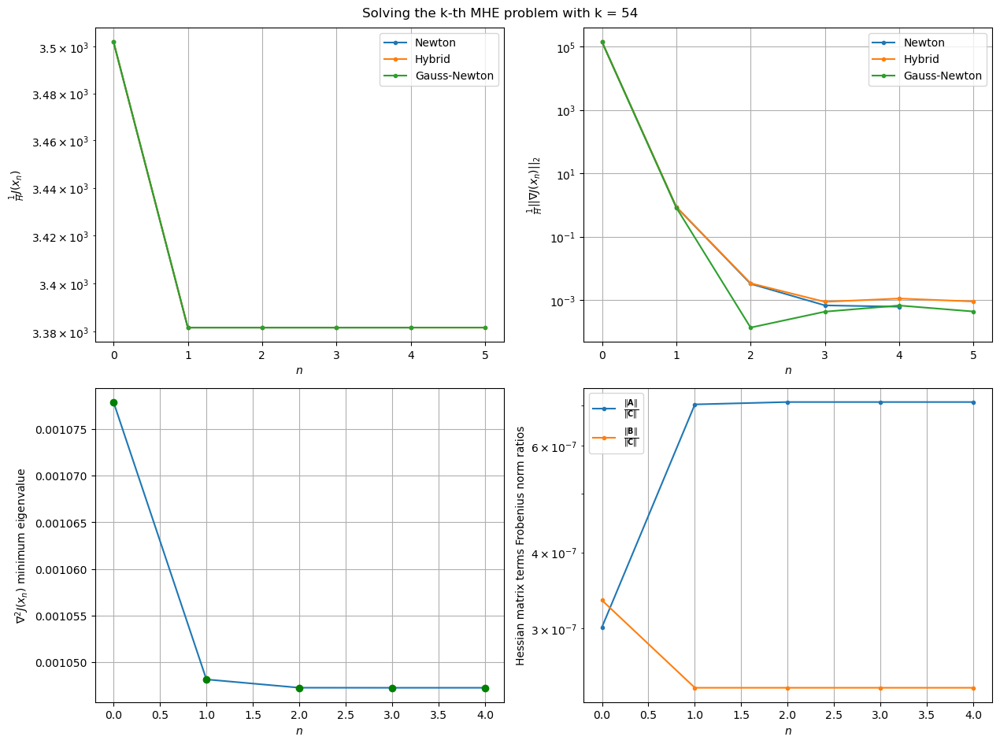

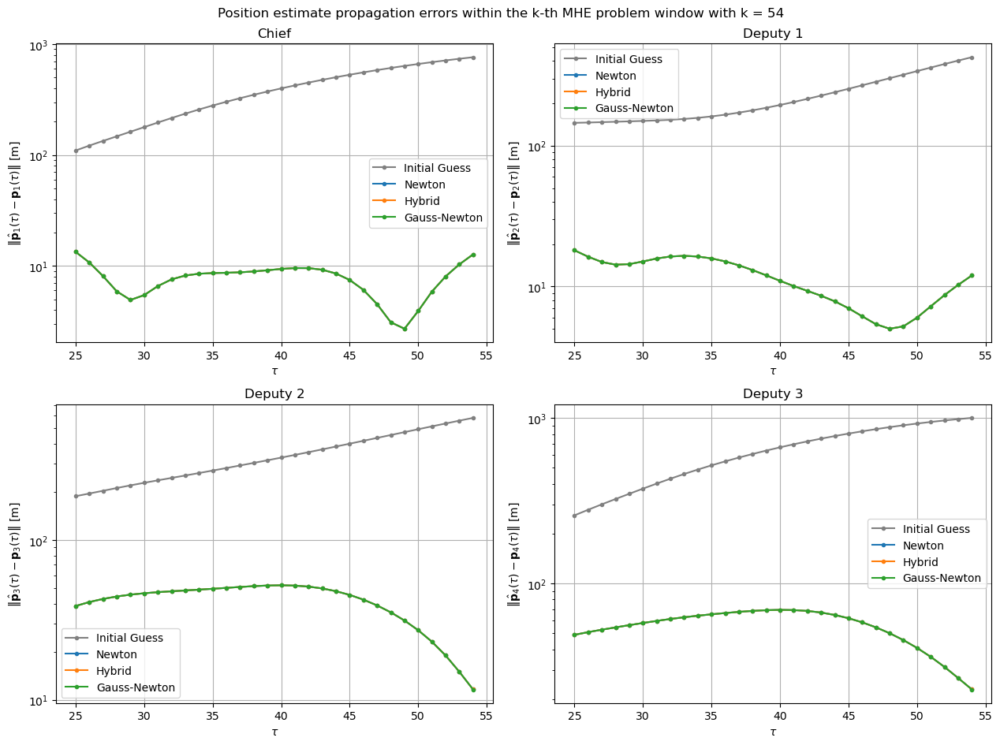

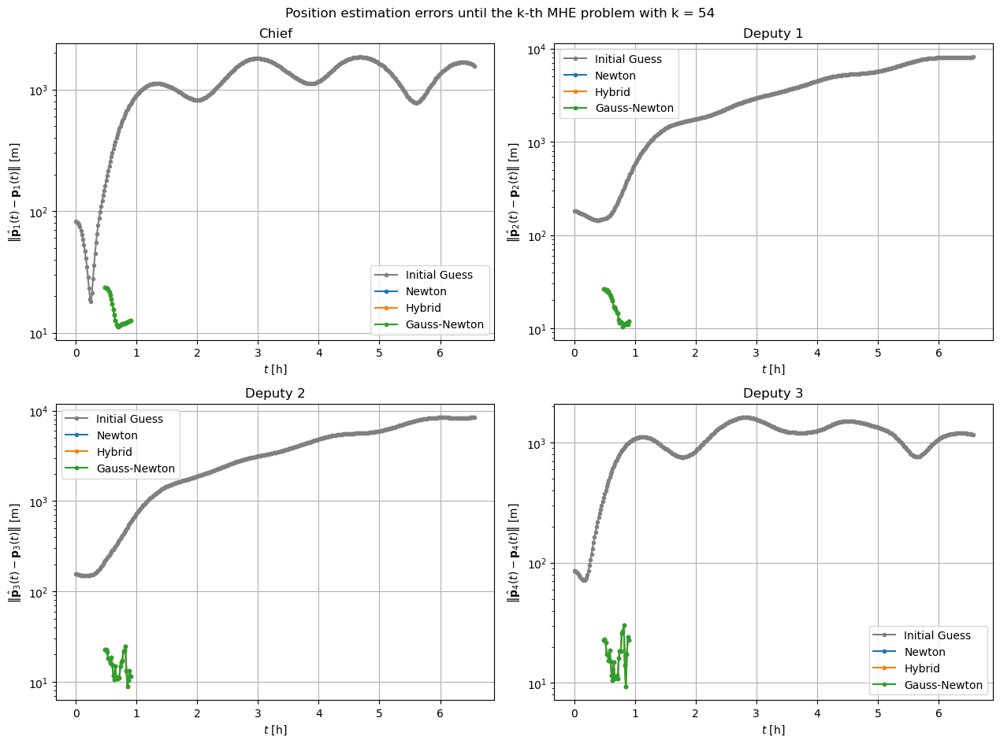

MHE problem:   7%|▋         | 26/366 [32:01<6:42:30, 71.03s/it]

[Hybrid] Before applying the algorithm
Cost function: 104537.6679770339
Gradient norm: 4277640.98758237
Global estimation error: 68.04729735727376
Initial conditions estimation errors: 10.732006363556177 m, 16.269538228716193 m, 40.91590495038251 m, 50.75855179622634 m
Position estimation errors: 15.202782019101388 m, 13.832493840205807 m, 9.766712650249787 m, 20.029110664869567 m

[Gauss-Newton] Before applying the algorithm
Cost function: 104537.66794994794
Gradient norm: 4277640.944105068
Global estimation error: 68.04729716148908
Spectral radius inv(T) @ R: 0.9998926737416965
T minimum eigenvalue: 0.13135200491670657
Initial conditions estimation errors: 10.732006363578318 m, 16.269538213968502 m, 40.91590482790619 m, 50.75855163720541 m
Position estimation errors: 15.202782002970284 m, 13.832493835616164 m, 9.766712633936201 m, 20.029110597040667 m

[Hybrid] Iteration 1
Cost function: 100684.37040271478 (-3.69%)
Gradient norm: 1721.700403992592 (-99.96%)
Global estimation error: 7

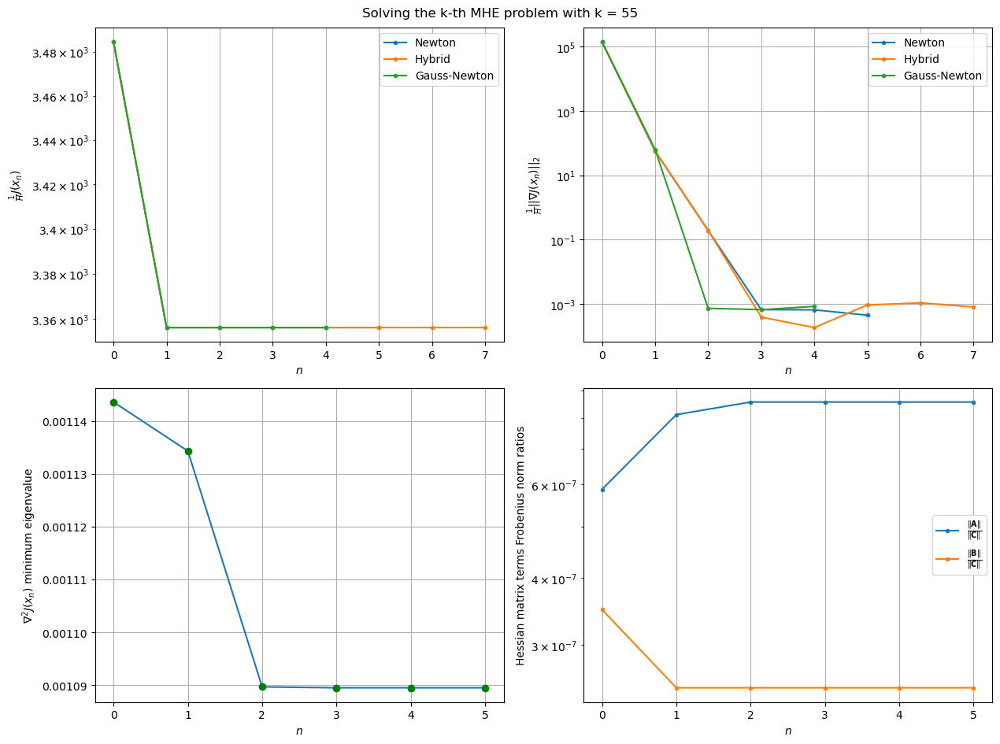

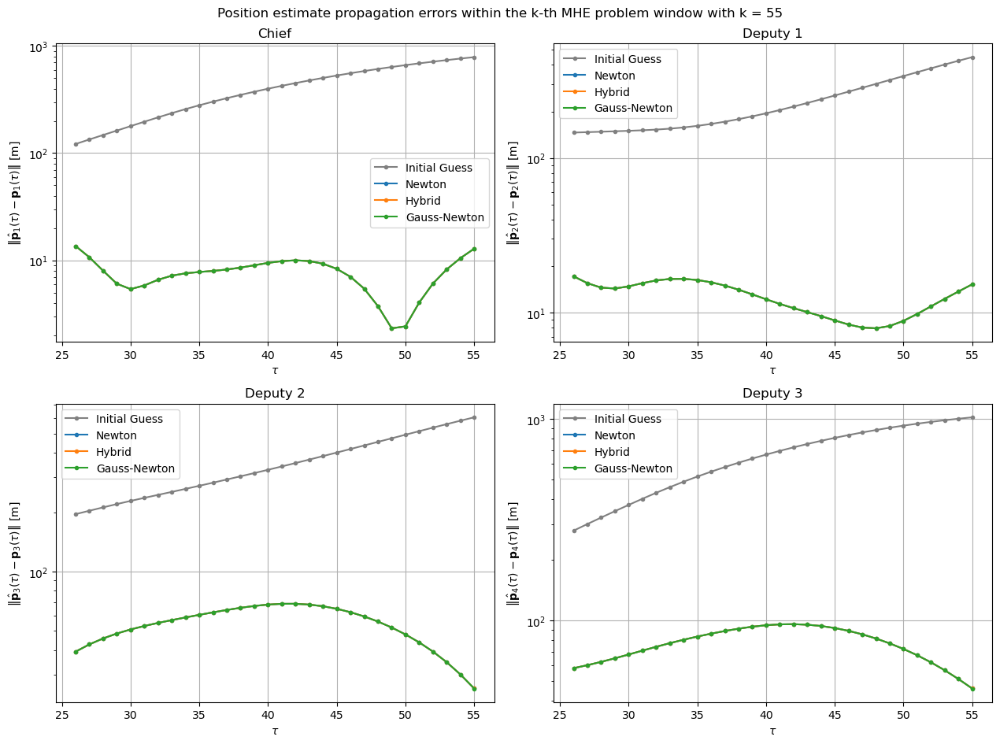

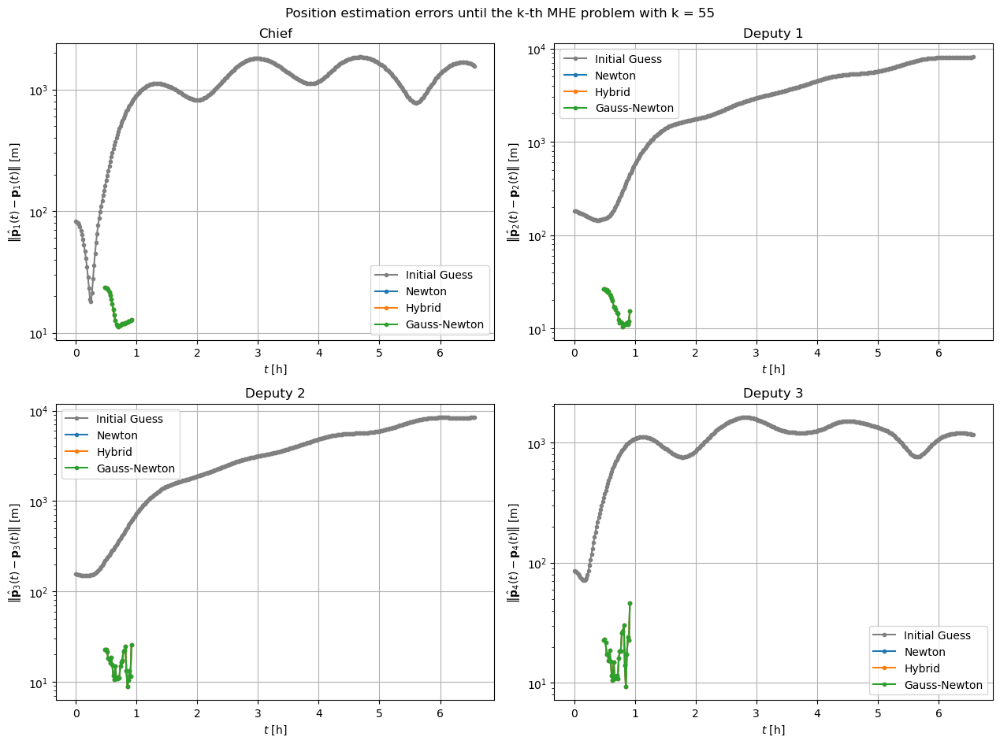

MHE problem:   7%|▋         | 27/366 [32:59<6:20:08, 67.28s/it]

[Hybrid] Before applying the algorithm
Cost function: 103110.6041782499
Gradient norm: 4124717.60835227
Global estimation error: 76.03804495539008
Initial conditions estimation errors: 10.670193543537255 m, 15.535502762935122 m, 42.77656849881271 m, 59.97262695083422 m
Position estimation errors: 15.368942595732799 m, 16.988286517056967 m, 21.369056192992783 m, 41.1162819124804 m

[Gauss-Newton] Before applying the algorithm
Cost function: 103110.60419095526
Gradient norm: 4124717.659480595
Global estimation error: 76.03804457916134
Spectral radius inv(T) @ R: 0.9998833394432532
T minimum eigenvalue: 0.15350391211512732
Initial conditions estimation errors: 10.670193543740268 m, 15.53550273260394 m, 42.776568259705016 m, 59.9726266521912 m
Position estimation errors: 15.36894260886036 m, 16.98828649702367 m, 21.369056092522452 m, 41.11628174488274 m

[Hybrid] Iteration 1
Cost function: 99004.51741905922 (-3.98%)
Gradient norm: 4349.851206219107 (-99.89%)
Global estimation error: 42.430

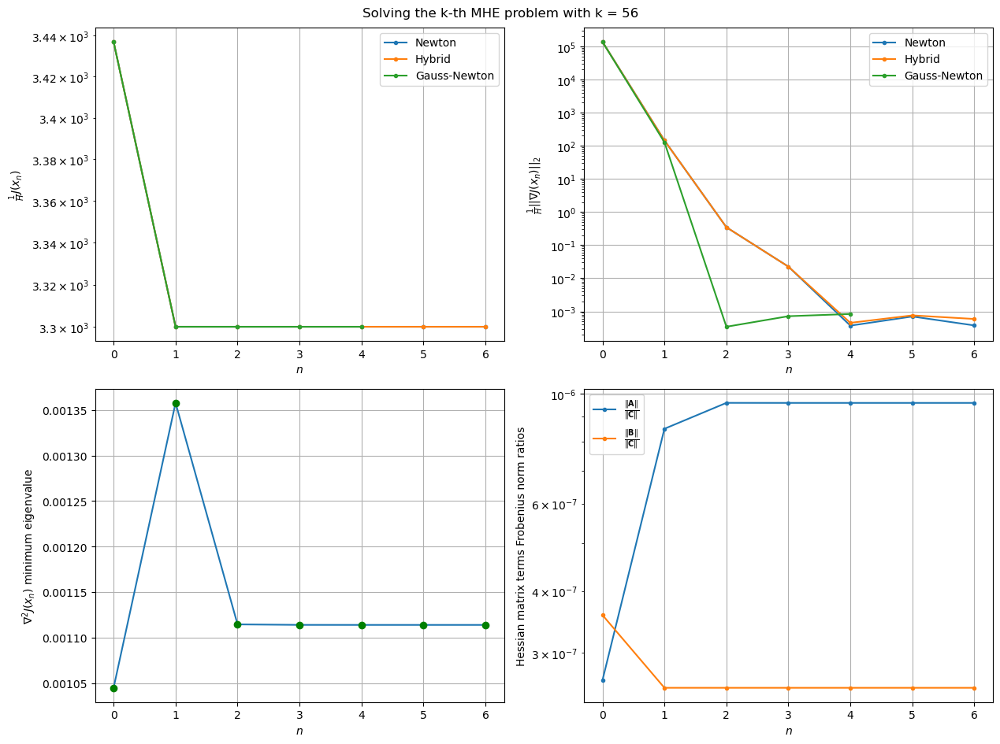

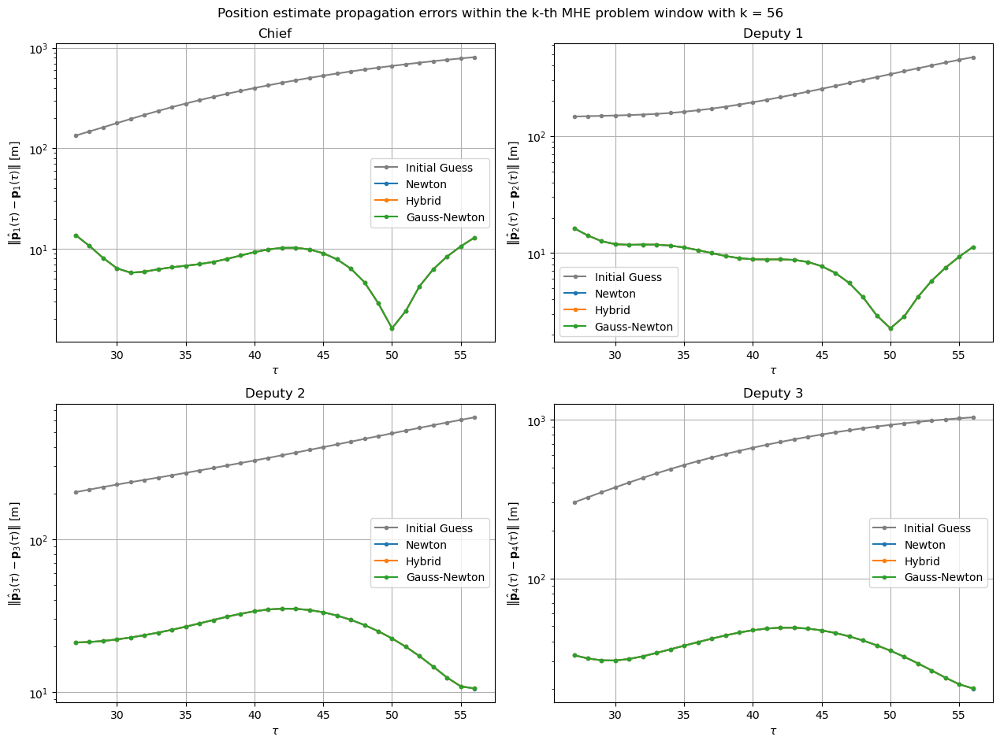

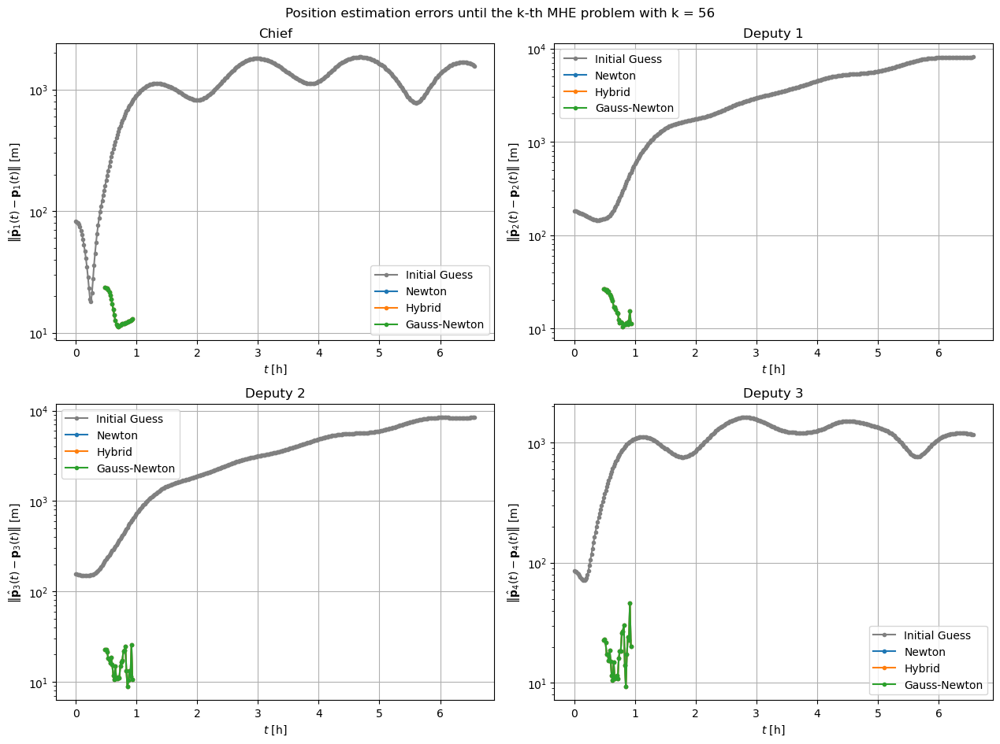

MHE problem:   8%|▊         | 28/366 [34:05<6:17:25, 67.00s/it]

[Hybrid] Before applying the algorithm
Cost function: 101719.86397549289
Gradient norm: 3990902.661786402
Global estimation error: 41.7515027642345
Initial conditions estimation errors: 10.674349907488908 m, 14.113858670997052 m, 21.244725909370306 m, 31.283932413496252 m
Position estimation errors: 15.51583759607783 m, 13.471907551805272 m, 11.71182851456141 m, 20.20616152894644 m

[Gauss-Newton] Before applying the algorithm
Cost function: 101719.86399078714
Gradient norm: 3990902.7066794755
Global estimation error: 41.751502402576534
Spectral radius inv(T) @ R: 0.9998718334718767
T minimum eigenvalue: 0.17897314289166957
Initial conditions estimation errors: 10.67434990740424 m, 14.113858632112283 m, 21.244725671864252 m, 31.283932109689516 m
Position estimation errors: 15.515837607453497 m, 13.471907530593093 m, 11.711828520350746 m, 20.20616139486138 m

[Hybrid] Iteration 1
Cost function: 97471.45351846407 (-4.18%)
Gradient norm: 3839.6848562517334 (-99.90%)
Global estimation erro

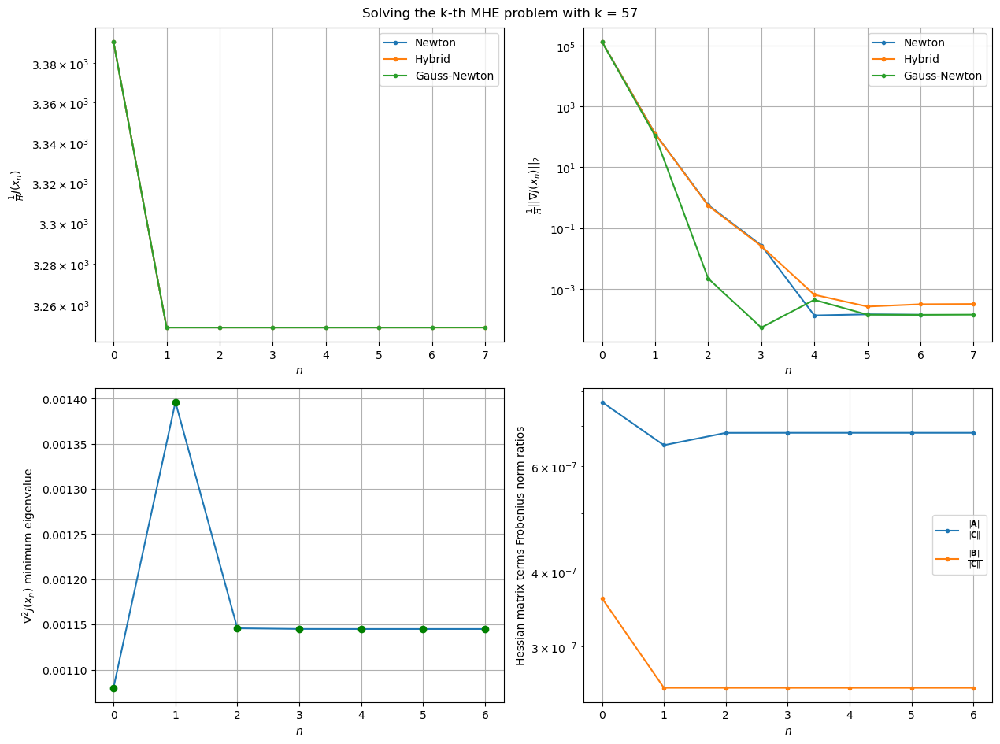

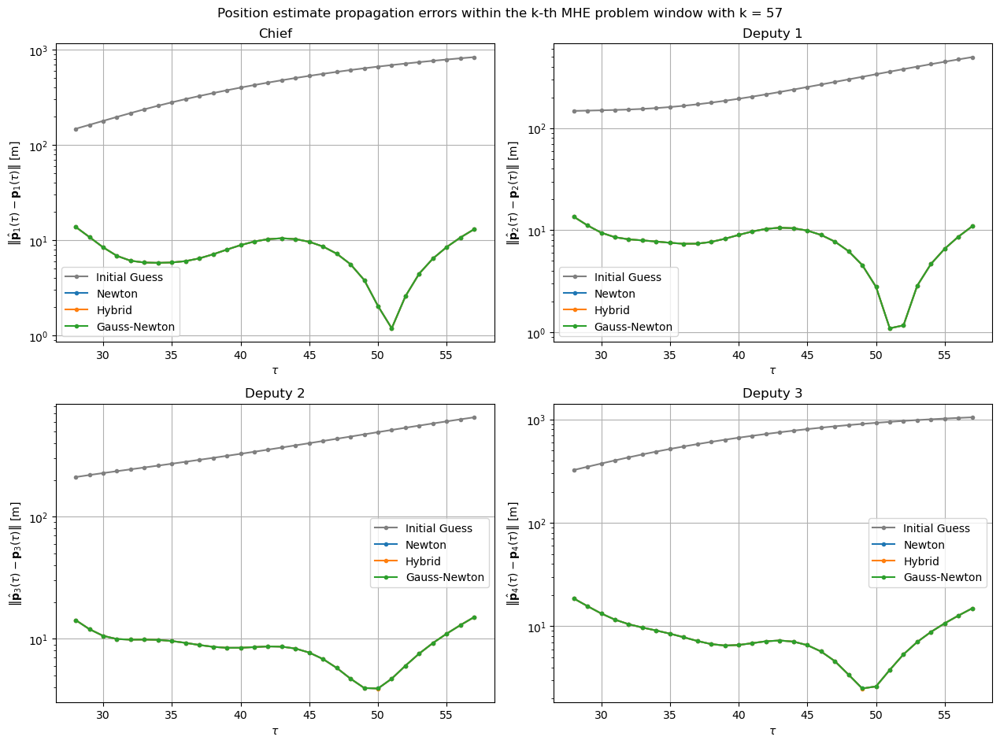

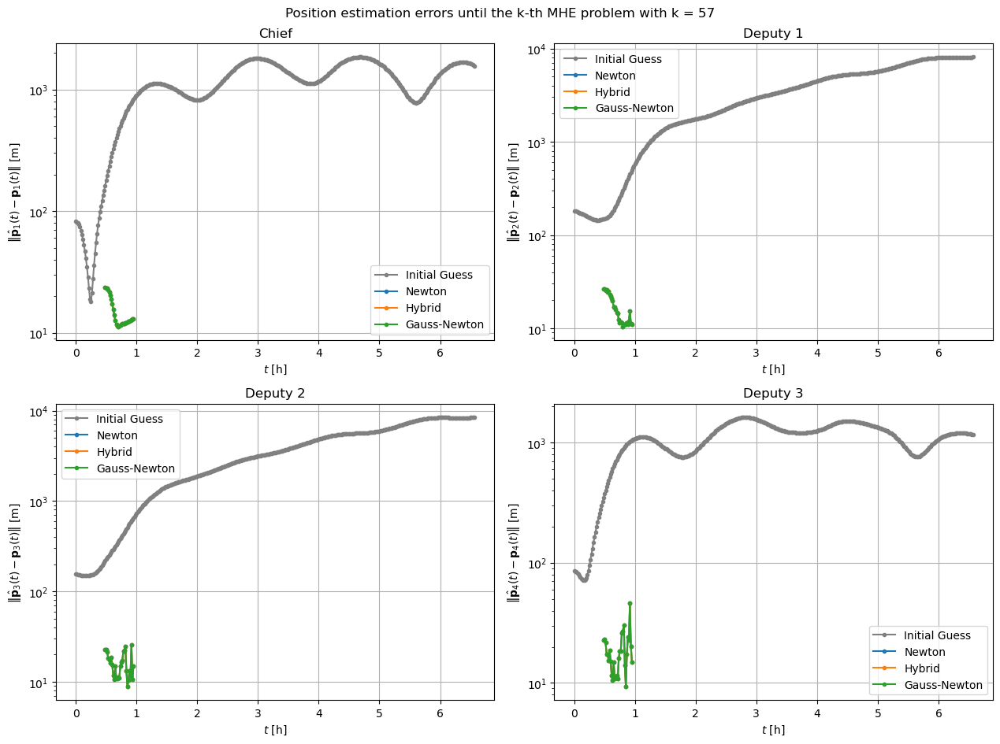

MHE problem:   8%|▊         | 29/366 [35:14<6:18:31, 67.39s/it]

[Hybrid] Before applying the algorithm
Cost function: 99961.78096837977
Gradient norm: 3977566.646945457
Global estimation error: 25.09744175228088
Initial conditions estimation errors: 10.771967947724256 m, 11.153231354728394 m, 12.008871738450944 m, 15.659500927765635 m
Position estimation errors: 15.58558723510944 m, 13.418865322167726 m, 17.409336796629916 m, 17.351262751216986 m

[Gauss-Newton] Before applying the algorithm
Cost function: 99961.7809666059
Gradient norm: 3977566.6601811037
Global estimation error: 25.097442041600054
Spectral radius inv(T) @ R: 0.9998542098433175
T minimum eigenvalue: 0.20771616101349688
Initial conditions estimation errors: 10.771967947115975 m, 11.153231309721564 m, 12.008872007110634 m, 15.65950121790234 m
Position estimation errors: 15.585587236486951 m, 13.418865292752994 m, 17.409337001190472 m, 17.351262971417068 m

[Hybrid] Iteration 1
Cost function: 95648.85573976608 (-4.31%)
Gradient norm: 66.66808704228146 (-100.00%)
Global estimation err

Process ForkProcess-359:
Process ForkProcess-357:
Process ForkProcess-358:
Process ForkProcess-356:
Process ForkProcess-360:
Process ForkProcess-353:
Process ForkProcess-354:
Process ForkProcess-355:
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkProcess-352:
Process ForkProcess-350:
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkProcess-351:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/joaomarafuzgaspar/.conda/envs/spacesim-toolkit/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/joaomarafuzgaspar/.conda/envs/spacesim-toolkit/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/joaomarafuzgaspar/.conda/envs/spacesim-toolkit/lib/python3.11/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **sel

In [ ]:
# Initialize storage arrays for state estimates
X_est_newton_history = np.zeros((n, 1, K))  # Newton
X_est_hybrid_history = np.zeros((n, 1, K))  # Hybrid
X_est_gauss_newton_history = np.zeros((n, 1, K))  # Gauss-Newton

def solve_MHE_problem(algorithm_name, algorithm, k, dt, Y, x_init, x_true_initial, x_true_end):
    if algorithm_name == "Newton":
        x_est_start, x_est_end = algorithm.solve_MHE_problem_with_metrics(k, dt, Y, x_init, x_true_initial, x_true_end)
        return algorithm_name, x_est_start, x_est_end, algorithm.cost_values.copy(), algorithm.gradient_norm_values.copy(), algorithm.HJ_x_eigenvalues_history.copy(), algorithm.A_norm_history.copy(), algorithm.B_norm_history.copy(), algorithm.C_norm_history.copy()
    elif algorithm_name == "Hybrid":
        x_est_start, x_est_end = algorithm.solve_MHE_problem(k, dt, Y, x_init, x_true_initial, x_true_end)
        return algorithm_name, x_est_start, x_est_end, algorithm.cost_values.copy(), algorithm.gradient_norm_values.copy()
    elif algorithm_name == "Gauss-Newton":
        x_est_start, x_est_end = algorithm.solve_MHE_problem_with_metrics(k, dt, Y, x_init, x_true_initial, x_true_end)
        return algorithm_name, x_est_start, x_est_end, algorithm.cost_values.copy(), algorithm.gradient_norm_values.copy()
    else:
        return None

# ================= MAIN EXECUTION =================

# Cold-start
x_init = X_initial + np.random.multivariate_normal(np.zeros(n), P_0).reshape((n, 1))
x_init_newton = x_init.copy()
x_init_hybrid = x_init.copy()
x_init_gauss_newton = x_init.copy()

for k in tqdm(range(H - 1, K), desc="MHE problem", leave=False):
    with ProcessPoolExecutor(max_workers=12) as executor:
        # Run each algorithm in parallel
        data_algorithms = {
            executor.submit(solve_MHE_problem, "Newton", newton, k, dt, Y, x_init_newton, X_true[:, :, k - H + 1],  X_true[:, :, k]): "Newton",
            executor.submit(solve_MHE_problem, "Hybrid", hybrid, k, dt, Y, x_init_hybrid, X_true[:, :, k - H + 1],  X_true[:, :, k]): "Hybrid",
            executor.submit(solve_MHE_problem, "Gauss-Newton", gauss_newton, k, dt, Y, x_init_gauss_newton, X_true[:, :, k - H + 1],  X_true[:, :, k]): "Gauss-Newton",
        }

        # Retrieve results in the main process
        results = {data_algorithm.result()[0]: data_algorithm.result()[1:] for data_algorithm in data_algorithms}

    # Extract updated estimates
    x_init_newton, X_est_newton_history[:, :, k], cost_newton, grad_newton, HJ_x_eigenvalues_history, A_norm_history, B_norm_history, C_norm_history = results["Newton"]
    x_init_hybrid, X_est_hybrid_history[:, :, k], cost_hybrid, grad_hybrid = results["Hybrid"]
    x_init_gauss_newton, X_est_gauss_newton_history[:, :, k], cost_gauss_newton, grad_gauss_newton = results["Gauss-Newton"]
     
    # ================= First Plot =================
    # Plot results **in the main process**
    fig, axs = plt.subplots(2, 2, figsize=(2 * 6.4, 2 * 4.8))
    axs = axs.flatten()

    # Cost function values
    axs[0].plot(1 / H * np.array(cost_newton), '.-', label='Newton')
    axs[0].plot(1 / H * np.array(cost_hybrid), '.-', label='Hybrid')
    axs[0].plot(1 / H * np.array(cost_gauss_newton), '.-', label='Gauss-Newton')
    axs[0].set_xlabel(r'$n$')
    axs[0].set_ylabel(r'$\frac{1}{H}J(x_n)$')
    axs[0].set_yscale('log')
    axs[0].grid(True)
    axs[0].legend()

    # Gradient norm values
    axs[1].plot(1 / H * np.array(grad_newton), '.-', label='Newton')
    axs[1].plot(1 / H * np.array(grad_hybrid), '.-', label='Hybrid')
    axs[1].plot(1 / H * np.array(grad_gauss_newton), '.-', label='Gauss-Newton')
    axs[1].set_xlabel(r'$n$')
    axs[1].set_ylabel(r'$\frac{1}{H}||\nabla J(x_n)||_2$')
    axs[1].set_yscale('log')
    axs[1].grid(True)
    axs[1].legend()
    
    # Hessian minimum maximum eigenvalue over iterations
    HJ_x_min_eigenvalues = [min(HJ_x_eigenvalues) for HJ_x_eigenvalues in HJ_x_eigenvalues_history]
    axs[2].plot(HJ_x_min_eigenvalues, '.-', label=r'\frac{\|\mathbf{A}\|}{\|\mathbf{C}\|}')
    for i, (x, y) in enumerate(zip(np.arange(len(HJ_x_eigenvalues_history)), HJ_x_min_eigenvalues)):
        if y > 0:
            color = 'green'
        elif y == 0:
            color = 'yellow'
        else:
            color = 'red'
        axs[2].plot(x, y, marker='o', color=color, markersize=6)
    axs[2].set_xlabel(r'$n$')
    axs[2].set_ylabel(r'$\nabla^2 J(x_n)$ minimum eigenvalue')
    axs[2].grid()
    
    # Hessian matrix terms ratios (A - observations second-order partials, B - dynamics second-order partials, C - Gauss-Newton) over iterations
    axs[3].semilogy(np.array(A_norm_history) / np.array(C_norm_history), '.-', label=r'$\frac{\|\mathbf{A}\|}{\|\mathbf{C}\|}$')
    axs[3].semilogy(np.array(B_norm_history) / np.array(C_norm_history), '.-', label=r'$\frac{\|\mathbf{B}\|}{\|\mathbf{C}\|}$')
    axs[3].set_xlabel(r'$n$')
    axs[3].set_ylabel('Hessian matrix terms Frobenius norm ratios')
    axs[3].legend()
    axs[3].grid()
    
    fig.suptitle(f'Solving the k-th MHE problem with k = {k}')
    plt.tight_layout() 
    plt.show()
    
    # ================= Second Plot =================
    # Initialize storage for current estimates
    X_est_newton_current = np.zeros((24, 1, H))
    X_est_hybrid_current = np.zeros((24, 1, H))
    X_est_gauss_newton_current = np.zeros((24, 1, H))
    
    # Simulate forward propagation over the window
    X_est_newton_current[:, :, 0] = x_init_newton
    X_est_hybrid_current[:, :, 0] = x_init_hybrid
    X_est_gauss_newton_current[:, :, 0] = x_init_gauss_newton
    for tau in range(H - 1):
        X_est_newton_current[:, :, tau + 1] = dyn.f(dt, X_est_newton_current[:, :, tau])
        X_est_hybrid_current[:, :, tau + 1] = dyn.f(dt, X_est_hybrid_current[:, :, tau])
        X_est_gauss_newton_current[:, :, tau + 1] = dyn.f(dt, X_est_gauss_newton_current[:, :, tau])
    
    # Compute position estimation errors
    dev_chief_newton_current, dev_deputy1_newton_current, dev_deputy2_newton_current, dev_deputy3_newton_current = position_estimation_error(X_est_newton_current, X_true[:, :, k - H + 1 : k + 1])
    dev_chief_hybrid_current, dev_deputy1_hybrid_current, dev_deputy2_hybrid_current, dev_deputy3_hybrid_current = position_estimation_error(X_est_hybrid_current, X_true[:, :, k - H + 1 : k + 1])
    dev_chief_gauss_newton_current, dev_deputy1_gauss_newton_current, dev_deputy2_gauss_newton_current, dev_deputy3_gauss_newton_current = position_estimation_error(X_est_gauss_newton_current, X_true[:, :, k - H + 1 : k + 1])
    
    # Plot results **in the main process**
    fig, axs = plt.subplots(2, 2, figsize=(2 * 6.4, 2 * 4.8))
    axs = axs.flatten()
    
    # Plot position estimation errors within the current window
    agent_names = ['Chief', 'Deputy 1', 'Deputy 2', 'Deputy 3']
    agent_initial_errors = [position_estimation_error_1_initial, position_estimation_error_2_initial, position_estimation_error_3_initial, position_estimation_error_4_initial]
    agent_newton = [dev_chief_newton_current, dev_deputy1_newton_current, dev_deputy2_newton_current, dev_deputy3_newton_current]
    agent_hybrid = [dev_chief_hybrid_current, dev_deputy1_hybrid_current, dev_deputy2_hybrid_current, dev_deputy3_hybrid_current]
    agent_gauss_newton = [dev_chief_gauss_newton_current, dev_deputy1_gauss_newton_current, dev_deputy2_gauss_newton_current, dev_deputy3_gauss_newton_current]
    for i in range(N):
        ax = axs[i]
        ax.set_title(agent_names[i])
        ax.plot(np.arange(k - H + 1, k + 1), agent_initial_errors[i][k - H + 1: k + 1], linestyle='-', color='grey', marker='.', label='Initial Guess')
        ax.plot(np.arange(k - H + 1, k + 1), agent_newton[i], linestyle='-', color='C0', marker='.', label='Newton')
        ax.plot(np.arange(k - H + 1, k + 1), agent_hybrid[i], linestyle='-', color='C1', marker='.', label='Hybrid')
        ax.plot(np.arange(k - H + 1, k + 1), agent_gauss_newton[i], linestyle='-', color='C2', marker='.', label='Gauss-Newton')
        ax.set_xlabel(r'$\tau$')
        ax.set_ylabel(rf'$\left\|\hat{{\mathbf{{p}}}}_{{{i+1}}}(\tau) - \mathbf{{p}}_{{{i+1}}}(\tau)\right\|$ [m]')
        ax.set_yscale('log')
        ax.grid(True)
        ax.legend()
        
    fig.suptitle(f'Position estimate propagation errors within the k-th MHE problem window with k = {k}')
    plt.tight_layout() 
    plt.show()
    
    # ================= Third Plot =================
    # Compute position estimation errors
    position_estimation_error_1_newton, position_estimation_error_2_newton, position_estimation_error_3_newton, position_estimation_error_4_newton = position_estimation_error(X_est_newton_history[:, :, H - 1 : k + 1], X_true[:, :, H - 1 : k + 1])
    position_estimation_error_1_hybrid, position_estimation_error_2_hybrid, position_estimation_error_3_hybrid, position_estimation_error_4_hybrid = position_estimation_error(X_est_hybrid_history[:, :, H - 1 : k + 1], X_true[:, :, H - 1 : k + 1])
    position_estimation_error_1_gauss_newton, position_estimation_error_2_gauss_newton, position_estimation_error_3_gauss_newton, position_estimation_error_4_gauss_newton = position_estimation_error(X_est_gauss_newton_history[:, :, H - 1 : k + 1], X_true[:, :, H - 1 : k + 1])
    
    # Plot results **in the main process**
    fig, axs = plt.subplots(2, 2, figsize=(2 * 6.4, 2 * 4.8))
    axs = axs.flatten()
    
    # Plot position estimation errors within the current window
    time = np.arange(0, K) / dt
    agent_names = ['Chief', 'Deputy 1', 'Deputy 2', 'Deputy 3']
    agent_initial_errors = [position_estimation_error_1_initial, position_estimation_error_2_initial, position_estimation_error_3_initial, position_estimation_error_4_initial]
    agent_newton = [position_estimation_error_1_newton, position_estimation_error_2_newton, position_estimation_error_3_newton, position_estimation_error_4_newton]
    agent_hybrid = [position_estimation_error_1_hybrid, position_estimation_error_2_hybrid, position_estimation_error_3_hybrid, position_estimation_error_4_hybrid]
    agent_gauss_newton = [position_estimation_error_1_gauss_newton, position_estimation_error_2_gauss_newton, position_estimation_error_3_gauss_newton, position_estimation_error_4_gauss_newton]
    for i in range(N):
        ax = axs[i]
        ax.set_title(agent_names[i])
        ax.plot(time, agent_initial_errors[i], linestyle='-', color='grey', marker='.', label='Initial Guess')
        ax.plot(time[H - 1 : k + 1], agent_newton[i], linestyle='-', color='C0', marker='.', label='Newton')
        ax.plot(time[H - 1 : k + 1], agent_hybrid[i], linestyle='-', color='C1', marker='.', label='Hybrid')
        ax.plot(time[H - 1 : k + 1], agent_gauss_newton[i], linestyle='-', color='C2', marker='.', label='Gauss-Newton')
        ax.set_xlabel(r'$t$ [h]')
        ax.set_ylabel(rf'$\left\|\hat{{\mathbf{{p}}}}_{{{i+1}}}(t) - \mathbf{{p}}_{{{i+1}}}(t)\right\|$ [m]')
        ax.set_yscale('log')
        ax.grid(True)
        ax.legend()
    
    fig.suptitle(f'Position estimation errors until the k-th MHE problem with k = {k}')
    plt.tight_layout() 
    plt.show()

    # Update state estimates
    x_init_newton = dyn.f(dt, x_init_newton)
    x_init_hybrid = dyn.f(dt, x_init_hybrid)
    x_init_gauss_newton = dyn.f(dt, x_init_gauss_newton)